In [142]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from scipy.stats import linregress
sns.set(context= 'talk',style='ticks',font_scale=1,rc ={'axes.spines.right': False,'axes.spines.top': False,'pdf.fonttype':42,},palette='colorblind')

# A Look at growth curves for the SynCom ratios experiment 
* Biomass was fixed and composition varied from 5% to 98% 3H11
* For growth analysis of nitrate variation experiment see Jupyter notebook in Growht_kinetics/Nitrate/SynCom

In [4]:
data=pd.read_csv('data/9M6D.csv',header=None).iloc[:,1:]
data.index=data[1]
data=data.drop(1,axis=1)
data.index=data.index.astype(int)/3600000
data.index.name='Time (hrs)'
data=data.dropna(axis=1)
data.columns=['%s%s'%(i,j) for i in 'ABCDEFGH' for j in range(1,9) ]
data

,A1,A2,A3,A4,A5,A6,A7,A8,B1,B2,...,G7,G8,H1,H2,H3,H4,H5,H6,H7,H8
Time (hrs),,,,,,,,,,,,,,,,,,,,,
2.777778e-07,937,1021,1147,688,899,1314,1314,1003,1084,646,...,765,726,926,838,947,978,987,925,986,1019
3.339556e-02,1623,1631,1677,1627,1633,1650,1644,1615,1574,1589,...,1600,1615,1594,1608,1608,1620,1621,1609,1590,1622
3.689808e-01,1607,1581,1677,1627,1605,1561,1618,1604,1500,1560,...,1592,1593,1599,1599,1581,1603,1609,1626,1572,1622
7.023231e-01,1598,1542,1674,1624,1904,1500,1588,1543,1517,1549,...,1571,1574,1586,1600,1569,1582,1592,1621,1542,1602
1.035669e+00,1591,1515,1676,1611,1555,1450,1552,1514,1514,1541,...,1560,1560,1588,1606,1563,1579,1582,1626,1508,1597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3.458863e+02,6837,6962,7217,4781,6648,9078,9401,7082,7032,4840,...,5378,5138,6059,5968,5879,6074,6131,7273,6370,7042
3.460530e+02,6835,6965,7208,4780,6647,9081,9400,7079,7034,4841,...,5378,5137,6059,5968,5880,6072,6131,7268,6376,7039
3.462197e+02,6836,6960,7211,4778,6650,9083,9397,7079,7027,4840,...,5376,5137,6059,5965,5881,6072,6128,7270,6376,7043


In [6]:
layout=pd.read_excel('data/ODin_Tube_Map_9M6D.xlsx',sheet_name='Layout')
layout=layout.dropna()
layout.index=layout.Position
layout.drop('Position',axis=1,inplace=True)
layout_dict=layout.to_dict()['Condition']
layout_dict

{'A1': 'A1',
 'A2': 'B1',
 'A3': 'C1',
 'A4': 'D1',
 'A5': 'E1',
 'A6': 'F1',
 'A7': 'G1',
 'A8': 'H1',
 'B1': 'A2',
 'B2': 'B2',
 'B3': 'C2',
 'B4': 'D2',
 'B5': 'E2',
 'B6': 'F2',
 'B7': 'G2',
 'B8': 'H2',
 'C1': 'A3',
 'C2': 'B3',
 'C3': 'C3',
 'C4': 'D3',
 'C5': 'E3',
 'C6': 'F3',
 'C7': 'G3',
 'C8': 'H3',
 'D1': 'A4',
 'D2': 'B4',
 'D3': 'C4',
 'D4': 'D4',
 'D5': 'E4',
 'D6': 'F4',
 'D7': 'G4',
 'D8': 'H4',
 'E1': 'A5',
 'E2': 'B5',
 'E3': 'C5',
 'E4': 'D5',
 'E5': 'E5',
 'E6': 'F5',
 'E7': 'G5',
 'E8': 'H5',
 'F1': 'A6',
 'F2': 'B6',
 'F3': 'C6',
 'F4': 'D6',
 'F5': 'E6',
 'F6': 'F6',
 'F7': 'G6',
 'F8': 'H6',
 'G1': 'A7',
 'G2': 'B7',
 'G3': 'C7',
 'G4': 'D7',
 'G5': 'E7',
 'G6': 'F7',
 'G7': 'G7',
 'G8': 'H7',
 'H1': 'A8',
 'H2': 'B8',
 'H3': 'C8',
 'H4': 'D8',
 'H5': 'E8',
 'H6': 'F8',
 'H7': 'G8',
 'H8': 'H8'}

In [8]:
ODs=pd.read_excel('data/ODin_Tube_Map_9M6D.xlsx',sheet_name='ODs',index_col=0)
ODs

,OD1,OD2
Condition,,
A1,0.015,0.325
B1,0.011,0.315
C1,0.015,0.269
D1,0.011,0.303
E1,0.016,0.345
...,...,...
D8,0.016,0.298
E8,0.013,0.321
F8,0.015,0.372


In [10]:
media=pd.read_excel('data/ODin_Tube_Map_9M6D.xlsx',sheet_name='Conditions'
                   )
media.index=media.Condition
media_dict=media.Media.to_dict()
media_dict

{'A': '5% 3H11',
 'B': '20% 3H11',
 'C': '35% 3H11',
 'D': '50% 3H11',
 'E': '65% 3H11',
 'F': '80% 3H11',
 'G': '95% 3H11',
 'H': '98% 3H11'}

In [14]:
condition_dict={}
for key in layout_dict:
    item=layout_dict[key]
    if '11' in item or '12' in item:
        cond = media_dict[item[0]] + ',Blank'
    else:
        cond = media_dict[item[0]] + ',Rep%s'%(item[1:])
    condition_dict[key]=cond
condition_dict

{'A1': '5% 3H11,Rep1',
 'A2': '20% 3H11,Rep1',
 'A3': '35% 3H11,Rep1',
 'A4': '50% 3H11,Rep1',
 'A5': '65% 3H11,Rep1',
 'A6': '80% 3H11,Rep1',
 'A7': '95% 3H11,Rep1',
 'A8': '98% 3H11,Rep1',
 'B1': '5% 3H11,Rep2',
 'B2': '20% 3H11,Rep2',
 'B3': '35% 3H11,Rep2',
 'B4': '50% 3H11,Rep2',
 'B5': '65% 3H11,Rep2',
 'B6': '80% 3H11,Rep2',
 'B7': '95% 3H11,Rep2',
 'B8': '98% 3H11,Rep2',
 'C1': '5% 3H11,Rep3',
 'C2': '20% 3H11,Rep3',
 'C3': '35% 3H11,Rep3',
 'C4': '50% 3H11,Rep3',
 'C5': '65% 3H11,Rep3',
 'C6': '80% 3H11,Rep3',
 'C7': '95% 3H11,Rep3',
 'C8': '98% 3H11,Rep3',
 'D1': '5% 3H11,Rep4',
 'D2': '20% 3H11,Rep4',
 'D3': '35% 3H11,Rep4',
 'D4': '50% 3H11,Rep4',
 'D5': '65% 3H11,Rep4',
 'D6': '80% 3H11,Rep4',
 'D7': '95% 3H11,Rep4',
 'D8': '98% 3H11,Rep4',
 'E1': '5% 3H11,Rep5',
 'E2': '20% 3H11,Rep5',
 'E3': '35% 3H11,Rep5',
 'E4': '50% 3H11,Rep5',
 'E5': '65% 3H11,Rep5',
 'E6': '80% 3H11,Rep5',
 'E7': '95% 3H11,Rep5',
 'E8': '98% 3H11,Rep5',
 'F1': '5% 3H11,Rep6',
 'F2': '20% 3H11,Rep6'

In [16]:
mapped=data.copy()
mapped=mapped.stack().reset_index()
mapped.columns=['Time (hrs)','Layout','mA']
mapped['Condition']=mapped.Layout.map(condition_dict).fillna('Empty')
mapped

,Time (hrs),Layout,mA,Condition
0,2.777778e-07,A1,937,"5% 3H11,Rep1"
1,2.777778e-07,A2,1021,"20% 3H11,Rep1"
2,2.777778e-07,A3,1147,"35% 3H11,Rep1"
3,2.777778e-07,A4,688,"50% 3H11,Rep1"
4,2.777778e-07,A5,899,"65% 3H11,Rep1"
...,...,...,...,...
123387,3.465530e+02,H4,6068,"50% 3H11,Rep8"
123388,3.465530e+02,H5,6126,"65% 3H11,Rep8"
123389,3.465530e+02,H6,7269,"80% 3H11,Rep8"
123390,3.465530e+02,H7,6371,"95% 3H11,Rep8"


In [18]:
mapped=data.copy()
mapped=mapped.stack().reset_index()
mapped.columns=['Time (hrs)','Layout','mA']
mapped['Condition']=mapped.Layout.map(condition_dict).fillna('Empty')
mapped

mapped['OD1']=np.nan
mapped['OD2']=np.nan
for i in mapped.index:
    pos = mapped.loc[i,'Layout']
    if pos in layout_dict:
        mapped.loc[i,['OD1','OD2']]=ODs.loc[layout_dict[pos]].values
mapped

,Time (hrs),Layout,mA,Condition,OD1,OD2
0,2.777778e-07,A1,937,"5% 3H11,Rep1",0.015,0.325
1,2.777778e-07,A2,1021,"20% 3H11,Rep1",0.011,0.315
2,2.777778e-07,A3,1147,"35% 3H11,Rep1",0.015,0.269
3,2.777778e-07,A4,688,"50% 3H11,Rep1",0.011,0.303
4,2.777778e-07,A5,899,"65% 3H11,Rep1",0.016,0.345
...,...,...,...,...,...,...
123387,3.465530e+02,H4,6068,"50% 3H11,Rep8",0.016,0.298
123388,3.465530e+02,H5,6126,"65% 3H11,Rep8",0.013,0.321
123389,3.465530e+02,H6,7269,"80% 3H11,Rep8",0.015,0.372
123390,3.465530e+02,H7,6371,"95% 3H11,Rep8",0.015,0.323


In [19]:
reps=[]
conds=[]
for i in mapped.Condition:
    j=i.split(',')[0]
    if i != 'Empty':
        i=i.split(',')[1][3:]
    else:
        i=np.nan
    reps.append(i)
    conds.append(j)
mapped['media']=conds
mapped['replicate']=reps
mapped

,Time (hrs),Layout,mA,Condition,OD1,OD2,media,replicate
0,2.777778e-07,A1,937,"5% 3H11,Rep1",0.015,0.325,5% 3H11,1
1,2.777778e-07,A2,1021,"20% 3H11,Rep1",0.011,0.315,20% 3H11,1
2,2.777778e-07,A3,1147,"35% 3H11,Rep1",0.015,0.269,35% 3H11,1
3,2.777778e-07,A4,688,"50% 3H11,Rep1",0.011,0.303,50% 3H11,1
4,2.777778e-07,A5,899,"65% 3H11,Rep1",0.016,0.345,65% 3H11,1
...,...,...,...,...,...,...,...,...
123387,3.465530e+02,H4,6068,"50% 3H11,Rep8",0.016,0.298,50% 3H11,8
123388,3.465530e+02,H5,6126,"65% 3H11,Rep8",0.013,0.321,65% 3H11,8
123389,3.465530e+02,H6,7269,"80% 3H11,Rep8",0.015,0.372,80% 3H11,8
123390,3.465530e+02,H7,6371,"95% 3H11,Rep8",0.015,0.323,95% 3H11,8


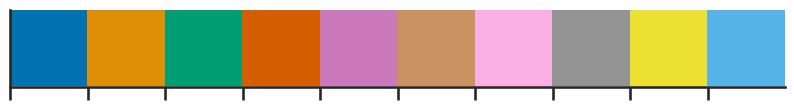

In [14]:
colors=sns.color_palette('colorblind')
sns.palplot(colors)

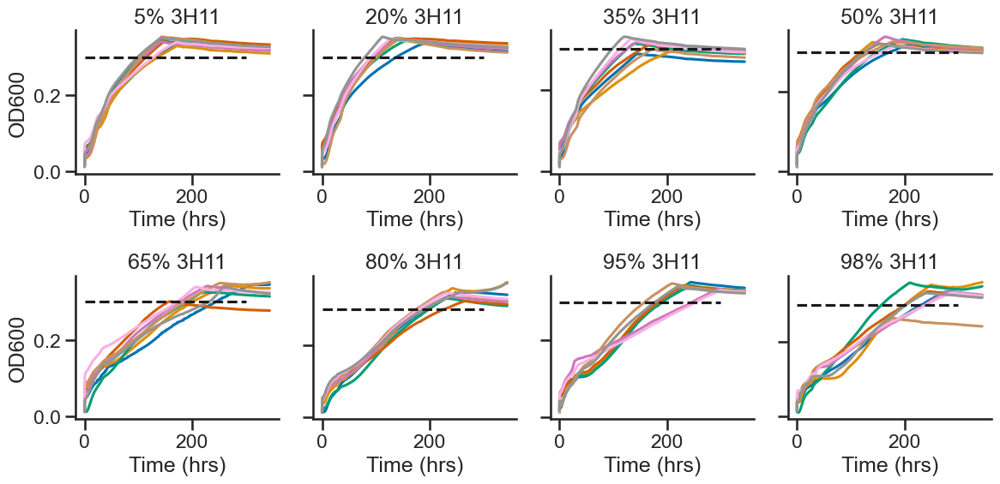

In [20]:
colors=sns.color_palette('colorblind',9)
maxOD={}
lags={}
fig= plt.figure(figsize=(12,6))
trash=[]
j=1
res=pd.DataFrame()
for media in mapped.media.unique():
    df = mapped[mapped.media==media]
    if media =='Empty':
        break
    ax=fig.add_subplot(2,4,j)
    ax.set_title(media)
    #lags[media]=[]
    i=0
  
    for rep,df2 in df.groupby(by='replicate'):
        if rep == '9' or (media,rep) in trash:
            continue
        df2=df2.loc[:,['Time (hrs)','mA','OD1','OD2']] 
        ewm=df2.ewm(span = 25).mean()
        x=ewm.iloc[[0,-1]]['mA'].values
        y=ewm[['OD1','OD2']].iloc[0].values
        fit = linregress(x,y)
        
        x2=ewm['Time (hrs)'].values
        y2=ewm['mA'].values
        y3=fit.slope*y2+fit.intercept
        
        ax.plot(x2,y3,color=colors[i])
        i+=1

     
        od=pd.DataFrame([x2,y3]).T
        od.columns=['Time (hrs)','OD600']
        od['media']=media
        od['replicate']=rep
        res=pd.concat([res,od])
    ax.plot((0,300),(0.3,0.3),'k--')
    #plt.ylim(0,0.5)
    if j != 1 and j != 5:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel('OD600')
    ax.set_xlabel('Time (hrs)')
    j+=1
    #ax.set_yscale('log')
plt.tight_layout()

(0.0, 200.0)

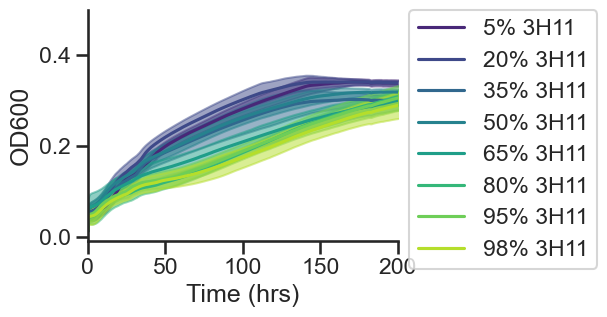

In [21]:
mean=res.iloc[:,:-1].groupby(by=['media','Time (hrs)']).mean()
std=res.iloc[:,:-1].groupby(by=['media','Time (hrs)']).std()
conditions= mapped.media.unique()
colors=sns.color_palette('viridis',len(conditions))
plt.figure(figsize=(4,3))
i=0
for idx in conditions:
    
    df=mean.loc[idx].reset_index()
    #df['OD600']=df['OD600']-df['OD600'].min()
    err=std.loc[idx].reset_index()
    plt.plot(df['Time (hrs)'].values,df['OD600'].values,label=idx,color=colors[i])
    plt.fill_between(df['Time (hrs)'].values,df['OD600'].values-err['OD600'].values,df['OD600'].values+err['OD600'].values,alpha=0.5,color=colors[i])
   
    i+=1
plt.xlabel('Time (hrs)')
plt.ylabel('OD600')
plt.legend(bbox_to_anchor=(1,1.05),loc=2)
plt.ylim(-.01,0.5)
#plt.savefig('SynCom-comp-Yield-v2.png',dpi=500,bbox_inches='tight')
#plt.savefig('SynCom-comp-Yield-v2.pdf',bbox_inches='tight')
plt.xlim(0,200)
#plt.yscale('log')
#plt.xlim(0,150)

#plt.ylim(10**-3,2*10**-1)

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


,Time (hrs),OD600,media,replicate
1082,192.497681,0.335080,20% 3H11,1
802,145.376044,0.349401,20% 3H11,2
877,157.876721,0.342601,20% 3H11,3
751,136.875514,0.349595,20% 3H11,4
776,141.042468,0.349317,20% 3H11,5
...,...,...,...,...
1406,246.548196,0.335810,98% 3H11,4
1591,279.413818,0.335165,98% 3H11,5
1010,180.044604,0.264536,98% 3H11,6
1633,288.887269,0.332286,98% 3H11,7


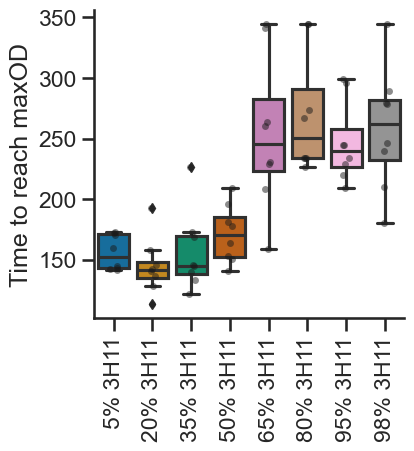

In [28]:
maxOD=pd.DataFrame()
for idx,df in res.groupby(by=['media','replicate']):
    tmp=df[df.OD600==df.OD600.max()]
    maxOD=pd.concat([maxOD,tmp])
plt.figure(figsize=(4,4))
sns.boxplot(x='media',y='Time (hrs)',data=maxOD,order=[ '5% 3H11','20% 3H11', '35% 3H11', '50% 3H11', '65% 3H11',
       '80% 3H11', '95% 3H11', '98% 3H11'])
sns.stripplot(x='media',y='Time (hrs)',data=maxOD,color='k',alpha=0.5,order=[ '5% 3H11','20% 3H11', '35% 3H11', '50% 3H11', '65% 3H11',
       '80% 3H11', '95% 3H11', '98% 3H11'])
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('Time to reach maxOD')
maxOD


In [32]:
n2o=pd.read_excel('data/ODin_Tube_Map_9M6D.xlsx',sheet_name='N2O')
n2o['condition']=[x[0] for x in n2o['Sample Name']]
n2o['condition']=n2o['condition'].map(media_dict)
n2o['Nitrous Oxide']=n2o['Nitrous Oxide'].astype(float)
n2o['percent']=[int(x.split('%')[0]) for x in n2o.condition]
n2o['rep']=[int(x[1]) for x in n2o['Sample Name']]
n2o

,Sample Name,Nitrous Oxide,condition,percent,rep
0,A1,0.000,5% 3H11,5,1
1,B1,0.000,20% 3H11,20,1
2,C1,0.000,35% 3H11,35,1
3,D1,202.862,50% 3H11,50,1
4,E1,251.801,65% 3H11,65,1
...,...,...,...,...,...
59,D8,20.777,50% 3H11,50,8
60,E8,10.275,65% 3H11,65,8
61,F8,95.553,80% 3H11,80,8
62,G8,255.538,95% 3H11,95,8


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'N$_2$O (ppm)')

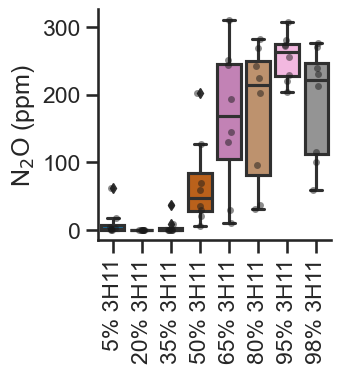

In [34]:
fig,ax = plt.subplots(1,1,figsize=(3,3))
sns.boxplot(x='condition',y='Nitrous Oxide',data=n2o,ax=ax)
plt.xticks(rotation=90)
sns.stripplot(x='condition',y='Nitrous Oxide',data=n2o,ax=ax,color='k',alpha=0.5,dodge=True)
plt.xlabel('')
plt.ylabel('N$_2$O (ppm)')

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, '1 mM Nitrate'),
  Text(1, 0, '2 mM Nitrate'),
  Text(2, 0, '4 mM Nitrate'),
  Text(3, 0, '8 mM Nitrate'),
  Text(4, 0, '10 mM Nitrate'),
  Text(5, 0, '20 mM Nitrate'),
  Text(6, 0, '40 mM Nitrate')])

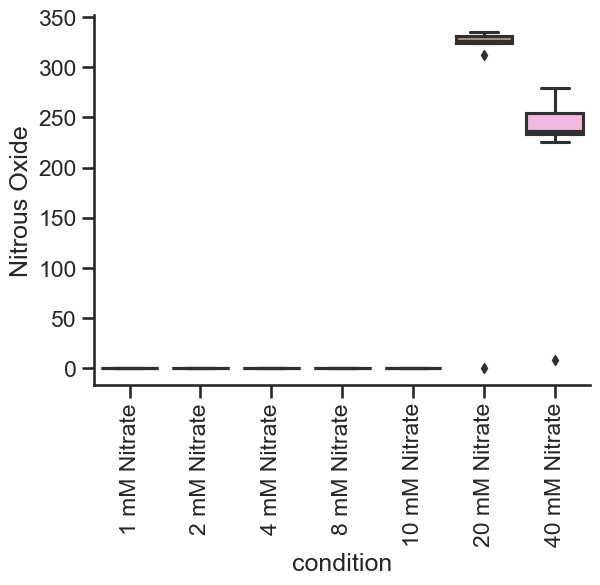

In [36]:
n2o_nitrate=pd.read_csv('data/20230906-Nitrous-Oxide.csv').iloc[:,:3].dropna()
n2o_nitrate['condition']=[x[0] for x in n2o_nitrate['Sample Name']]
media_nitrate=pd.read_excel('data/ODin_Tube_Map_nitrate.xlsx',sheet_name='Conditions'
                   )
media_nitrate.index=media_nitrate.Condition
media_dict_nitrate=media_nitrate.Media.to_dict()
n2o_nitrate['condition']=n2o_nitrate['condition'].map(media_dict_nitrate)
n2o_nitrate['Nitrous Oxide']=n2o_nitrate['Nitrous Oxide'].astype(float)
n2o_nitrate['rep']=[int(x[1]) for x in n2o_nitrate['Sample Name']]
n2o_nitrate

sns.boxplot(x='condition',y='Nitrous Oxide',data=n2o_nitrate)
plt.xticks(rotation=90)

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


(-0.5, 8.0)

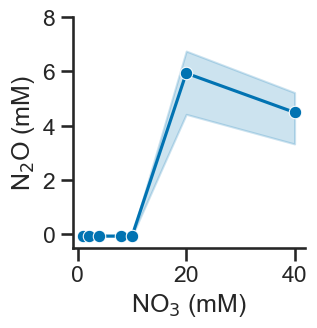

In [38]:
slope=0.02059220973240205
intercept=-0.05817653391874167

fig,ax=plt.subplots(1,1,figsize=(3,3))
n2o_nitrate['nitrate']=[int(x.split('mM')[0])for x in n2o_nitrate.condition]
n2o_nitrate['Nitrous Oxide(mM)']=n2o_nitrate['Nitrous Oxide']*slope+intercept
sns.lineplot(x='nitrate',y='Nitrous Oxide(mM)',data=n2o_nitrate,ax=ax,marker='o')
#sns.scatterplot(x='nitrate',y='Nitrous Oxide(mM)',data=n2o_nitrate,ax=ax)
plt.xlabel('NO$_3$ (mM)')
plt.ylabel('N$_2$O (mM)')
#plt.xticks([0,25,50,75,100])
#plt.yticks([0,100,200,300])
#ax2=ax.twinx()
plt.ylim(-.5,8)
#sns.lineplot(x=np.linspace(1,98,100),y=smooth_auc,color='r')
#ax2.set_ylabel('Predicted NO$_2$ AUC')
#plt.savefig('SynCom-Nitrate-N2O-v2.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


(-0.5, 8.0)

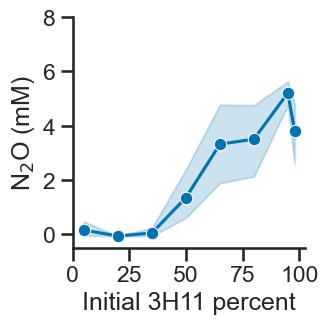

In [40]:
fig,ax=plt.subplots(1,1,figsize=(3,3))
n2o['Nitrous Oxide(mM)']=n2o['Nitrous Oxide']*slope+intercept
sns.lineplot(x='percent',y='Nitrous Oxide(mM)',data=n2o,ax=ax,marker='o')
#sns.scatterplot(x='percent',y='Nitrous Oxide(mM)',data=n2o,ax=ax)
plt.xlabel('Initial 3H11 percent')
plt.ylabel('N$_2$O (mM)')
plt.xticks([0,25,50,75,100])
plt.ylim(-.5,8)
#ax2=ax.twinx()
#sns.lineplot(x=np.linspace(1,98,100),y=smooth_auc,color='r')
#ax2.set_ylabel('Predicted NO$_2$ AUC')
#plt.savefig('3H11-ratio-N2O-v2.pdf',bbox_inches='tight')

# Examination of kinetic model predictions and N2O
* NO2 AUC predicted by SynCom kinetic model (see juypter notebook)
* NO2 max concentration also predicted

In [48]:
no2_auc=[319.5675592562417,
 349.33174722564144,
 381.3651717898688,
 422.345440407238,
 480.53904255726803,
 577.689898731131,
 840.4452533852962,
 1024.1670760254087]

max_no2=[6.852362834834635,
 7.115389665101311,
 7.357271289688896,
 7.609818871751751,
 7.888697511496318,
 8.216746736528162,
 8.673570127782083,
 8.819233487730248]

smooth_auc=[306.27197147150423,
 310.99654939280913,
 314.2638081884503,
 316.9675206639343,
 319.3776782603587,
 321.61007452705144,
 323.7282276597324,
 325.7664912990703,
 327.74907644462934,
 329.6910388311205,
 331.6055968856063,
 333.5025027219693,
 335.3854001390859,
 337.2630411724729,
 339.1363473246776,
 341.0111907970312,
 342.89071950504535,
 344.7776091492115,
 346.67287835079907,
 348.58148525439714,
 350.50355322911406,
 352.4407978382726,
 354.3957172345687,
 356.3686066224015,
 358.3618114427204,
 360.37908148665144,
 362.4186536660108,
 364.48288325044723,
 366.57341923310787,
 368.69112835670165,
 370.8383492073656,
 373.01676409207545,
 375.22518022332986,
 377.4685729864888,
 379.7464904587905,
 382.06115599811346,
 384.41232451712045,
 386.80383644854993,
 389.2366353853541,
 391.71113217545167,
 394.22924207767113,
 396.79568404652235,
 399.409110116945,
 402.0734525811047,
 404.7897949794216,
 407.56170726774184,
 410.3867589281695,
 413.27382795015995,
 416.22084401906625,
 419.2330475949204,
 422.3122224343608,
 425.460169750033,
 428.68140390375925,
 431.9801251722013,
 435.35808618892304,
 438.8189886080667,
 442.368140258087,
 446.00747973634594,
 449.74432653738427,
 453.5823088146933,
 457.5259091281449,
 461.5831683915305,
 465.75416918761164,
 470.0525620172915,
 474.48162985830965,
 479.0490276414962,
 483.7623907065001,
 488.6332269913216,
 493.6681510157193,
 498.8818725246988,
 504.28026430989195,
 509.881269390992,
 515.6973926823439,
 521.7424843716135,
 528.0359175118138,
 534.5947836869748,
 541.4473248200383,
 548.6055436039234,
 556.1061325098127,
 563.9786959146039,
 572.2563691079345,
 580.9840894706068,
 590.2029967434081,
 599.9735301248153,
 610.3521842028424,
 621.4273578059601,
 633.2719377755215,
 646.0096407260158,
 659.7681306708749,
 674.7153895151419,
 691.0620798946063,
 709.0733644539565,
 729.1093308799914,
 751.6500472619655,
 777.3707869294395,
 807.2606652927359,
 842.8530340765246,
 886.6957824554904,
 943.5881516064741,
 1024.1670760254087]

smooth_max=[6.731946086234267,
 6.774302844794493,
 6.803778690054575,
 6.828515424202079,
 6.850391752980448,
 6.871462921659751,
 6.890876062671423,
 6.90952105520505,
 6.927669905502024,
 6.945243560134146,
 6.962116948905977,
 6.979462452229224,
 6.996008562306389,
 7.012704939471833,
 7.028736718831758,
 7.045296845257025,
 7.061275244023692,
 7.077098979700433,
 7.0933149507945465,
 7.109239587346766,
 7.124936968170202,
 7.140488611253406,
 7.156372100972115,
 7.17225338670831,
 7.188051033796606,
 7.203811971322774,
 7.219537639760328,
 7.235257823128481,
 7.250987300974571,
 7.266736871848981,
 7.2825280581372,
 7.2983561601565965,
 7.314210832906043,
 7.330123590210708,
 7.346061628817617,
 7.362057743787385,
 7.378069861875454,
 7.394119766618174,
 7.410205751587319,
 7.426304740108927,
 7.442442748077382,
 7.458941212193557,
 7.475464222003918,
 7.492000441478086,
 7.5085402560211705,
 7.525106070746505,
 7.54166010426197,
 7.558691601222333,
 7.575695376575423,
 7.592686480002673,
 7.609643074814156,
 7.626978367430659,
 7.644427637372368,
 7.661828990711759,
 7.679281828007923,
 7.697184649504678,
 7.714998377992296,
 7.732813860406538,
 7.751133310219145,
 7.769340379350484,
 7.787739985267365,
 7.806417938198234,
 7.8249546161545345,
 7.8440967244045785,
 7.863061282873349,
 7.882487595388508,
 7.90185341286425,
 7.921671113372622,
 7.94141031791121,
 7.9617220929331145,
 7.981991535756641,
 8.002658472268896,
 8.023576134066358,
 8.044612703428145,
 8.066103793364883,
 8.087888315944001,
 8.109942427166049,
 8.132263632623987,
 8.154944442604021,
 8.178111369590294,
 8.201655709338137,
 8.225616953695656,
 8.250006930677868,
 8.27497151222983,
 8.30046583593554,
 8.326522125280619,
 8.353095788706502,
 8.380532274735163,
 8.408601022059615,
 8.437546034209632,
 8.467458787303764,
 8.498383847407109,
 8.530579446396072,
 8.564098539448747,
 8.59929574454244,
 8.636499080238986,
 8.676105842264084,
 8.718836220784452,
 8.765841704935182,
 8.819233487730248]

In [50]:
nitrate_n2o=[  0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
       327.481625, 247.618625]

nitrate_no2_auc=[40.7258769842238,
 69.7050390908466,
 141.354885985393,
 352.4383550646271,
 495.9857609572388,
 905.531782606068,
 2320.141536390836]

nitrate_no2_max=[0.7659590469904115,
 1.6577015933283008,
 3.469652372593332,
 6.9117627271279,
 8.107676776825086,
 8.827775934196765,
 8.927317293736026]

In [52]:
no2_auc_dict={'5% 3H11':319.5675592562417,
 '20% 3H11':349.33174722564144,
 '35% 3H11':381.3651717898688,
 '50% 3H11':422.345440407238,
 '65% 3H11':480.53904255726803,
 '80% 3H11':577.689898731131,
 '95% 3H11':840.4452533852962,
 '98% 3H11':1024.1670760254087}

nitrate_no2_auc_dict={'1mM':40.7258769842238,
 '2mM':69.7050390908466,
 '4mM':141.354885985393,
 '8mM':352.4383550646271,
 '10mM':495.9857609572388,
 '20mM':905.531782606068,
 '40mM':2320.141536390836}
 
    
no2_max_dict={'5% 3H11':6.852362834834635,
 '20% 3H11':7.115389665101311,
 '35% 3H11': 7.357271289688896,
 '50% 3H11':7.609818871751751,
 '65% 3H11':7.888697511496318,
 '80% 3H11':8.216746736528162,
 '95% 3H11':8.673570127782083,
 '98% 3H11':8.819233487730248}

nitrate_no2_max_dict={'1mM':0.7659590469904115,
 '2mM':1.6577015933283008,
 '4mM': 3.469652372593332,
 '8mM': 6.9117627271279,
 '10mM':8.107676776825086,
 '20mM':8.827775934196765,
 '40mM':8.927317293736026}

Text(0, 0.5, 'N$_2$O (mM)')

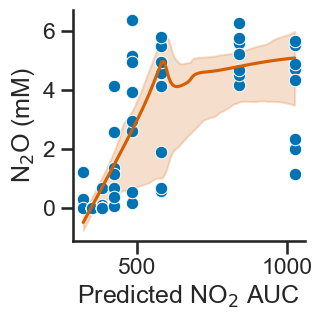

In [64]:
import statsmodels.api as sm

def lowess_with_confidence_bounds(
    x, y, eval_x, N=500, conf_interval=0.95, lowess_kw=None
):
    """
    Perform Lowess regression and determine a confidence interval by bootstrap resampling
    """
    # Lowess smoothing
    smoothed = sm.nonparametric.lowess(exog=x, endog=y, xvals=eval_x, **lowess_kw)

    # Perform bootstrap resamplings of the data
    # and  evaluate the smoothing at a fixed set of points
    smoothed_values = np.empty((N, len(eval_x)))
    for i in range(N):
        sample = np.random.choice(len(x), len(x), replace=True)
        sampled_x = x[sample]
        sampled_y = y[sample]

        smoothed_values[i] = sm.nonparametric.lowess(
            exog=sampled_x, endog=sampled_y, xvals=eval_x, **lowess_kw
        )

    # Get the confidence interval
    sorted_values = np.sort(smoothed_values, axis=0)
    bound = int(N * (1 - conf_interval) / 2)
    bottom = sorted_values[bound - 1]
    top = sorted_values[-bound]

    return smoothed, bottom, top


y_vals=np.array(list(n2o['Nitrous Oxide'].values)+list(n2o_nitrate['Nitrous Oxide'].values))
x_vals=np.array(list(n2o['condition'].map(no2_auc_dict).values)+list(n2o_nitrate['condition'].map(nitrate_no2_auc_dict).values))

df=pd.DataFrame(x_vals,y_vals).reset_index()
df.columns=['y','x']
df=df.sort_values(by='x')
x_vals=df.x
y_vals=df.y*slope+intercept
#y_vals=y_vals[x_vals<2000].values
#x_vals=x_vals[x_vals<2000].values
y_vals[y_vals<0]=0
fig,ax=plt.subplots(1,1,figsize=(3,3))
eval_x = np.linspace(min(x_vals),max(x_vals),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x_vals, y_vals, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.95)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)
from scipy.interpolate import UnivariateSpline
#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)
#plt.ylim(-0.5,8)
df=pd.DataFrame(np.array([x_vals,y_vals]).T)
df.columns=['auc','n2o']

sns.scatterplot(y='n2o',x='auc',data=df,marker='o')
#sns.lineplot(y=y_vals,x=x_vals)
plt.xlabel('Predicted NO$_2$ AUC')
plt.ylabel('N$_2$O (mM)')
#plt.xlim(0,1000)
#plt.savefig('NO2-AUC-vs-N2O-both-v2.pdf',bbox_inches='tight')

Text(0, 0.5, 'N$_2$O (mM)')

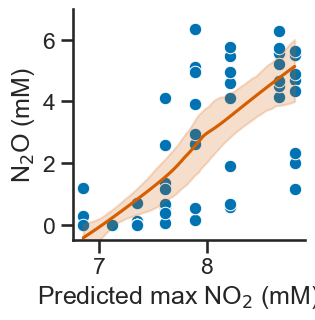

In [66]:
y_vals=np.array(list(n2o['Nitrous Oxide'].values)+list(n2o_nitrate['Nitrous Oxide'].values))
x_vals=np.array(list(n2o['condition'].map(no2_max_dict).values)+list(n2o_nitrate['condition'].map(nitrate_no2_max_dict).values))


df=pd.DataFrame(x_vals,y_vals).reset_index()
df.columns=['y','x']
df=df.sort_values(by='x')
x_vals=df.x
y_vals=df.y*slope+intercept
y_vals[y_vals<0]=0
fig,ax=plt.subplots(1,1,figsize=(3,3))
df=pd.DataFrame(np.array([x_vals,y_vals]).T)
df.columns=['auc','n2o']

sns.scatterplot(y='n2o',x='auc',data=df,marker='o')
#y_vals=y_vals[x_vals>5].values
#x_vals=x_vals[x_vals>5].values

eval_x = np.linspace(min(x_vals),max(x_vals),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x_vals, y_vals, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.95)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)
from scipy.interpolate import UnivariateSpline
#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)
plt.ylim(-0.5,7)

#sns.lineplot(y=y_vals,x=x_vals)
plt.xlabel('Predicted max NO$_2$ (mM)    ')
plt.ylabel('N$_2$O (mM)')
#plt.tight_layout()
#plt.xticks([0,2,4,6,8,10])
#plt.xlim(5,9.5)
#plt.savefig('NO2-AUC-vs-N2O-both.pdf',bbox_inches='tight')

LinregressResult(slope=2.6318487406045343, intercept=-18.383706136617196, rvalue=0.7710977012331762, pvalue=9.058224629969181e-14, stderr=0.27599550511452237, intercept_stderr=2.16524279447453)


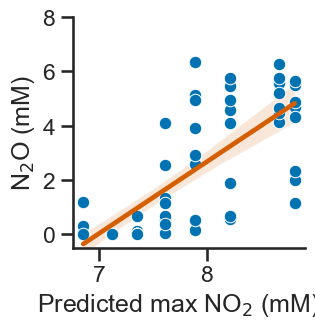

In [68]:
plt.figure(figsize=(3,3))
sns.regplot(y='n2o',x='auc',data=df[df.auc>5],scatter=False,color='r')
sns.scatterplot(y='n2o',x='auc',data=df[df.auc>5])
plt.xlabel('Predicted max NO$_2$ (mM)    ')
plt.ylabel('N$_2$O (mM)')
plt.ylim(-0.5,8)
#plt.savefig('NO2-conc-vs-N2O-both-linear-v2.pdf',bbox_inches='tight')

print(linregress(df[df.auc>5].auc,df[df.auc>5].n2o))

# SynCom composition analysis 
* Proteomics used to determined composition at T0 and T1 (end of growth)
* Composition analyzed across variable intial nitrate and SynCom compositions

In [70]:
ratio_comp=pd.read_csv('data/SynCom-only-composition-data.csv',index_col=0)
ratio_comp['3H11-init']=[x.split('_')[1].split('-')[0] for x in ratio_comp['Line']]
ratio_comp['rep']=[x.split('_')[1].split('-')[1] for x in ratio_comp['Line']]
idx=ratio_comp[ratio_comp['3H11-init']=='T0'].index
ratio_comp['time']='T1'
ratio_comp.loc[idx,'time']='T0'
ratio_comp.loc[idx,'3H11-init']=[5,5,20,20,35,35,50,50,65,65,80,80,95,95,98,98]
ratio_comp['3H11-init']=ratio_comp['3H11-init'].astype(int)
ratio_comp['nitrate']=10
ratio_comp

,Line,Strain,Counts,Percent,3H11-init,rep,time,nitrate
0,3H11_20-R1,FW510-R12,1.981102e+09,36.540083,20,R1,T1,10
1,3H11_20-R1,GW101-3H11,3.440621e+09,63.459917,20,R1,T1,10
2,3H11_20-R2,FW510-R12,2.135664e+09,38.213384,20,R2,T1,10
3,3H11_20-R2,GW101-3H11,3.453122e+09,61.786616,20,R2,T1,10
4,3H11_20-R3,FW510-R12,2.092511e+09,38.148460,20,R3,T1,10
...,...,...,...,...,...,...,...,...
139,3H11_T0-R6,GW101-3H11,4.146607e+09,76.246683,80,R6,T0,10
140,3H11_T0-R7,FW510-R12,2.118282e+08,5.237897,95,R7,T0,10
141,3H11_T0-R7,GW101-3H11,3.832317e+09,94.762103,95,R7,T0,10
142,3H11_T0-R8,FW510-R12,6.215026e+07,1.467329,98,R8,T0,10


In [72]:
nitrate_comp=pd.read_csv('data/SynCom-Nitrate-composition-data.csv',index_col=0)
nitrate_comp['3H11-init']=50
nitrate_comp['nitrate']=[x.split('_')[1].split('-')[0][:-2] if 'mM' in x else x.split('_')[1].split('-')[0] for x in nitrate_comp['Line']]
nitrate_comp['rep']=[x.split('_')[1].split('-')[1] for x in nitrate_comp['Line']]
idx=nitrate_comp[nitrate_comp['nitrate']=='T0'].index
nitrate_comp['time']='T1'
nitrate_comp.loc[idx,'time']='T0'
nitrate_comp.loc[idx,'nitrate']=[10,10,1,1,20,20, 2,2, 40,40,4,4,8,8,10,10]
nitrate_comp['nitrate']=nitrate_comp['nitrate'].astype(int)
nitrate_comp

,Line,Strain,Counts,Percent,3H11-init,nitrate,rep,time
0,Nitrate_10mM-R1,FW510-R12,1.227122e+09,34.383484,50,10,R1,T1
1,Nitrate_10mM-R1,GW101-3H11,2.341807e+09,65.616516,50,10,R1,T1
2,Nitrate_10mM-R2,FW510-R12,1.311086e+09,34.749273,50,10,R2,T1
3,Nitrate_10mM-R2,GW101-3H11,2.461902e+09,65.250727,50,10,R2,T1
4,Nitrate_10mM-R3,FW510-R12,1.293563e+09,34.011517,50,10,R3,T1
...,...,...,...,...,...,...,...,...
123,Nitrate_T0-R6,GW101-3H11,1.444246e+09,45.559755,50,4,R6,T0
124,Nitrate_T0-R7,FW510-R12,1.687793e+09,53.253358,50,8,R7,T0
125,Nitrate_T0-R7,GW101-3H11,1.481571e+09,46.746642,50,8,R7,T0
126,Nitrate_T0-R8,FW510-R12,1.693050e+09,53.506451,50,10,R8,T0


Text(0.5, 1.0, 'T0 composition')

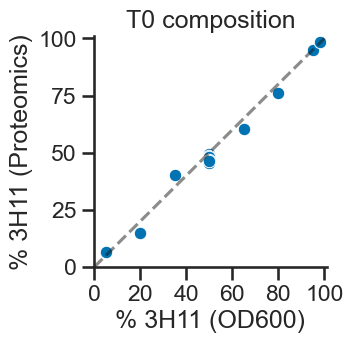

In [74]:
df=ratio_comp[(ratio_comp.time=='T0')&(ratio_comp.Strain=='GW101-3H11')]
plt.figure(figsize=(3,3))
sns.scatterplot(x='3H11-init',y='Percent',data=df,color='b')
df=nitrate_comp[(nitrate_comp.time=='T0')&(nitrate_comp.Strain=='GW101-3H11')]
sns.scatterplot(x='3H11-init',y='Percent',data=df,color='b')
plt.xlim(0,101)
plt.ylim(0,101)
xticks=plt.xticks([0,20,40,60,80,100])
plt.xlabel('% 3H11 (OD600)')
plt.ylabel('% 3H11 (Proteomics)')
plt.plot((0,100),(0,100),'k--',alpha=0.5)
plt.title('T0 composition')
#plt.savefig('Proteomics-vs-OD600.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

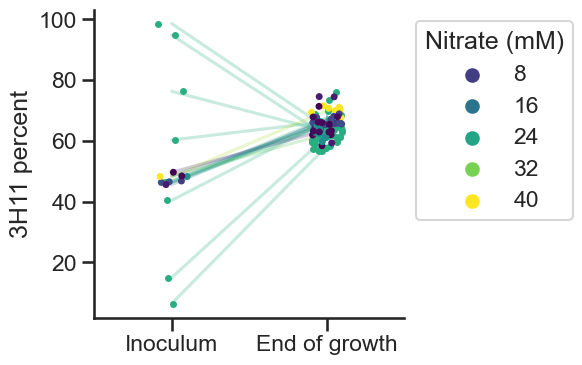

In [76]:
data=pd.concat([ratio_comp,nitrate_comp],ignore_index=True)
colors=sns.color_palette('viridis',7)
fig,ax=plt.subplots(1,1,figsize=(4,4))
for index,df in ratio_comp[ratio_comp.Strain=='GW101-3H11'].groupby(by=['3H11-init']):
    sns.lineplot(x='time',y='Percent',data=df.sort_values(by='time'),ax=ax,color=colors[4],zorder=0,alpha=0.25,legend=False)
sns.stripplot(x='time',y='Percent',data=ratio_comp[ratio_comp.Strain=='GW101-3H11'].sort_values(by='time'),ax=ax,color=colors[4])


i=0
for index,df in nitrate_comp[nitrate_comp.Strain=='GW101-3H11'].groupby(by=['nitrate']):
    sns.lineplot(x='time',y='Percent',data=df.sort_values(by='time'),color=colors[i],ax=ax,legend=False,alpha=0.25) 
    i+=1
sns.stripplot(x='time',y='Percent',data=nitrate_comp[nitrate_comp.Strain=='GW101-3H11'].sort_values(by='time'),hue='nitrate',ax=ax,palette='viridis')
plt.xlabel('')
plt.ylabel('3H11 percent')
plt.xticks(['T0','T1'],labels=['Inoculum','End of growth'])
plt.legend(bbox_to_anchor=(1,1),title='Nitrate (mM)')
#plt.savefig('3H11-composition.pdf',bbox_inches='tight')

In [112]:
annot_3h11=pd.read_csv("data/GW101-3H11.annotations.tsv",sep='\t')
annot_r12=pd.read_csv("data/FW510-R12.annotations.tsv",sep='\t')
kegg=pd.read_csv("data/KEGG_Annotation_Reference.csv")
annot_r12

,Query,Seed ortholog,e-value,score,best tax lvl,Preferred_name,GO terms,EC number,KEGG KO,KEGG pathway,...,KEGG rclass,BRITE,KEGG TC,CAZy,BiGG reaction,annot lvl,matching OGs,Best OG,COG cat,description
0,FW510-R12_contig_1_1,1163409.UUA_16493,1.700000e-246,858.2,Xanthomonadales,dnaA,"GO:0003674,GO:0003676,GO:0003677,GO:0003688,GO...",NaN,ko:K02313,"ko02020,ko04112,map02020,map04112",...,NaN,"ko00000,ko00001,ko03032,ko03036",NaN,NaN,NaN,Bacteria,"1MU5H@1224,1RNHP@1236,1X424@135614,COG0593@1,C...",NA|NA|NA,L,it binds specifically double-stranded DNA at a...
1,FW510-R12_contig_1_2,1163409.UUA_16488,4.500000e-197,693.7,Xanthomonadales,dnaN,NaN,2.7.7.7,ko:K02338,"ko00230,ko00240,ko01100,ko03030,ko03430,ko0344...",...,RC02795,"ko00000,ko00001,ko00002,ko01000,ko03032,ko03400",NaN,NaN,NaN,Bacteria,"1MVD9@1224,1RMNP@1236,1X3F0@135614,COG0592@1,C...",NA|NA|NA,L,Confers DNA tethering and processivity to DNA ...
2,FW510-R12_contig_1_3,1163409.UUA_16483,2.200000e-191,674.9,Xanthomonadales,recF,"GO:0000731,GO:0003674,GO:0003676,GO:0003677,GO...",NaN,ko:K03629,"ko03440,map03440",...,NaN,"ko00000,ko00001,ko03400",NaN,NaN,NaN,Bacteria,"1MX8N@1224,1RN5P@1236,1X3R9@135614,COG1195@1,C...",NA|NA|NA,L,it is required for DNA replication and normal ...
3,FW510-R12_contig_1_4,1163409.UUA_16478,0.000000e+00,1596.3,Xanthomonadales,gyrB,"GO:0000166,GO:0003674,GO:0003676,GO:0003677,GO...",5.99.1.3,ko:K02470,NaN,...,NaN,"ko00000,ko01000,ko03032,ko03400",NaN,NaN,NaN,Bacteria,"1MVKT@1224,1RNB2@1236,1X51M@135614,COG0187@1,C...",NA|NA|NA,L,A type II topoisomerase that negatively superc...
4,FW510-R12_contig_1_5,1163409.UUA_16473,8.700000e-224,782.7,Xanthomonadales,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Bacteria,"1MVH9@1224,1RQ3R@1236,1X3F2@135614,COG0457@1,C...",NA|NA|NA,S,COG0457 FOG TPR repeat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3488,FW510-R12_contig_2_195,666685.R2APBS1_1961,0.000000e+00,1385.9,Xanthomonadales,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Bacteria,"1N53E@1224,1TD3W@1236,1XA2M@135614,2CGFX@1,2Z8...",NA|NA|NA,NaN,NaN
3489,FW510-R12_contig_2_202,1234364.AMSF01000024_gene3801,2.200000e-21,109.4,Xanthomonadales,NaN,NaN,NaN,ko:K06889,NaN,...,NaN,ko00000,NaN,NaN,NaN,Bacteria,"1R1F2@1224,1T507@1236,1XDAJ@135614,COG1073@1,C...",NA|NA|NA,S,Alpha/beta hydrolase family
3490,FW510-R12_contig_2_203,1163409.UUA_16488,5.600000e-70,271.6,Xanthomonadales,dnaN,NaN,2.7.7.7,ko:K02338,"ko00230,ko00240,ko01100,ko03030,ko03430,ko0344...",...,RC02795,"ko00000,ko00001,ko00002,ko01000,ko03032,ko03400",NaN,NaN,NaN,Bacteria,"1MVD9@1224,1RMNP@1236,1X3F0@135614,COG0592@1,C...",NA|NA|NA,L,Confers DNA tethering and processivity to DNA ...
3491,FW510-R12_contig_2_209,1163409.UUA_15338,2.000000e-84,319.7,Xanthomonadales,rdgC,"GO:0000018,GO:0003674,GO:0003676,GO:0003677,GO...",NaN,ko:K03554,NaN,...,NaN,"ko00000,ko03400",NaN,NaN,NaN,Bacteria,"1MXPR@1224,1RMNN@1236,1X3BZ@135614,COG2974@1,C...",NA|NA|NA,L,May be involved in recombination


In [114]:
!cp "../Nitrate Yield/SynCom/20231105_ACarr_Nitrate.syncom composition analysis/20231105_ACarr_Nitrate.pr_matrix.csv" "data/Nitrate.pr_matrix.csv"

In [116]:
from scipy.stats import zscore
protein=pd.read_csv('data/Nitrate.pr_matrix.csv')
idx=protein['Protein.Ids'].dropna().index
protein=protein.loc[idx]
h11_protein=protein[protein['Protein.Ids'].str.contains('3H11')]
h11_protein.index=h11_protein['Protein.Ids']
h11_protein=h11_protein[['Nitrate_1mM-R1', 'Nitrate_1mM-R2', 'Nitrate_1mM-R3', 'Nitrate_1mM-R4',
       'Nitrate_1mM-R5', 'Nitrate_1mM-R6', 'Nitrate_1mM-R7', 'Nitrate_1mM-R8',
       'Nitrate_2mM-R1', 'Nitrate_2mM-R2', 'Nitrate_2mM-R3', 'Nitrate_2mM-R4',
       'Nitrate_2mM-R5', 'Nitrate_2mM-R6', 'Nitrate_2mM-R7', 'Nitrate_2mM-R8',
       'Nitrate_4mM-R1', 'Nitrate_4mM-R2', 'Nitrate_4mM-R3', 'Nitrate_4mM-R4',
       'Nitrate_4mM-R5', 'Nitrate_4mM-R6', 'Nitrate_4mM-R7', 'Nitrate_4mM-R8',
       'Nitrate_8mM-R1', 'Nitrate_8mM-R2', 'Nitrate_8mM-R3', 'Nitrate_8mM-R4',
       'Nitrate_8mM-R5', 'Nitrate_8mM-R6', 'Nitrate_8mM-R7', 'Nitrate_8mM-R8',
       'Nitrate_10mM-R1', 'Nitrate_10mM-R2', 'Nitrate_10mM-R3',
       'Nitrate_10mM-R4', 'Nitrate_10mM-R5', 'Nitrate_10mM-R6',
       'Nitrate_10mM-R7', 'Nitrate_10mM-R8', 'Nitrate_20mM-R1',
       'Nitrate_20mM-R2', 'Nitrate_20mM-R3', 'Nitrate_20mM-R4',
       'Nitrate_20mM-R5', 'Nitrate_20mM-R6', 'Nitrate_20mM-R7',
       'Nitrate_20mM-R8', 'Nitrate_40mM-R1', 'Nitrate_40mM-R2',
       'Nitrate_40mM-R3', 'Nitrate_40mM-R4', 'Nitrate_40mM-R5',
       'Nitrate_40mM-R6', 'Nitrate_40mM-R7', 'Nitrate_40mM-R8']].fillna(0)
h11_protein=h11_protein.groupby(level=0).sum()
z=((h11_protein>0).sum(axis=1)/h11_protein.columns.shape[0]).values

h11_protein=h11_protein[z>=0.8]
#h11_protein=h11_protein.divide(h11_protein.sum(axis=0))
h11_protein.columns=pd.MultiIndex.from_tuples([(x.split('_')[1].split('-')[0],x.split('_')[1].split('-')[1]) for x in h11_protein.columns])
#h11_protein=h11_protein.groupby(level=0,axis=1).mean()
h11_zvals=h11_protein.apply(zscore,axis=1)
h11_zvals=h11_zvals[~h11_zvals.index.str.contains(';')]
h11_zvals

1mM                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1     2.140883  0.955704  0.932857 -0.277394   
JGI|GW101-3H11|contig_1_1002  0.313495  0.708311  1.188644  0.483109   
JGI|GW101-3H11|contig_1_1003  1.010161  1.827646  0.919571  0.870595   
JGI|GW101-3H11|contig_1_1023 -0.591615 -0.790766 -1.558801 -1.558801   
JGI|GW101-3H11|contig_1_1024 -0.035993  0.767636 -1.166864 -1.829057   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990   0.035859 -0.213944 -0.026592 -0.338845   
JGI|GW101-3H11|contig_1_992   0.490855  0.224864 -0.175370 -1.120772   
JGI|GW101-3H11|contig_1_993   1.025529 -0.007529 -0.710219 -1.589126   
JGI|GW101-3H11|contig_1_998  -0.990123 -0.511829 -0.622587 -2.224046   
JGI|GW101-3H11|contig_1_999   0.059145  0.191812  0.123545 -0.387103   

                                                                      \
                                    R5        R6        R7        R8   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -0.724174  1.425738  1.144598  0.559438   
JGI|GW101-3H11|contig_1_1002  0.645376 -0.003953  0.405602  1.371973   
JGI|GW101-3H11|contig_1_1003  2.669834  1.726385  2.127683  2.115853   
JGI|GW101-3H11|contig_1_1023 -0.975030 -0.742500 -1.558801 -1.067797   
JGI|GW101-3H11|contig_1_1024 -1.886608  0.280451 -3.160829 -0.743548   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990  -0.338845 -0.993715 -0.815131 -2.063201   
JGI|GW101-3H11|contig_1_992   1.604592  1.123448  1.696207  1.354830   
JGI|GW101-3H11|contig_1_993   0.065189  0.199749  0.537062 -0.370640   
JGI|GW101-3H11|contig_1_998   1.169389  1.229104  1.265203  0.343045   
JGI|GW101-3H11|contig_1_999   2.369945  1.807631  1.591085  1.832043   

                                   2mM            ...      20mM            \
                                    R1        R2  ...        R7        R8   
Protein.Ids                                       ...                       
JGI|GW101-3H11|contig_1_1    -0.045538 -0.476968  ... -0.024916 -0.540423   
JGI|GW101-3H11|contig_1_1002  0.542521  0.187757  ...  0.526798 -0.353003   
JGI|GW101-3H11|contig_1_1003  1.105710  2.003795  ... -0.224515 -0.825225   
JGI|GW101-3H11|contig_1_1023 -0.967959 -1.558801  ...  1.345880  1.599818   
JGI|GW101-3H11|contig_1_1024 -0.499064  0.805119  ... -0.826699  0.936470   
...                                ...       ...  ...       ...       ...   
JGI|GW101-3H11|contig_1_990   0.160760 -0.026592  ...  0.410563  0.660365   
JGI|GW101-3H11|contig_1_992   0.586477  0.044013  ...  0.047047 -0.630954   
JGI|GW101-3H11|contig_1_993   0.551076  0.178766  ...  0.912456  1.309863   
JGI|GW101-3H11|contig_1_998   0.232002 -0.625091  ...  1.215154  1.064689   
JGI|GW101-3H11|contig_1_999   0.410199  0.329869  ... -0.131370 -0.477698   

                                  40mM                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -0.570264 -0.768168 -0.706966  0.098376   
JGI|GW101-3H11|contig_1_1002  0.963922  1.236852  1.428723  1.184030   
JGI|GW101-3H11|contig_1_1003 -0.524593 -0.172389 -0.141671 -0.341854   
JGI|GW101-3H11|contig_1_1023  1.388026  0.669810  2.101014  0.708789   
JGI|GW101-3H11|contig_1_1024 -0.838607  1.231333  0.069007  1.743691   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990  -1.532221 -0.338845 -0.463746 -0.276394   
JGI|GW101-3H11|contig_1_992  -1.001007 -0.862363 -0.231469 -0.306367   
JGI|GW101-3H11|contig_1_993  -1.330093 -0.119433  1.609498 -0.011688   
JGI|GW101-3H11|contig_1_998  -0.857954  1.020288  0.612860  1.042418   
JG

In [122]:
r12_protein=protein[protein['Protein.Ids'].str.contains('R12')]
r12_protein.index=r12_protein['Protein.Ids']
r12_protein=r12_protein[['Nitrate_1mM-R1', 'Nitrate_1mM-R2', 'Nitrate_1mM-R3', 'Nitrate_1mM-R4',
       'Nitrate_1mM-R5', 'Nitrate_1mM-R6', 'Nitrate_1mM-R7', 'Nitrate_1mM-R8',
       'Nitrate_2mM-R1', 'Nitrate_2mM-R2', 'Nitrate_2mM-R3', 'Nitrate_2mM-R4',
       'Nitrate_2mM-R5', 'Nitrate_2mM-R6', 'Nitrate_2mM-R7', 'Nitrate_2mM-R8',
       'Nitrate_4mM-R1', 'Nitrate_4mM-R2', 'Nitrate_4mM-R3', 'Nitrate_4mM-R4',
       'Nitrate_4mM-R5', 'Nitrate_4mM-R6', 'Nitrate_4mM-R7', 'Nitrate_4mM-R8',
       'Nitrate_8mM-R1', 'Nitrate_8mM-R2', 'Nitrate_8mM-R3', 'Nitrate_8mM-R4',
       'Nitrate_8mM-R5', 'Nitrate_8mM-R6', 'Nitrate_8mM-R7', 'Nitrate_8mM-R8',
       'Nitrate_10mM-R1', 'Nitrate_10mM-R2', 'Nitrate_10mM-R3',
       'Nitrate_10mM-R4', 'Nitrate_10mM-R5', 'Nitrate_10mM-R6',
       'Nitrate_10mM-R7', 'Nitrate_10mM-R8', 'Nitrate_20mM-R1',
       'Nitrate_20mM-R2', 'Nitrate_20mM-R3', 'Nitrate_20mM-R4',
       'Nitrate_20mM-R5', 'Nitrate_20mM-R6', 'Nitrate_20mM-R7',
       'Nitrate_20mM-R8', 'Nitrate_40mM-R1', 'Nitrate_40mM-R2',
       'Nitrate_40mM-R3', 'Nitrate_40mM-R4', 'Nitrate_40mM-R5',
       'Nitrate_40mM-R6', 'Nitrate_40mM-R7', 'Nitrate_40mM-R8']].fillna(0)
r12_protein=r12_protein.groupby(level=0).sum()
z=((r12_protein>0).sum(axis=1)/r12_protein.columns.shape[0]).values

r12_protein=r12_protein[z>=0.8]
#r12_protein=r12_protein.divide(r12_protein.sum(axis=0))
r12_protein.columns=pd.MultiIndex.from_tuples([(x.split('_')[1].split('-')[0],x.split('_')[1].split('-')[1]) for x in r12_protein.columns])
#r12_protein=r12_protein.groupby(level=0,axis=1).mean()
r12_zvals=r12_protein.apply(zscore,axis=1)

r12_zvals=r12_zvals[~r12_zvals.index.str.contains(';')]
r12_zvals

1mM                                          \
                                   R1        R2        R3        R4        R5   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     3.916010  2.805525 -0.443290  0.773218 -0.754761   
JGI|FW510-R12|contig_1_10   -0.311946 -0.696871 -1.265451 -1.047580 -1.300011   
JGI|FW510-R12|contig_1_1000  1.461283  0.362054  0.689839  0.316923 -0.832188   
JGI|FW510-R12|contig_1_1003  0.681419  0.275102  0.354762  0.975805  0.132663   
JGI|FW510-R12|contig_1_1007  2.583031  1.048734  1.728128  2.071674  1.652979   
...                               ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_1_996  -0.854070 -0.291192 -1.227991 -1.662523 -1.662523   
JGI|FW510-R12|contig_2_10    1.759461  0.772448 -0.505328  0.704555 -0.386949   
JGI|FW510-R12|contig_2_119  -0.441521 -0.891195 -0.147357 -0.622188 -2.506500   
JGI|FW510-R12|contig_2_123   0.618124  0.428759 -0.586000 -0.952143 -0.018900   
JGI|FW510-R12|contig_2_161   1.444058  1.291818  0.591369 -0.178831  0.004091   

                                                                2mM            \
                                   R6        R7        R8        R1        R2   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     2.842979  0.139705 -0.574364  1.752920 -0.392842   
JGI|FW510-R12|contig_1_10   -0.608916 -0.715310 -1.300011 -0.942703 -0.368591   
JGI|FW510-R12|contig_1_1000  0.299346 -0.746210 -1.172667  1.184741  0.091083   
JGI|FW510-R12|contig_1_1003  0.085078  0.178176 -0.234986  1.513393  2.168782   
JGI|FW510-R12|contig_1_1007  1.245929  1.237967  0.448057  1.174186  1.472951   
...                               ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_1_996  -0.517206 -1.662523 -1.024128 -0.137308 -0.141831   
JGI|FW510-R12|contig_2_10    0.936855  0.335117 -1.157420 -0.118118  1.852407   
JGI|FW510-R12|contig_2_119  -0.435337 -1.098777 -1.484291  0.667615  0.193469   
JGI|FW510-R12|contig_2_123   0.509359  0.051736 -1.855034  0.978219  0.975665   
JGI|FW510-R12|contig_2_161   0.679145  0.066170 -1.567613  1.059914  0.956841   

                             ...      20mM                40mM            \
                             ...        R7        R8        R1        R2   
Protein.Ids                  ...                                           
JGI|FW510-R12|contig_1_1     ... -0.872779 -0.528767 -0.715231 -1.101206   
JGI|FW510-R12|contig_1_10    ...  1.433491  2.377800 -0.631954  0.471911   
JGI|FW510-R12|contig_1_1000  ...  1.342618  0.594146 -1.536099 -0.195318   
JGI|FW510-R12|contig_1_1003  ... -0.901702 -0.788847 -1.353134 -1.114098   
JGI|FW510-R12|contig_1_1007  ... -0.473071 -0.500377 -1.595754 -1.048273   
...                          ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_1_996   ...  1.243579  1.613676 -0.937557  0.476225   
JGI|FW510-R12|contig_2_10    ... -0.338270  1.440303 -1.082461 -0.463050   
JGI|FW510-R12|contig_2_119   ...  0.295490  0.134329  1.210928  0.018182   
JGI|FW510-R12|contig_2_123   ...  1.949604 -1.855034  0.047028  0.306066   
JGI|FW510-R12|contig_2_161   ... -0.121500 -0.099944 -1.440262 -0.283167   

                                                                               \
                                   R3        R4        R5        R6        R7   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1    -0.611080 -0.988977 -0.181708 -0.074997 -1.101206   
JGI|FW510-R12|contig_1_10    0.979168  0.175699 -0.166005  1.659424  0.970581   
JGI|FW510-R12|contig_1_1000 -1.268413  0.126500  0.091372 -1.233523 -0.937771   
JGI|FW510-R12|contig_1_1003 -1.259309 -1.006807 -1.381181 -1.300438 -1.383564   
JGI|FW510-R12|contig_1_1007 -1.325793 -0.903221 -1.549923 -1.279191 -1.679012   
...                               ...       ...    

In [124]:
syncom_zvals=pd.concat([r12_zvals,h11_zvals])
syncom_zvals

1mM                                          \
                                   R1        R2        R3        R4        R5   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     3.916010  2.805525 -0.443290  0.773218 -0.754761   
JGI|FW510-R12|contig_1_10   -0.311946 -0.696871 -1.265451 -1.047580 -1.300011   
JGI|FW510-R12|contig_1_1000  1.461283  0.362054  0.689839  0.316923 -0.832188   
JGI|FW510-R12|contig_1_1003  0.681419  0.275102  0.354762  0.975805  0.132663   
JGI|FW510-R12|contig_1_1007  2.583031  1.048734  1.728128  2.071674  1.652979   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990  0.035859 -0.213944 -0.026592 -0.338845 -0.338845   
JGI|GW101-3H11|contig_1_992  0.490855  0.224864 -0.175370 -1.120772  1.604592   
JGI|GW101-3H11|contig_1_993  1.025529 -0.007529 -0.710219 -1.589126  0.065189   
JGI|GW101-3H11|contig_1_998 -0.990123 -0.511829 -0.622587 -2.224046  1.169389   
JGI|GW101-3H11|contig_1_999  0.059145  0.191812  0.123545 -0.387103  2.369945   

                                                                2mM            \
                                   R6        R7        R8        R1        R2   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     2.842979  0.139705 -0.574364  1.752920 -0.392842   
JGI|FW510-R12|contig_1_10   -0.608916 -0.715310 -1.300011 -0.942703 -0.368591   
JGI|FW510-R12|contig_1_1000  0.299346 -0.746210 -1.172667  1.184741  0.091083   
JGI|FW510-R12|contig_1_1003  0.085078  0.178176 -0.234986  1.513393  2.168782   
JGI|FW510-R12|contig_1_1007  1.245929  1.237967  0.448057  1.174186  1.472951   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990 -0.993715 -0.815131 -2.063201  0.160760 -0.026592   
JGI|GW101-3H11|contig_1_992  1.123448  1.696207  1.354830  0.586477  0.044013   
JGI|GW101-3H11|contig_1_993  0.199749  0.537062 -0.370640  0.551076  0.178766   
JGI|GW101-3H11|contig_1_998  1.229104  1.265203  0.343045  0.232002 -0.625091   
JGI|GW101-3H11|contig_1_999  1.807631  1.591085  1.832043  0.410199  0.329869   

                             ...      20mM                40mM            \
                             ...        R7        R8        R1        R2   
Protein.Ids                  ...                                           
JGI|FW510-R12|contig_1_1     ... -0.872779 -0.528767 -0.715231 -1.101206   
JGI|FW510-R12|contig_1_10    ...  1.433491  2.377800 -0.631954  0.471911   
JGI|FW510-R12|contig_1_1000  ...  1.342618  0.594146 -1.536099 -0.195318   
JGI|FW510-R12|contig_1_1003  ... -0.901702 -0.788847 -1.353134 -1.114098   
JGI|FW510-R12|contig_1_1007  ... -0.473071 -0.500377 -1.595754 -1.048273   
...                          ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_990  ...  0.410563  0.660365 -1.532221 -0.338845   
JGI|GW101-3H11|contig_1_992  ...  0.047047 -0.630954 -1.001007 -0.862363   
JGI|GW101-3H11|contig_1_993  ...  0.912456  1.309863 -1.330093 -0.119433   
JGI|GW101-3H11|contig_1_998  ...  1.215154  1.064689 -0.857954  1.020288   
JGI|GW101-3H11|contig_1_999  ... -0.131370 -0.477698 -1.363310 -0.054176   

                                                                               \
                                   R3        R4        R5        R6        R7   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1    -0.611080 -0.988977 -0.181708 -0.074997 -1.101206   
JGI|FW510-R12|contig_1_10    0.979168  0.175699 -0.166005  1.659424  0.970581   
JGI|FW510-R12|contig_1_1000 -1.268413  0.126500  0.091372 -1.233523 -0.937771   
JGI|FW510-R12|contig_1_1003 -1.259309 -1.006807 -1.381181 -1.300438 -1.383564   
JGI|FW510-R12|contig_1_1007 -1.325793 -0.903221 -1.549923 -1.279191 -1.679012   
...                               ...       ...    

In [157]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
def confidence_ellipse(x, y, ax, n_std=2.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensional dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the standard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the standard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

Text(0.5, 1.0, '3H11')

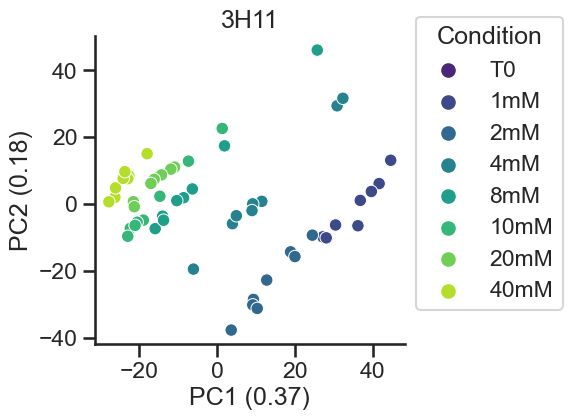

In [126]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
res = pca.fit_transform(h11_zvals.T)
colors=sns.color_palette('viridis')

pca_df = pd.DataFrame(data = res, columns = ['PC1', 'PC2','PC3'])
pca_df['sample']=[x[0] for x in h11_zvals.columns.values]

#pca_df=pca_df.drop([12,13,14,18,19,20],axis=0)
#time_dict={42:'T1',53:'T2',71:'T3',95:'T4'}
#new_times=pca_df[pca_df.cond=='3H11'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='3H11'].index
#pca_df.loc[idx,'time']=new_times

#new_times=pca_df[pca_df.cond=='SynCom'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='SynCom'].index
#pca_df.loc[idx,'time']=new_times

fig,ax =plt.subplots(1,1,figsize=(4,4))
g=sns.scatterplot(x='PC1',y='PC2',data=pca_df,hue='sample',ax=ax,palette='viridis',hue_order=['T0','1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
handles, labels = g.get_legend_handles_labels()
g.legend(bbox_to_anchor=(1,1.1),title='Condition')
plt.xlabel('PC1 (%s)'%(pca.explained_variance_ratio_[0].round(2)))
plt.ylabel('PC2 (%s)'%(pca.explained_variance_ratio_[1].round(2)))
plt.title('3H11')
#plt.savefig('3H11-Nitrate-Proteomics-PCA-v1.pdf',bbox_inches='tight')

Text(0.5, 1.0, '3H11')

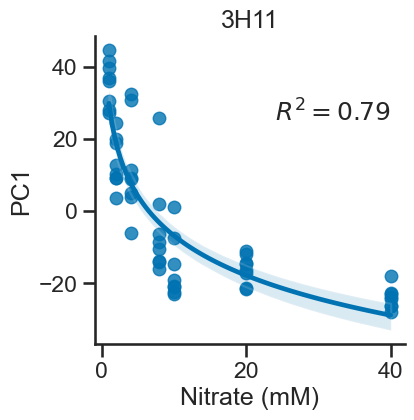

In [130]:
pca_df['nitrate']=[int(x[:-2]) for x in pca_df['sample']]
x=pca_df['nitrate'].values
y=pca_df['PC1'].values
plt.figure(figsize=(4,4))
sns.regplot(x=x,y=y,logx=True)
plt.ylabel('PC1')
plt.xlabel('Nitrate (mM)')
linres=linregress(np.log(x),y)
plt.text(24,25,'$R^2=%s$'%(linres.rvalue**2).round(2))
plt.title('3H11')

Text(0.5, 1.0, 'R12')

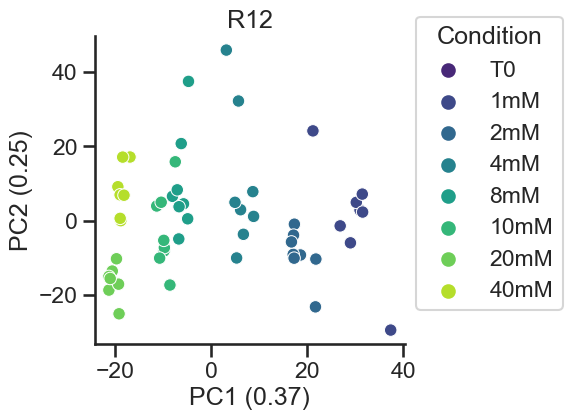

In [201]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
res = pca.fit_transform(r12_zvals.T)
colors=sns.color_palette('viridis')

pca_df = pd.DataFrame(data = res, columns = ['PC1', 'PC2','PC3'])
pca_df['sample']=[x[0] for x in r12_zvals.columns.values]

#pca_df=pca_df.drop([12,13,14,18,19,20],axis=0)
#time_dict={42:'T1',53:'T2',71:'T3',95:'T4'}
#new_times=pca_df[pca_df.cond=='3H11'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='3H11'].index
#pca_df.loc[idx,'time']=new_times

#new_times=pca_df[pca_df.cond=='SynCom'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='SynCom'].index
#pca_df.loc[idx,'time']=new_times

fig,ax =plt.subplots(1,1,figsize=(4,4))
g=sns.scatterplot(x='PC1',y='PC2',data=pca_df,hue='sample',ax=ax,palette='viridis',hue_order=['T0','1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
handles, labels = g.get_legend_handles_labels()
g.legend(bbox_to_anchor=(1,1.1),title='Condition')
plt.xlabel('PC1 (%s)'%(pca.explained_variance_ratio_[0].round(2)))
plt.ylabel('PC2 (%s)'%(pca.explained_variance_ratio_[1].round(2)))
plt.title('R12')
#plt.savefig('R12-Nitrate-Proteomics-PCA-v1.pdf',bbox_inches='tight')

Text(0.5, 1.0, 'SynCom')

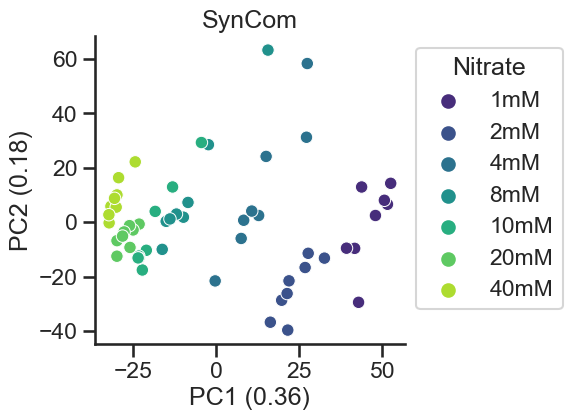

In [132]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
zvals=syncom_zvals
res = pca.fit_transform(zvals.T)
colors=sns.color_palette('viridis')

pca_df = pd.DataFrame(data = res, columns = ['PC1', 'PC2','PC3'])
pca_df['sample']=[x[0] for x in zvals.columns.values]

#pca_df=pca_df.drop([12,13,14,18,19,20],axis=0)
#time_dict={42:'T1',53:'T2',71:'T3',95:'T4'}
#new_times=pca_df[pca_df.cond=='3H11'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='3H11'].index
#pca_df.loc[idx,'time']=new_times

#new_times=pca_df[pca_df.cond=='SynCom'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='SynCom'].index
#pca_df.loc[idx,'time']=new_times

fig,ax =plt.subplots(1,1,figsize=(4,4))
g=sns.scatterplot(x='PC1',y='PC2',data=pca_df,hue='sample',ax=ax,palette='viridis',hue_order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
handles, labels = g.get_legend_handles_labels()
g.legend(bbox_to_anchor=(1,1),title='Nitrate')
plt.xlabel('PC1 (%s)'%(pca.explained_variance_ratio_[0].round(2)))
plt.ylabel('PC2 (%s)'%(pca.explained_variance_ratio_[1].round(2)))
plt.title('SynCom')
#plt.savefig('SynCom-Nitrate-Proteomics-PCA-v2.pdf',bbox_inches='tight')

In [136]:
n2o_nitrate.condition=[x.split()[0] +'mM' for x in n2o_nitrate.condition]
n2o_nitrate.rep=['R%s'%x for x in n2o_nitrate.rep]
idx=[(n2o_nitrate.loc[i,'condition'],n2o_nitrate.loc[i,'rep']) for i in n2o_nitrate.index]
n2o_nitrate.index=pd.MultiIndex.from_tuples(idx)
n2o_nitrate

,,Title,Sample Name,Nitrous Oxide,condition,rep,nitrate,Nitrous Oxide(mM)
1mM,R1,Alex_Tests_A1_952023_001.gcd,A1,0.000,1mM,R1,1,-0.058177
2mM,R1,Alex_Tests_B1_952023_002.gcd,B1,0.000,2mM,R1,2,-0.058177
4mM,R1,Alex_Tests_C1_952023_003.gcd,C1,0.000,4mM,R1,4,-0.058177
8mM,R1,Alex_Tests_D1_952023_004.gcd,D1,0.000,8mM,R1,8,-0.058177
10mM,R1,Alex_Tests_E1_952023_005.gcd,E1,0.000,10mM,R1,10,-0.058177
...,...,...,...,...,...,...,...,...
4mM,R9,Alex_Tests_C9_952023_059.gcd,C9,0.000,4mM,R9,4,-0.058177
8mM,R9,Alex_Tests_D9_952023_060.gcd,D9,0.000,8mM,R9,8,-0.058177
10mM,R9,Alex_Tests_E9_952023_061.gcd,E9,0.000,10mM,R9,10,-0.058177
20mM,R9,Alex_Tests_F9_952023_062.gcd,F9,0.000,20mM,R9,20,-0.058177


Text(0.5, 1.0, 'SynCom')

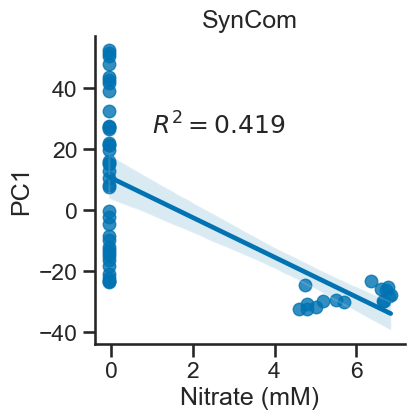

In [138]:
pca_df['nitrate']=[int(x[:-2]) for x in pca_df['sample']]
pca_df['n2o']=n2o_nitrate.loc[zvals.columns]['Nitrous Oxide(mM)'].values
x=pca_df['n2o'].values
y=pca_df['PC1'].values
plt.figure(figsize=(4,4))
sns.regplot(x=x,y=y)
plt.ylabel('PC1')
plt.xlabel('Nitrate (mM)')
linres=linregress(x,y)
plt.text(1,25,'$R^2=%s$'%(linres.rvalue**2).round(3))
plt.title('SynCom')

In [146]:
from tqdm import trange, tqdm
from statsmodels.stats.multitest import multipletests
corrs=[]
pvals=[]
genes=[]
for i in tqdm(syncom_zvals.index):
    df=syncom_zvals.loc[i,['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']].reset_index()
    df.columns=['condition','rep','zval']
    df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
    df=df[df.nitrate!=0]
    df['log nitrate']=np.log10(df.nitrate)
    linres=linregress(df['log nitrate'],df['zval'])
    corrs.append(linres.rvalue)
    pvals.append(linres.pvalue)
    genes.append(i)
rej, pval_corr = multipletests(pvals, method='fdr_bh',alpha=0.05)[:2]
hits=np.array(genes)
hits=hits[rej]
pval_hits=pval_corr[rej]
syncom_hits=syncom_zvals.loc[hits]
rvals=np.array(corrs)[rej]
syncom_hits=syncom_hits[abs(rvals)>=0.5]
syncom_hits

100%|███████████████████████████████████████| 2052/2052 [00:01<00:00, 1630.29it/s]


1mM                                          \
                                   R1        R2        R3        R4        R5   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     3.916010  2.805525 -0.443290  0.773218 -0.754761   
JGI|FW510-R12|contig_1_10   -0.311946 -0.696871 -1.265451 -1.047580 -1.300011   
JGI|FW510-R12|contig_1_1003  0.681419  0.275102  0.354762  0.975805  0.132663   
JGI|FW510-R12|contig_1_1007  2.583031  1.048734  1.728128  2.071674  1.652979   
JGI|FW510-R12|contig_1_1008  1.686209  0.262393  0.069865  0.646083  0.634117   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_963  0.541319  0.953377  0.897832 -0.157951  0.375536   
JGI|GW101-3H11|contig_1_968  1.144356  1.205879  0.507260 -0.346678  0.499123   
JGI|GW101-3H11|contig_1_969  0.232829  1.816140  0.630545  0.330389  0.494102   
JGI|GW101-3H11|contig_1_975 -1.487365 -1.438868 -2.133024 -1.898602 -1.894388   
JGI|GW101-3H11|contig_1_98   1.267174  1.571311  1.529723  1.192088  1.033417   

                                                                2mM            \
                                   R6        R7        R8        R1        R2   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1     2.842979  0.139705 -0.574364  1.752920 -0.392842   
JGI|FW510-R12|contig_1_10   -0.608916 -0.715310 -1.300011 -0.942703 -0.368591   
JGI|FW510-R12|contig_1_1003  0.085078  0.178176 -0.234986  1.513393  2.168782   
JGI|FW510-R12|contig_1_1007  1.245929  1.237967  0.448057  1.174186  1.472951   
JGI|FW510-R12|contig_1_1008 -0.087612  0.865313 -0.089285  1.257639  1.473272   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_963  0.942960  0.006952  0.677164  1.188664  1.610336   
JGI|GW101-3H11|contig_1_968  1.064822  0.090248  0.998347  0.316864  0.677068   
JGI|GW101-3H11|contig_1_969  0.492454  1.509015  1.330691  0.865563  1.909903   
JGI|GW101-3H11|contig_1_975 -1.628909 -2.297770 -1.268034 -0.479439 -0.523591   
JGI|GW101-3H11|contig_1_98   1.656961  0.807270  1.347463  1.170859  0.706787   

                             ...      20mM                40mM            \
                             ...        R7        R8        R1        R2   
Protein.Ids                  ...                                           
JGI|FW510-R12|contig_1_1     ... -0.872779 -0.528767 -0.715231 -1.101206   
JGI|FW510-R12|contig_1_10    ...  1.433491  2.377800 -0.631954  0.471911   
JGI|FW510-R12|contig_1_1003  ... -0.901702 -0.788847 -1.353134 -1.114098   
JGI|FW510-R12|contig_1_1007  ... -0.473071 -0.500377 -1.595754 -1.048273   
JGI|FW510-R12|contig_1_1008  ... -0.150126 -0.608861 -0.554487 -0.254789   
...                          ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_963  ... -1.174164 -1.182672 -1.774522 -0.979019   
JGI|GW101-3H11|contig_1_968  ... -0.222837 -1.111120 -2.033003 -0.567262   
JGI|GW101-3H11|contig_1_969  ... -1.055883 -0.374255 -1.453987 -0.824583   
JGI|GW101-3H11|contig_1_975  ...  0.340870 -0.362950  0.552672  0.973622   
JGI|GW101-3H11|contig_1_98   ... -0.557030 -1.024921 -1.134187 -1.226493   

                                                                               \
                                   R3        R4        R5        R6        R7   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_1    -0.611080 -0.988977 -0.181708 -0.074997 -1.101206   
JGI|FW510-R12|contig_1_10    0.979168  0.175699 -0.166005  1.659424  0.970581   
JGI|FW510-R12|contig_1_1003 -1.259309 -1.006807 -1.381181 -1.300438 -1.383564   
JGI|FW510-R12|contig_1_1007 -1.325793 -0.903221 -1.549923 -1.279191 -1.679012   
JGI|FW510-R12|contig_1_1008 -1.515152 -1.491347 -1.264315 -0.590856 -1.847408   
...                               ...       ...    

In [148]:
from tqdm import trange, tqdm
from statsmodels.stats.multitest import multipletests
n2o_corrs=[]
n2o_pvals=[]
n2o_genes=[]
for i in tqdm(syncom_zvals.index):
    df=syncom_zvals.loc[i,['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']].reset_index()
    df.columns=['condition','rep','zval']
    df['n2o']=n2o_nitrate.loc[syncom_zvals.columns]['Nitrous Oxide'].values
    linres=linregress(df['n2o'],df['zval'])
    n2o_corrs.append(linres.rvalue)
    n2o_pvals.append(linres.pvalue)
    n2o_genes.append(i)
rej, pval_corr = multipletests(n2o_pvals, method='fdr_bh',alpha=0.05)[:2]
n2o_hits=np.array(n2o_genes)
n2o_hits=n2o_hits[rej]
n2o_pval_hits=pval_corr[rej]
n2o_syncom_hits=syncom_zvals.loc[n2o_hits]
n2o_rvals=np.array(n2o_corrs)[rej]
n2o_syncom_hits=n2o_syncom_hits[abs(n2o_rvals)>=0.5]
n2o_syncom_hits

100%|███████████████████████████████████████| 2052/2052 [00:01<00:00, 1825.13it/s]


1mM                                          \
                                   R1        R2        R3        R4        R5   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10   -0.311946 -0.696871 -1.265451 -1.047580 -1.300011   
JGI|FW510-R12|contig_1_1003  0.681419  0.275102  0.354762  0.975805  0.132663   
JGI|FW510-R12|contig_1_1007  2.583031  1.048734  1.728128  2.071674  1.652979   
JGI|FW510-R12|contig_1_1008  1.686209  0.262393  0.069865  0.646083  0.634117   
JGI|FW510-R12|contig_1_1013  0.590493 -0.169629 -0.293669 -0.616983 -0.550089   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_945  0.783702  0.024077  0.114910 -1.266196 -0.687545   
JGI|GW101-3H11|contig_1_959 -0.548626 -1.388857 -1.727514 -1.312429 -4.243086   
JGI|GW101-3H11|contig_1_963  0.541319  0.953377  0.897832 -0.157951  0.375536   
JGI|GW101-3H11|contig_1_968  1.144356  1.205879  0.507260 -0.346678  0.499123   
JGI|GW101-3H11|contig_1_98   1.267174  1.571311  1.529723  1.192088  1.033417   

                                                                2mM            \
                                   R6        R7        R8        R1        R2   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10   -0.608916 -0.715310 -1.300011 -0.942703 -0.368591   
JGI|FW510-R12|contig_1_1003  0.085078  0.178176 -0.234986  1.513393  2.168782   
JGI|FW510-R12|contig_1_1007  1.245929  1.237967  0.448057  1.174186  1.472951   
JGI|FW510-R12|contig_1_1008 -0.087612  0.865313 -0.089285  1.257639  1.473272   
JGI|FW510-R12|contig_1_1013 -0.273925 -0.348869 -0.923877 -0.268740 -0.359083   
...                               ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_945  1.135751 -0.565364  0.259244  0.434606 -0.160016   
JGI|GW101-3H11|contig_1_959 -1.138248 -0.645752 -1.465285 -0.990430 -1.682999   
JGI|GW101-3H11|contig_1_963  0.942960  0.006952  0.677164  1.188664  1.610336   
JGI|GW101-3H11|contig_1_968  1.064822  0.090248  0.998347  0.316864  0.677068   
JGI|GW101-3H11|contig_1_98   1.656961  0.807270  1.347463  1.170859  0.706787   

                             ...      20mM                40mM            \
                             ...        R7        R8        R1        R2   
Protein.Ids                  ...                                           
JGI|FW510-R12|contig_1_10    ...  1.433491  2.377800 -0.631954  0.471911   
JGI|FW510-R12|contig_1_1003  ... -0.901702 -0.788847 -1.353134 -1.114098   
JGI|FW510-R12|contig_1_1007  ... -0.473071 -0.500377 -1.595754 -1.048273   
JGI|FW510-R12|contig_1_1008  ... -0.150126 -0.608861 -0.554487 -0.254789   
JGI|FW510-R12|contig_1_1013  ...  1.669423  1.719414  0.373734  1.125974   
...                          ...       ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_945  ... -0.273714 -0.448670 -1.506994 -1.287267   
JGI|GW101-3H11|contig_1_959  ...  0.806657  1.003216  1.017735  1.348811   
JGI|GW101-3H11|contig_1_963  ... -1.174164 -1.182672 -1.774522 -0.979019   
JGI|GW101-3H11|contig_1_968  ... -0.222837 -1.111120 -2.033003 -0.567262   
JGI|GW101-3H11|contig_1_98   ... -0.557030 -1.024921 -1.134187 -1.226493   

                                                                               \
                                   R3        R4        R5        R6        R7   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10    0.979168  0.175699 -0.166005  1.659424  0.970581   
JGI|FW510-R12|contig_1_1003 -1.259309 -1.006807 -1.381181 -1.300438 -1.383564   
JGI|FW510-R12|contig_1_1007 -1.325793 -0.903221 -1.549923 -1.279191 -1.679012   
JGI|FW510-R12|contig_1_1008 -1.515152 -1.491347 -1.264315 -0.590856 -1.847408   
JGI|FW510-R12|contig_1_1013  0.840016  1.298942  0.936114  0.894501  1.005426   
...                               ...       ...    

In [150]:
n2o_corr_res=pd.DataFrame(n2o_corrs)
n2o_corr_res.columns=['r']
n2o_corr_res.index=syncom_zvals.index
n2o_corr_res['contig']=[i.split('|')[2] for i in n2o_corr_res.index]
n2o_corr_res['org']=[i.split('|')[1] for i in n2o_corr_res.index]

paths=[]
for i in n2o_corr_res.index:
    gene=n2o_corr_res.loc[i,'org']+'_'+n2o_corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].pathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res['pathway']=paths

paths=[]
for i in n2o_corr_res.index:
    gene=n2o_corr_res.loc[i,'org']+'_'+n2o_corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].subpathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res['subpathway']=paths

paths=[]
for i in n2o_corr_res.index:
    gene=n2o_corr_res.loc[i,'org']+'_'+n2o_corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].enzyme.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res['enzyme']=paths
n2o_corr_res['pvals']=pval_corr
n2o_corr_res

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_1,-0.289704,contig_1_1,FW510-R12,Signal transduction,Two-component system,dnaA; chromosomal replication initiator,4.817479e-02
JGI|FW510-R12|contig_1_10,0.694472,contig_1_10,FW510-R12,Metabolism of cofactors and vitamins,Vitamin B6 metabolism,pdxJ; pyridoxine 5-phosphate synthase,3.907523e-08
JGI|FW510-R12|contig_1_1000,0.089573,contig_1_1000,FW510-R12,Signal transduction,Two-component system,"pilR, pehR; two-component system, NtrC family,...",5.670417e-01
JGI|FW510-R12|contig_1_1003,-0.603619,contig_1_1003,FW510-R12,Unclassified,Unclassified,Unclassified,5.289507e-06
JGI|FW510-R12|contig_1_1007,-0.500697,contig_1_1007,FW510-R12,Carbohydrate metabolism,Citrate cycle (TCA cycle),sucC; succinyl-CoA synthetase beta subunit,2.753680e-04
...,...,...,...,...,...,...,...
JGI|GW101-3H11|contig_1_990,0.195560,contig_1_990,GW101-3H11,Unclassified,Unclassified,Unclassified,1.954938e-01
JGI|GW101-3H11|contig_1_992,-0.209254,contig_1_992,GW101-3H11,Carbohydrate metabolism,Pentose phosphate pathway,"G6PD, zwf; glucose-6-phosphate 1-dehydrogenase...",1.649095e-01
JGI|GW101-3H11|contig_1_993,0.005696,contig_1_993,GW101-3H11,Carbohydrate metabolism,Glycolysis / Gluconeogenesis,"GPI, pgi; glucose-6-phosphate isomerase",9.715004e-01


In [152]:
corr_res=pd.DataFrame(corrs)
corr_res.columns=['r']
corr_res.index=syncom_zvals.index
corr_res['contig']=[i.split('|')[2] for i in corr_res.index]
corr_res['org']=[i.split('|')[1] for i in corr_res.index]

paths=[]
for i in corr_res.index:
    gene=corr_res.loc[i,'org']+'_'+corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].pathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res['pathway']=paths

paths=[]
for i in corr_res.index:
    gene=corr_res.loc[i,'org']+'_'+corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].subpathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res['subpathway']=paths

paths=[]
for i in corr_res.index:
    gene=corr_res.loc[i,'org']+'_'+corr_res.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].enzyme.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res['enzyme']=paths
corr_res['pvals']=pval_corr
corr_res

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_1,-0.534545,contig_1_1,FW510-R12,Signal transduction,Two-component system,dnaA; chromosomal replication initiator,4.817479e-02
JGI|FW510-R12|contig_1_10,0.580579,contig_1_10,FW510-R12,Metabolism of cofactors and vitamins,Vitamin B6 metabolism,pdxJ; pyridoxine 5-phosphate synthase,3.907523e-08
JGI|FW510-R12|contig_1_1000,-0.041112,contig_1_1000,FW510-R12,Signal transduction,Two-component system,"pilR, pehR; two-component system, NtrC family,...",5.670417e-01
JGI|FW510-R12|contig_1_1003,-0.728297,contig_1_1003,FW510-R12,Unclassified,Unclassified,Unclassified,5.289507e-06
JGI|FW510-R12|contig_1_1007,-0.876594,contig_1_1007,FW510-R12,Carbohydrate metabolism,Citrate cycle (TCA cycle),sucC; succinyl-CoA synthetase beta subunit,2.753680e-04
...,...,...,...,...,...,...,...
JGI|GW101-3H11|contig_1_990,0.145428,contig_1_990,GW101-3H11,Unclassified,Unclassified,Unclassified,1.954938e-01
JGI|GW101-3H11|contig_1_992,-0.434357,contig_1_992,GW101-3H11,Carbohydrate metabolism,Pentose phosphate pathway,"G6PD, zwf; glucose-6-phosphate 1-dehydrogenase...",1.649095e-01
JGI|GW101-3H11|contig_1_993,-0.031950,contig_1_993,GW101-3H11,Carbohydrate metabolism,Glycolysis / Gluconeogenesis,"GPI, pgi; glucose-6-phosphate isomerase",9.715004e-01


In [154]:
corr_res[(corr_res.enzyme.str.contains('met'))&(corr_res.org=='FW510-R12')]

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_1077,-0.320969,contig_1_1077,FW510-R12,Carbohydrate metabolism,Glyoxylate and dicarboxylate metabolism,"glyA, SHMT; glycine hydroxymethyltransferase",9.155799e-01
JGI|FW510-R12|contig_1_1084,0.495759,contig_1_1084,FW510-R12,Metabolism of cofactors and vitamins,Riboflavin metabolism,"ribH, RIB4; 6,7-dimethyl-8-ribityllumazine syn...",7.465191e-05
JGI|FW510-R12|contig_1_1480,-0.349152,contig_1_1480,FW510-R12,Amino acid metabolism,Cysteine and methionine metabolism,mtaD; 5-methylthioadenosine/S-adenosylhomocyst...,1.092554e-01
JGI|FW510-R12|contig_1_1620,-0.583383,contig_1_1620,FW510-R12,Metabolism of other amino acids,Selenocompound metabolism,"MARS, metG; methionyl-tRNA synthetase",4.973840e-03
JGI|FW510-R12|contig_1_1629,0.715276,contig_1_1629,FW510-R12,Xenobiotics biodegradation and metabolism,Fluorobenzoate degradation,E3.1.1.45; carboxymethylenebutenolidase,2.236532e-06
JGI|FW510-R12|contig_1_1638,0.100979,contig_1_1638,FW510-R12,Protein families: genetic information processing,Translation factors,"hemK, prmC, HEMK; release factor glutamine met...",7.345147e-02
JGI|FW510-R12|contig_1_1679,-0.322565,contig_1_1679,FW510-R12,Amino acid metabolism,Cysteine and methionine metabolism,"mtnD, mtnZ, ADI1; 1,2-dihydroxy-3-keto-5-methy...",2.816702e-06
JGI|FW510-R12|contig_1_1795,0.356420,contig_1_1795,FW510-R12,Amino acid metabolism,Cysteine and methionine metabolism,mtnA; methylthioribose-1-phosphate isomerase,2.677896e-04
JGI|FW510-R12|contig_1_1865,-0.558958,contig_1_1865,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,prpB; methylisocitrate lyase,2.746039e-01


In [49]:
corr_res[(corr_res.subpathway=='Propanoate metabolism')&(corr_res.org=='FW510-R12')]

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_1373,-0.943993,contig_1_1373,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,puuE; 4-aminobutyrate aminotransferase,8.960988e-26
JGI|FW510-R12|contig_1_1565,-0.714603,contig_1_1565,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,"ACADS, bcd; butyryl-CoA dehydrogenase",2.147412e-09
JGI|FW510-R12|contig_1_1865,-0.558958,contig_1_1865,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,prpB; methylisocitrate lyase,1.616951e-05
JGI|FW510-R12|contig_1_1868,-0.628290,contig_1_1868,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,prpD; 2-methylcitrate dehydratase,5.582589e-07
JGI|FW510-R12|contig_1_2112,0.707557,contig_1_2112,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,"ACADS, bcd; butyryl-CoA dehydrogenase",3.629991e-09
JGI|FW510-R12|contig_1_2209,0.824360,contig_1_2209,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,fadJ; 3-hydroxyacyl-CoA dehydrogenase / enoyl-...,3.651801e-14
JGI|FW510-R12|contig_1_2366,0.688264,contig_1_2366,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,fadJ; 3-hydroxyacyl-CoA dehydrogenase / enoyl-...,1.409067e-08
JGI|FW510-R12|contig_1_2638,0.345246,contig_1_2638,FW510-R12,Carbohydrate metabolism,Propanoate metabolism,"paaF, echA; enoyl-CoA hydratase",1.327592e-02


Text(0.5, 0, 'Fraction of pathway proteins     ')

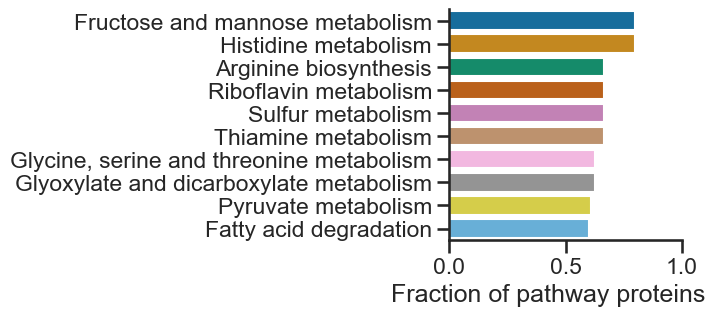

In [159]:
df=corr_res[corr_res.r>=0.5].groupby(by=['org','subpathway']).count()
df=df[df.r>=3]/corr_res.groupby(by=['org','subpathway']).count()
tmp=pd.DataFrame()
for idx,d in df.groupby(by='org'):
    d=d.reset_index()
    d=d[(d.subpathway!='Unclassified')&(d.subpathway!='Enzymes with EC')&(d.subpathway!='General function prediction')]
    tmp=pd.concat([tmp,d.nlargest(10,columns='r')])
plt.figure(figsize=(3,3))
sns.barplot(x='r',y='subpathway',data=tmp[tmp.org=='GW101-3H11'])
plt.xticks([0,.5,1])
plt.ylabel('')
plt.xlabel('Fraction of pathway proteins     ')

In [163]:
df=corr_res[abs(corr_res.r)>0.5].groupby(by=['org','pathway']).count()
df

r  contig  \
org        pathway                                                           
FW510-R12  Amino acid metabolism                                32      32   
           Carbohydrate metabolism                              67      67   
           Cell growth and death                                 4       4   
           Cell motility                                         1       1   
           Cellular community - prokaryotes                      1       1   
           Energy metabolism                                    28      28   
           Environmental adaptation                              1       1   
           Folding, sorting and degradation                     16      16   
           Glycan biosynthesis and metabolism                    5       5   
           Infectious disease: bacterial                         1       1   
           Lipid metabolism                                      5       5   
           Membrane transport                                    5       5   
           Metabolism of cofactors and vitamins                 15      15   
           Metabolism of other amino acids                       5       5   
           Nucleotide metabolism                                12      12   
           Protein families: genetic information processing     39      39   
           Protein families: metabolism                          8       8   
           Protein families: signaling and cellular processes   26      26   
           Replication and repair                                2       2   
           Signal transduction                                   9       9   
           Transcription                                         4       4   
           Translation                                          54      54   
           Unclassified                                        119     119   
           Xenobiotics biodegradation and metabolism             6       6   
GW101-3H11 Amino acid metabolism                                63      63   
           Carbohydrate metabolism                              86      86   
           Cell growth and death                                 7       7   
           Cell motility                                         2       2   
           Cellular community - prokaryotes                      7       7   
           Drug resistance: antimicrobial                        1       1   
           Endocrine system                                      1       1   
           Energy metabolism                                    39      39   
           Folding, sorting and degradation                     12      12   
           Glycan biosynthesis and metabolism                    2       2   
           Infectious disease: bacterial                         2       2   
           Lipid metabolism                                     10      10   
           Membrane transport                                   21      21   
           Metabolism of cofactors and vitamins                 28      28   
           Metabolism of other amino acids                       9       9   
           Metabolism of terpenoids and polyketides              1       1   
           Not included in regular maps                          1       1   
           Nucleotide metabolism                                26      26   
           Protein families: genetic information processing     61      61   
           Protein families: metabolism                          8       8   
           Protein families: signaling and cellular processes   29      29   
           Replication and repair                                6       6   
           Signal transduction                                  15      15   
           Transcription                                         3       3   
           Translation                                          18      18   
           Transport and catabolism                              1       1   
         

In [165]:
df=corr_res[corr_res.pathway=='Amino acid metabolism']
df[df.r<=-0.5].groupby(by=['org','subpathway']).count()

r  contig  \
org        subpathway                                                      
FW510-R12  Alanine, aspartate and glutamate metabolism         3       3   
           Cysteine and methionine metabolism                  4       4   
           Glycine, serine and threonine metabolism            5       5   
           Histidine metabolism                                1       1   
           Lysine biosynthesis                                 2       2   
           Lysine degradation                                  2       2   
           Phenylalanine metabolism                            1       1   
           Phenylalanine, tyrosine and tryptophan biosynth...  1       1   
           Tyrosine metabolism                                 1       1   
           Valine, leucine and isoleucine degradation          1       1   
GW101-3H11 Alanine, aspartate and glutamate metabolism         2       2   
           Glycine, serine and threonine metabolism            4       4   
           Lysine biosynthesis                                 3       3   
           Phenylalanine metabolism                            2       2   
           Tryptophan metabolism                               1       1   
           Valine, leucine and isoleucine degradation          1       1   

                                                               pathway  \
org        subpathway                                                    
FW510-R12  Alanine, aspartate and glutamate metabolism               3   
           Cysteine and methionine metabolism                        4   
           Glycine, serine and threonine metabolism                  5   
           Histidine metabolism                                      1   
           Lysine biosynthesis                                       2   
           Lysine degradation                                        2   
           Phenylalanine metabolism                                  1   
           Phenylalanine, tyrosine and tryptophan biosynth...        1   
           Tyrosine metabolism                                       1   
           Valine, leucine and isoleucine degradation                1   
GW101-3H11 Alanine, aspartate and glutamate metabolism               2   
           Glycine, serine and threonine metabolism                  4   
           Lysine biosynthesis                                       3   
           Phenylalanine metabolism                                  2   
           Tryptophan metabolism                                     1   
           Valine, leucine and isoleucine degradation                1   

                                                               enzyme  pvals  
org        subpathway                                                         
FW510-R12  Alanine, aspartate and glutamate metabolism              3      3  
           Cysteine and methionine metabolism                       4      4  
           Glycine, serine and threonine metabolism                 5      5  
           Histidine metabolism                                     1      1  
           Lysine biosynthesis                                      2      2  
           Lysine degradation                                       2      2  
           Phenylalanine metabolism                                 1      1  
           Phenylalanine, tyrosine and tryptophan biosynth...       1      1  
           Tyrosine metabolism                                      1      1  
           Valine, leucine and isoleucine degradation               1      1  
GW101-3H11 Alanine, aspartate and glutamate metabolism              2      2  
           Glycine, serine and threonine metabolism                 4      4  
           Lysine biosynthesis                                      3      3  
           Phenylalanine metabolism                                 2      2  
           Tryptophan metabolism                                    1      1  
           Valine,

In [167]:
df=corr_res[(corr_res.subpathway=='Histidine metabolism')&(corr_res.r>0.5)]
df

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_1670,0.749100,contig_1_1670,FW510-R12,Amino acid metabolism,Histidine metabolism,hisD; histidinol dehydrogenase,0.000006
JGI|GW101-3H11|contig_1_1074,0.776420,contig_1_1074,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisC; histidinol-phosphate aminotransferase,0.012892
JGI|GW101-3H11|contig_1_1075,0.889301,contig_1_1075,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisD; histidinol dehydrogenase,0.000065
JGI|GW101-3H11|contig_1_1076,0.907928,contig_1_1076,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisH; imidazole glycerol-phosphate synthase su...,0.000011
JGI|GW101-3H11|contig_1_1077,0.856249,contig_1_1077,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisA; phosphoribosylformimino-5-aminoimidazole...,0.000855
JGI|GW101-3H11|contig_1_1078,0.696754,contig_1_1078,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisF; imidazole glycerol-phosphate synthase su...,0.004556
JGI|GW101-3H11|contig_1_1825,0.688075,contig_1_1825,GW101-3H11,Amino acid metabolism,Histidine metabolism,hisG; ATP phosphoribosyltransferase,0.001716
JGI|GW101-3H11|contig_1_2241,0.726883,contig_1_2241,GW101-3H11,Amino acid metabolism,Histidine metabolism,"hutI, AMDHD1; imidazolonepropionase",0.063474
JGI|GW101-3H11|contig_1_2242,0.659115,contig_1_2242,GW101-3H11,Amino acid metabolism,Histidine metabolism,"hutU, UROC1; urocanate hydratase",0.140504


In [169]:
df=corr_res.groupby(by=['org','subpathway']).count()
df=df.reset_index()
df

,org,subpathway,r,contig,pathway,enzyme,pvals
0,FW510-R12,ABC transporters,10,10,10,10,10
1,FW510-R12,"Alanine, aspartate and glutamate metabolism",9,9,9,9,9
2,FW510-R12,Amino sugar and nucleotide sugar metabolism,12,12,12,12,12
3,FW510-R12,Aminoacyl-tRNA biosynthesis,18,18,18,18,18
4,FW510-R12,Apoptosis - fly,3,3,3,3,3
...,...,...,...,...,...,...,...
240,GW101-3H11,Unclassified,235,235,235,235,235
241,GW101-3H11,"Valine, leucine and isoleucine biosynthesis",3,3,3,3,3
242,GW101-3H11,"Valine, leucine and isoleucine degradation",6,6,6,6,6
243,GW101-3H11,Vitamin B6 metabolism,2,2,2,2,2


Text(-30.510416666666693, 0.5, '')

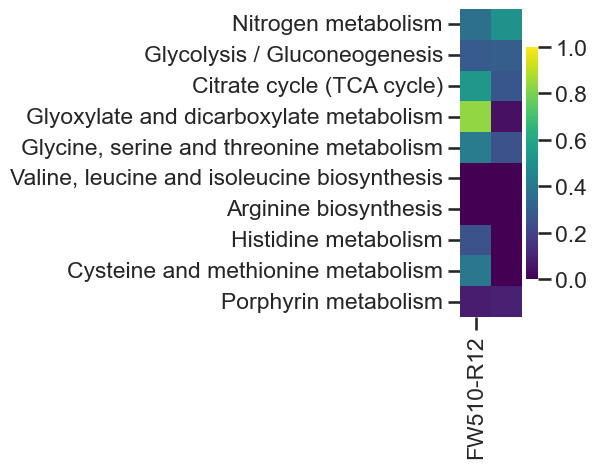

In [171]:
cat=['Nitrogen metabolism','Glycolysis / Gluconeogenesis','Citrate cycle (TCA cycle)','Glyoxylate and dicarboxylate metabolism','Glycine, serine and threonine metabolism','Valine, leucine and isoleucine biosynthesis','Arginine biosynthesis','Histidine metabolism','Cysteine and methionine metabolism','Porphyrin metabolism']
df=corr_res[corr_res.r<=-.5].groupby(by=['org','subpathway']).count().r/corr_res.groupby(by=['org','subpathway']).count().r
df=df.reset_index().pivot(index='subpathway',columns='org',values='r').fillna(0)
#df=df.unstack().fillna(0).T
plt.figure(figsize=(1,4))
sns.heatmap(df.reindex(cat).fillna(0),cmap='viridis',vmin=0,vmax=1)
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('')
#plt.savefig('Neg-Corr-Proteins-Comp_subpathway_percent.pdf',bbox_inches='tight')

/var/folders/06/47zwkw994h38rfpphgtmmm380000gq/T/ipykernel_56604/1740955295.py:14: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  zvals=syncom_zvals.loc[genes].groupby(level=0,axis=1).mean().loc[:,['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


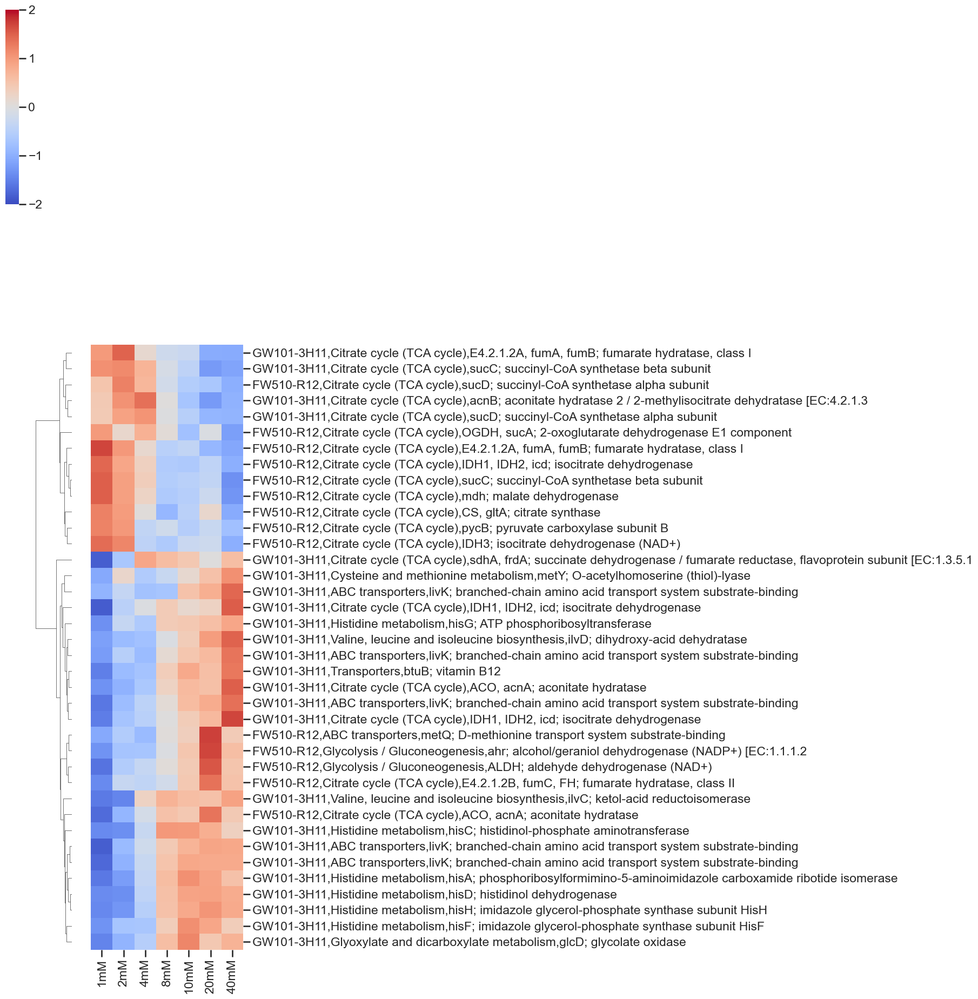

In [173]:
genes=['JGI|GW101-3H11|contig_1_1861','JGI|FW510-R12|contig_1_2723','JGI|GW101-3H11|contig_1_3019','JGI|GW101-3H11|contig_1_3302','JGI|GW101-3H11|contig_1_1074', 'JGI|GW101-3H11|contig_1_1075',
       'JGI|GW101-3H11|contig_1_1076', 'JGI|GW101-3H11|contig_1_1077',
       'JGI|GW101-3H11|contig_1_1078', 'JGI|GW101-3H11|contig_1_1825','JGI|GW101-3H11|contig_1_312','JGI|FW510-R12|contig_1_1090','JGI|FW510-R12|contig_1_2329','JGI|GW101-3H11|contig_1_2270','JGI|GW101-3H11|contig_1_2405','JGI|GW101-3H11|contig_1_279',
  'JGI|GW101-3H11|contig_1_3385','JGI|GW101-3H11|contig_1_546','JGI|GW101-3H11|contig_1_3272','JGI|FW510-R12|contig_1_1007', 'JGI|FW510-R12|contig_1_1008',
       'JGI|FW510-R12|contig_1_1520', 'JGI|FW510-R12|contig_1_1806',
       'JGI|FW510-R12|contig_1_1820', 'JGI|FW510-R12|contig_1_1860',
       'JGI|FW510-R12|contig_1_2663', 'JGI|FW510-R12|contig_1_3138',
       'JGI|FW510-R12|contig_1_3289', 'JGI|FW510-R12|contig_1_3391',
       'JGI|FW510-R12|contig_1_538','JGI|GW101-3H11|contig_1_130', 'JGI|GW101-3H11|contig_1_1402',
       'JGI|GW101-3H11|contig_1_1746', 'JGI|GW101-3H11|contig_1_1753',
       'JGI|GW101-3H11|contig_1_2422', 'JGI|GW101-3H11|contig_1_3314',
       'JGI|GW101-3H11|contig_1_4750', 'JGI|GW101-3H11|contig_1_4751']

zvals=syncom_zvals.loc[genes].groupby(level=0,axis=1).mean().loc[:,['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]

zvals.index=corr_res.loc[genes].org+','+corr_res.loc[genes].subpathway+','+corr_res.loc[genes].enzyme
sns.clustermap(zvals,cmap='coolwarm',col_cluster=False,figsize=(5,20),vmin=-2,vmax=2)
#plt.savefig('proteins-of-interest-heatmap-nitrate.pdf',bbox_inches='tight')

Found 19 KOS, 21 enzymes 19 proteins
Found 19 KOS, 19 enzymes 14 proteins


/var/folders/06/47zwkw994h38rfpphgtmmm380000gq/T/ipykernel_56604/875756267.py:25: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  res=res.groupby(level=0,axis=1).mean()
/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)
/var/folders/06/47zwkw994h38rfpphgtmmm380000gq/T/ipykernel_56604/875756267.py:62: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  res=res.groupby(level=0,axis=1).mean()
/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


Text(0.5, 1.0, 'R12')

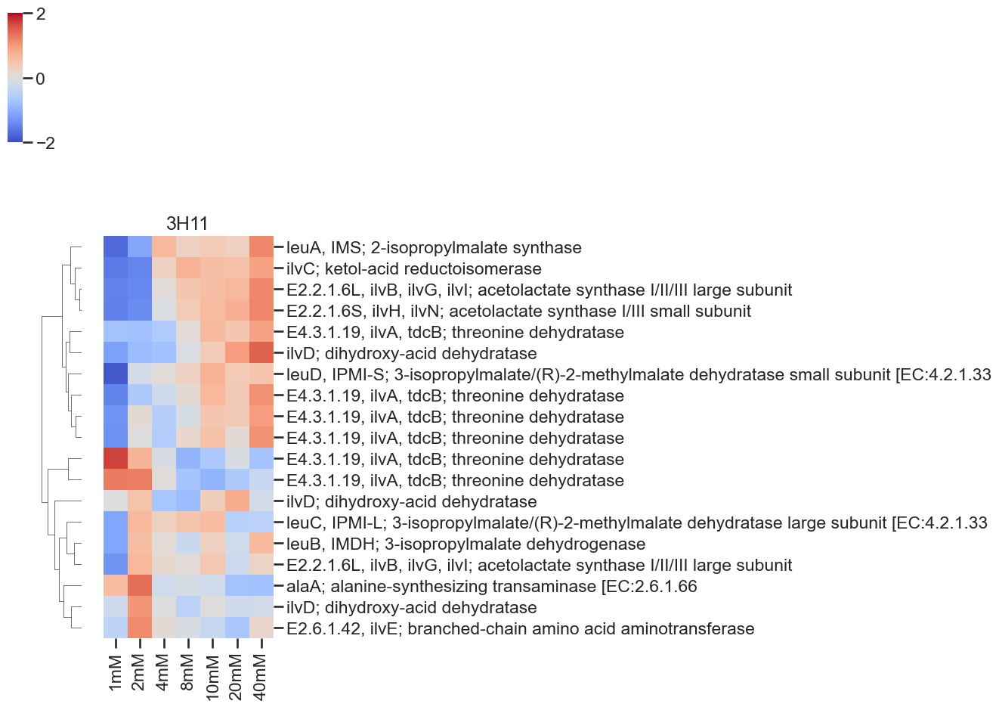

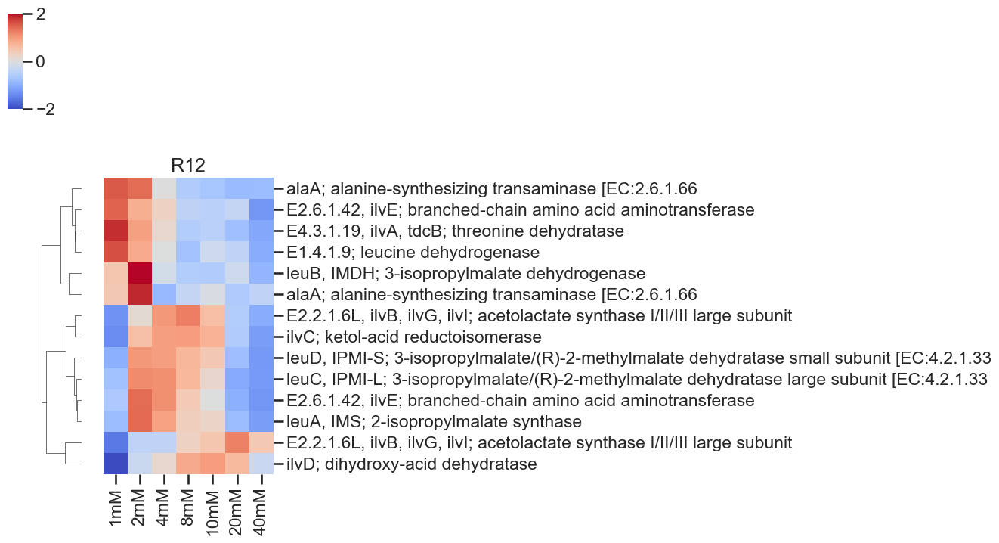

In [175]:
#3H11
cat='Valine, leucine and isoleucine biosynthesis'
kos=kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res=pd.DataFrame()
for ko in kos:
    idx=annot_3h11['KEGG KO'].dropna()[annot_3h11['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_3h11.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('GW101-3H11_')[1]
        vals=syncom_zvals[syncom_zvals.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res=pd.concat([res,vals.loc[index,:]])
        
res=res.groupby(level=0,axis=1).mean()
res=res[['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
print('Found %s KOS, %s enzymes %s proteins'%(len(pd.unique(kos)),len(genes),len(res)))
colors=sns.color_palette('tab20')

res.index=res.index.map(enzymes)
g=sns.clustermap(res,cmap='coolwarm',figsize=(4,0.5*len(res)),vmin=-2,vmax=2,yticklabels=1,col_cluster=False)
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_title('3H11')
#plt.savefig('3H11-Nitrate-Proteomics-Signal-transduction-heatmap.pdf',bbox_inches='tight')



#R12
kos=kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res=pd.DataFrame()
for ko in kos:
    idx=annot_r12['KEGG KO'].dropna()[annot_r12['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_r12.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('FW510-R12_')[1]
        vals=syncom_zvals[syncom_zvals.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res=pd.concat([res,vals.loc[index,:]])
        
res=res.groupby(level=0,axis=1).mean()
res=res[['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
print('Found %s KOS, %s enzymes %s proteins'%(len(pd.unique(kos)),len(genes),len(res)))
colors=sns.color_palette('tab20')

res.index=res.index.map(enzymes)
g=sns.clustermap(res,cmap='coolwarm',figsize=(4,0.5*len(res)),vmin=-2,vmax=2,yticklabels=1,col_cluster=False)
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_title('R12')
#plt.savefig('3H11-Nitrate-Proteomics-Signal-transduction-heatmap.pdf',bbox_inches='tight')


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


(-2.5, 2.5)

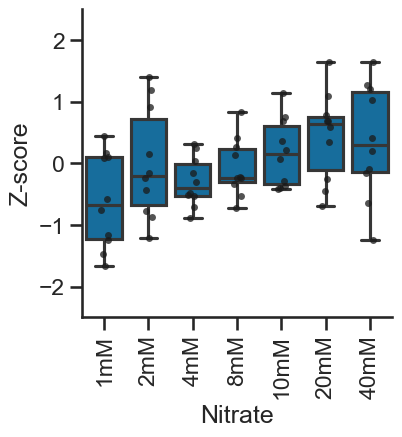

In [179]:
methionine_deg_kos=['K00789','K00552','K00558','K17398','K17399', 'K01251' 'K01697','K10150']
methionine_syn_kos=['K00928','K12524','K12525', 'K00133', 'K00003','K12524','K12525','K00651','K00641','K01739'
'K01760','K14155', 'K00548','K24042','K00549']

cat='Cysteine and methionine metabolism'
kos=methionine_syn_kos+methionine_deg_kos#kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res_h11=pd.DataFrame()
for ko in kos:
    idx=annot_3h11['KEGG KO'].dropna()[annot_3h11['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_3h11.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('GW101-3H11_')[1]
        vals=syncom_zvals[syncom_zvals.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res_h11=pd.concat([res_h11,vals.loc[index,:]])
        
#res_h11=res_h11.groupby(level=0,axis=1).mean()
res_h11=res_h11[['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
#res_h11.columns=[','.join(x) for x in res_h11.columns]
#res_h11.index=res_h11.index.map(enzymes)
res_h11=res_h11.drop_duplicates().unstack().reset_index()
res_h11.columns=['nitrate','rep','id','zscore']
res_h11=res_h11.drop('rep',axis=1).groupby(by=['id','nitrate']).mean().reset_index()
#res_h11=res_h11[(res_h11.id.str.contains('btu'))]
res_h11['org']='3H11'
plt.figure(figsize=(4,4))
sns.boxplot(x='nitrate',y='zscore',data=res_h11,color='b',order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
sns.stripplot(x='nitrate',y='zscore',data=res_h11,color='k',alpha=0.75,order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
plt.xticks(rotation=90)
plt.xlabel('Nitrate')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
#plt.title('3H11 BCAA Transport')
#plt.title('3H11 %s'%(cat))
#plt.savefig('3H11-Glycine, serine and threonine metabolism.pdf',bbox_inches='tight')

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


(-2.5, 2.5)

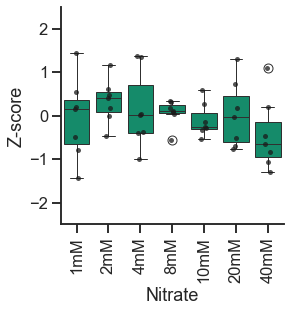

In [43]:
cat='Cysteine and methionine metabolism'
kos=methionine_syn_kos+methionine_deg_kos#kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res_r12=pd.DataFrame()
for ko in kos:
    idx=annot_r12['KEGG KO'].dropna()[annot_r12['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_r12.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('FW510-R12_')[1]
        vals=syncom_zvals[syncom_zvals.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res_r12=pd.concat([res_r12,vals.loc[index,:]])
    
#res_r12=res_r12.groupby(level=0,axis=1).mean()
res_r12=res_r12[['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
#res_r12.index=res_r12.index.map(enzymes)
res_r12=res_r12.drop_duplicates().unstack().reset_index()
res_r12.columns=['nitrate','rep','id','zscore']
res_r12=res_r12.drop('rep',axis=1).groupby(by=['nitrate','id']).mean().reset_index()
res_r12['org']='R12'
#res_h11=res_h11[(res_h11.index.str.contains('livH'))|((res_h11.index.str.contains('livK')))]
plt.figure(figsize=(4,4))
sns.boxplot(x='nitrate',y='zscore',data=res_r12,color='g',order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
sns.stripplot(x='nitrate',y='zscore',data=res_r12,color='k',alpha=0.75,order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
plt.xticks(rotation=90)
plt.xlabel('Nitrate')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
#plt.title('R12 BCAA Biosynthesis')

#plt.title('3H11 %s'%(cat))
#plt.savefig('3H11-Glycine, serine and threonine metabolism.pdf',bbox_inches='tight')

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.

Text(0.5, 1.0, 'Methionine biosynthesis')

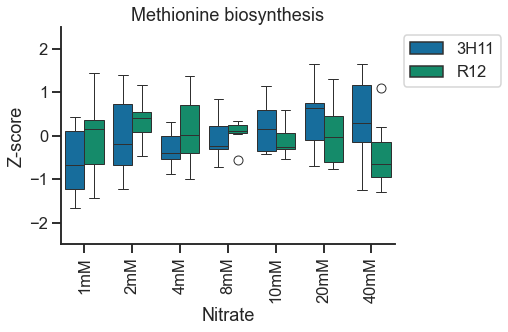

In [46]:
res=pd.concat([res_h11,res_r12],ignore_index=True)
colors=sns.color_palette('colorblind')
colors=[colors[0],colors[2]]
fig,ax=plt.subplots(1,1,figsize=(6,4))
sns.boxplot(x='nitrate',y='zscore',data=res,hue='org',palette=colors,order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
#sns.stripplot(x='nitrate',y='zscore',data=res,hue='org',color='k',alpha=0.75,dodge=True,order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
plt.xticks(rotation=90)
plt.xlabel('Nitrate')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2],bbox_to_anchor=(1,1))
plt.title('Methionine biosynthesis')

In [47]:
from scipy.stats import ttest_ind
for idx,df in res.groupby(by='nitrate'):
    x1=df[df.org=='3H11'].zscore
    x2=df[df.org=='R12'].zscore
    print(idx,ttest_ind(x1,x2))

10mM TtestResult(statistic=1.1320624741634382, pvalue=0.2753815474972966, df=15.0)
1mM TtestResult(statistic=-1.3412336690977045, pvalue=0.1998007652580811, df=15.0)
20mM TtestResult(statistic=1.1180696368013618, pvalue=0.2811246506601412, df=15.0)
2mM TtestResult(statistic=-0.9008471144052109, pvalue=0.3819058620905822, df=15.0)
40mM TtestResult(statistic=1.8181534466399194, pvalue=0.08906463766466856, df=15.0)
4mM TtestResult(statistic=-1.4015361276934044, pvalue=0.181405246892781, df=15.0)
8mM TtestResult(statistic=-0.6606860012407506, pvalue=0.5188324268043305, df=15.0)


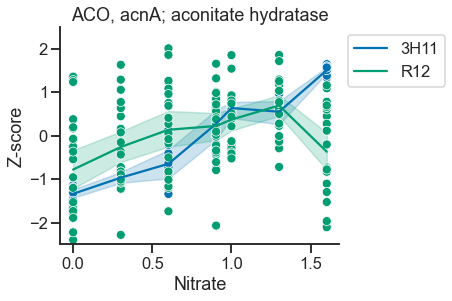

<Figure size 432x288 with 0 Axes>

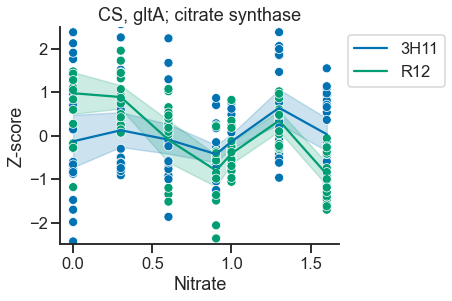

<Figure size 432x288 with 0 Axes>

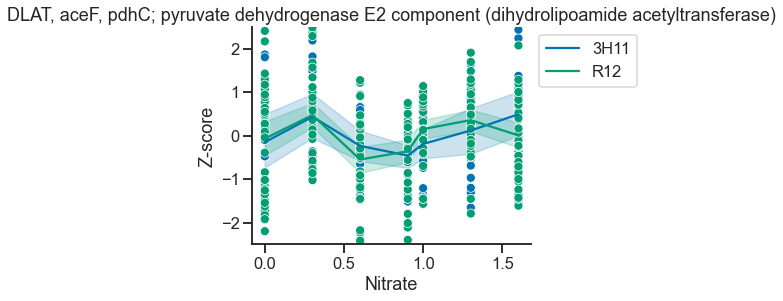

<Figure size 432x288 with 0 Axes>

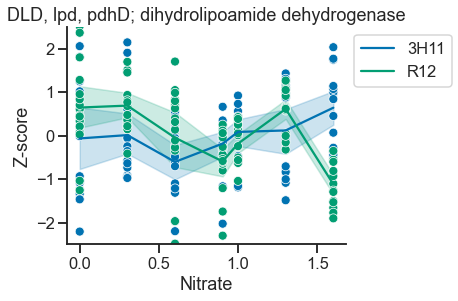

<Figure size 432x288 with 0 Axes>

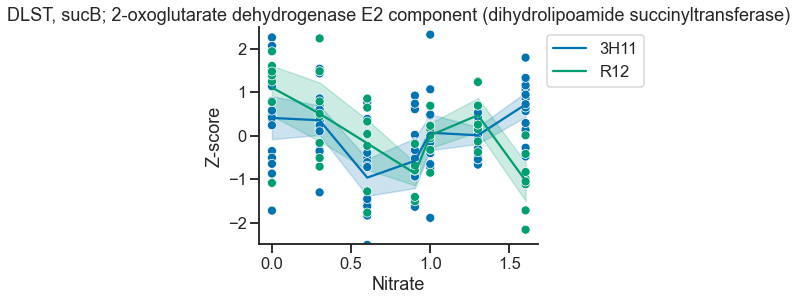

<Figure size 432x288 with 0 Axes>

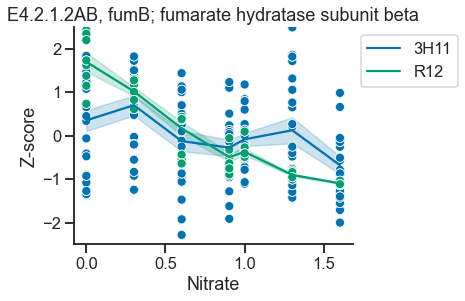

<Figure size 432x288 with 0 Axes>

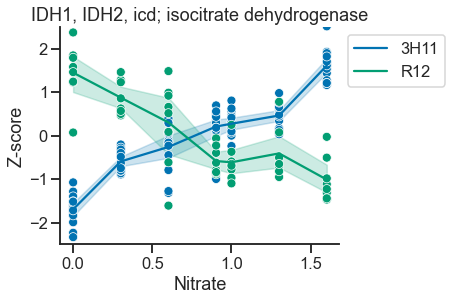

<Figure size 432x288 with 0 Axes>

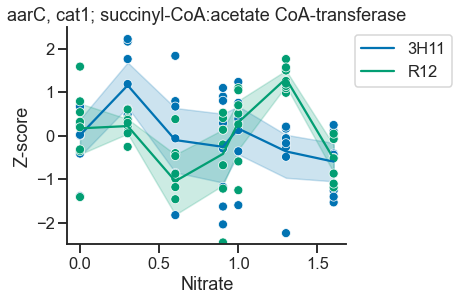

<Figure size 432x288 with 0 Axes>

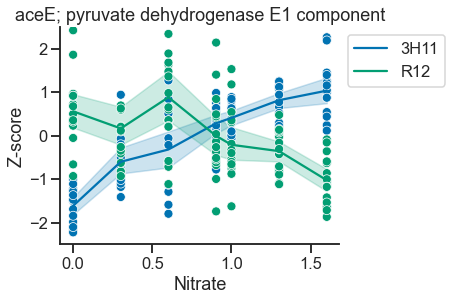

<Figure size 432x288 with 0 Axes>

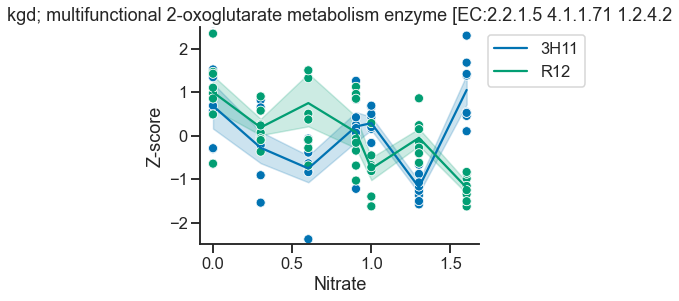

<Figure size 432x288 with 0 Axes>

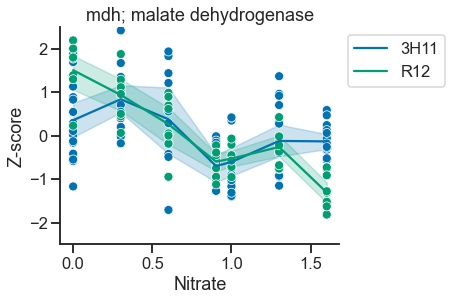

<Figure size 432x288 with 0 Axes>

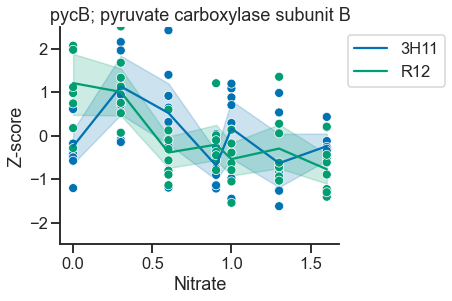

<Figure size 432x288 with 0 Axes>

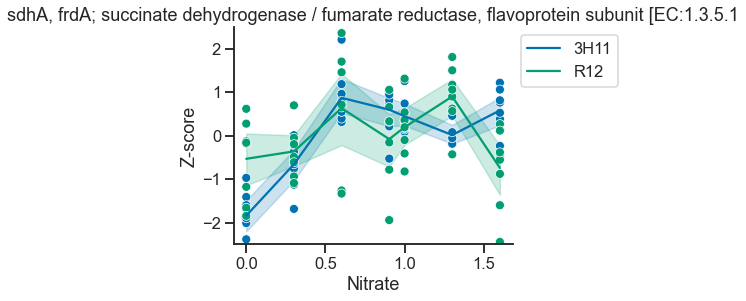

<Figure size 432x288 with 0 Axes>

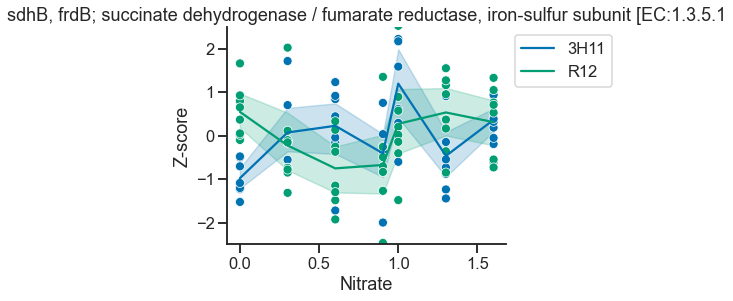

<Figure size 432x288 with 0 Axes>

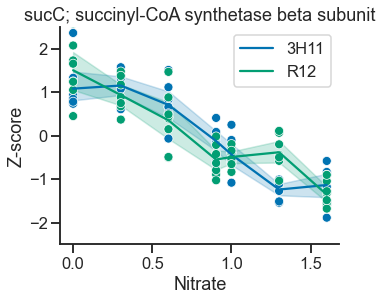

<Figure size 432x288 with 0 Axes>

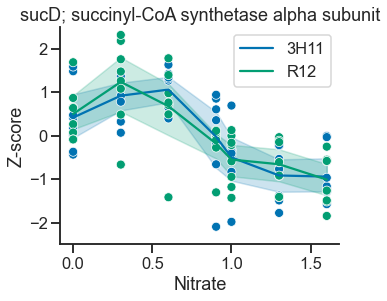

<Figure size 432x288 with 0 Axes>

In [186]:
res['conc']=[int(x[:-2]) for x in res.nitrate]
res['logconc']=np.log10(res.conc)
for idx,df in res.groupby(by='id'):
    colors=sns.color_palette('colorblind')
    colors=[colors[0],colors[2]]
    if len(df.org.unique())<2:
        continue
    fig,ax=plt.subplots(1,1,figsize=(5,4))
    sns.lineplot(x='logconc',y='zscore',data=df,hue='org',palette=colors)
    sns.scatterplot(x='logconc',y='zscore',data=df,hue='org',palette=colors)
    #sns.lineplot(x='nitrate',y='zscore',data=df,hue='org',color='k',alpha=0.75,dodge=True)
    plt.xlabel('Nitrate')
    plt.ylabel('Z-score')
    plt.ylim(-2.5,2.5)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:2], labels[:2],bbox_to_anchor=(1,1))
    plt.title(idx)
    plt.show()
    plt.clf()
#plt.title('BCAA Biosynthesis')

Text(0.5, 1.0, 'TCA Cycle')

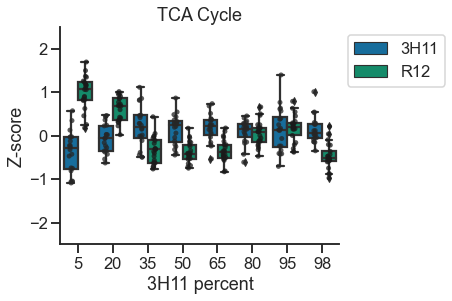

In [283]:
res=pd.concat([res_h11,res_r12],ignore_index=True)
colors=sns.color_palette('colorblind')
colors=[colors[0],colors[2]]
fig,ax=plt.subplots(1,1,figsize=(5,4))
sns.boxplot(x='3h11_percent',y='zscore',data=res,hue='org',palette=colors)#order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
sns.stripplot(x='3h11_percent',y='zscore',data=res,hue='org',color='k',alpha=0.75,dodge=True)#order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
#plt.xticks(rotation=90)
plt.xlabel('3H11 percent')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2],bbox_to_anchor=(1,1))
plt.title('TCA Cycle')

In [390]:
for idx,df in res.groupby(by='nitrate'):
    x1=df[df.org=='3H11'].zscore.values
    x2=df[df.org=='R12'].zscore.values
    print(idx,ttest_ind(x1,x2,equal_var=False))

10mM TtestResult(statistic=1.1519292229560438, pvalue=0.259677356282583, df=26.395142586207548)
1mM TtestResult(statistic=-1.4535422770399156, pvalue=0.15936932513596183, df=23.37330742104538)
20mM TtestResult(statistic=2.7723080170575995, pvalue=0.010367256008546873, df=24.968206042039704)
2mM TtestResult(statistic=-3.0073589409122543, pvalue=0.005193440101470709, df=30.974371000197298)
40mM TtestResult(statistic=6.5351194298350155, pvalue=2.734789274374491e-07, df=30.922808706560925)
4mM TtestResult(statistic=-2.4742623068429372, pvalue=0.022677986950226443, df=19.510832497270766)
8mM TtestResult(statistic=-0.8624989263429438, pvalue=0.39790945948673784, df=21.55123166991798)


/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


Text(0.5, 1.0, 'R12 Citrate cycle (TCA cycle)')

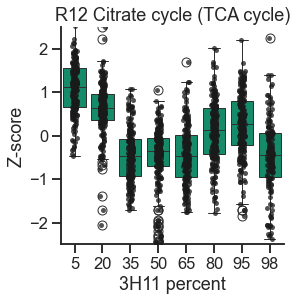

In [229]:
cat='Citrate cycle (TCA cycle)'
kos=kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res_r12=pd.DataFrame()
for ko in kos:
    idx=annot_r12['KEGG KO'].dropna()[annot_r12['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_r12.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('FW510-R12_')[1]
        vals=syncom_zvals2[syncom_zvals2.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res_r12=pd.concat([res_r12,vals.loc[index,:]])
res_r12=res_r12[res_r12.index.str.contains('R12')]   
#res_r12=res_r12.groupby(level=0,axis=1).mean()
#res_r12.index=res_r12.index.map(enzymes)
res_r12=res_r12.drop_duplicates().unstack().reset_index()
res_r12.columns=['3h11_percent','rep','id','zscore']
res_r12['3h11_percent']=[int(x.split('_')[1]) for x in res_r12['3h11_percent']]
#res_r12=res_r12.groupby(by=['id','3h11_percent']).mean().reset_index()
#res_h11=res_h11[(res_h11.index.str.contains('livH'))|((res_h11.index.str.contains('livK')))]
res_r12['org']='R12'
plt.figure(figsize=(4,4))
sns.boxplot(x='3h11_percent',y='zscore',data=res_r12,color='g')#order=['5', '20','35', '8mM', '10mM','20mM', '40mM'])
sns.stripplot(x='3h11_percent',y='zscore',data=res_r12,color='k',alpha=0.75)#order=['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM'])
#plt.xticks(rotation=90)
plt.xlabel('3H11 percent')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
#plt.title('3H11 BCAA Biosynthesis ')
plt.title('R12 %s'%(cat))
#plt.title('3H11 %s'%(cat))
#plt.savefig('3H11-Glycine, serine and threonine metabolism.pdf',bbox_inches='tight')

Text(0.5, 1.0, 'BCAA Biosynthesis')

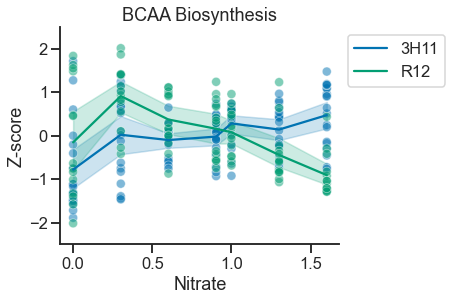

In [158]:
res['conc']=[int(x[:-2]) for x in res.nitrate]
res['logconc']=np.log10(res.conc)
fig,ax=plt.subplots(1,1,figsize=(5,4))
sns.lineplot(x='logconc',y='zscore',data=res,hue='org',palette=colors)
sns.scatterplot(x='logconc',y='zscore',data=res,hue='org',palette=colors,alpha=0.5)
#sns.stripplot(x='logconc',y='zscore',data=res,hue='org',color='k',alpha=0.75,dodge=True)
#plt.xticks(rotation=90)
plt.xlabel('Nitrate')
plt.ylabel('Z-score')
plt.ylim(-2.5,2.5)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2],bbox_to_anchor=(1,1))
plt.title('BCAA Biosynthesis')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

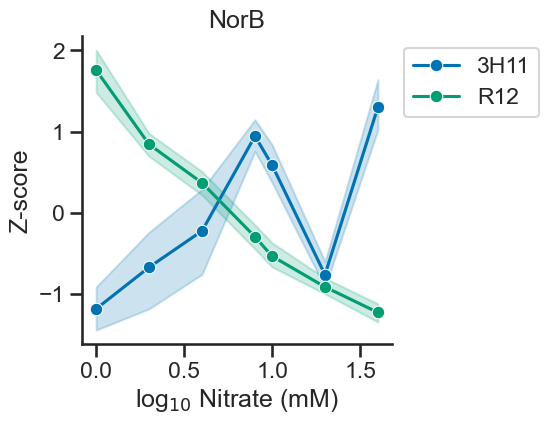

In [185]:
df=syncom_zvals.loc['JGI|GW101-3H11|contig_1_217'].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
#sns.scatterplot(x='log nitrate',y='zval',data=df)
sns.lineplot(x='log nitrate',y='zval',data=df,label='3H11',marker='o')
#plt.xticks(rotation=90)


df=syncom_zvals.loc['JGI|FW510-R12|contig_1_2855'].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
#sns.scatterplot(x='log nitrate',y='zval',data=df,color='g')
sns.lineplot(x='log nitrate',y='zval',data=df,color='g',label='R12',marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('log$_{10}$ Nitrate (mM)')
plt.title('NorB')
plt.legend(bbox_to_anchor=(1,1))
#plt.savefig('3H11+R12-nitrate-protein-norB.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

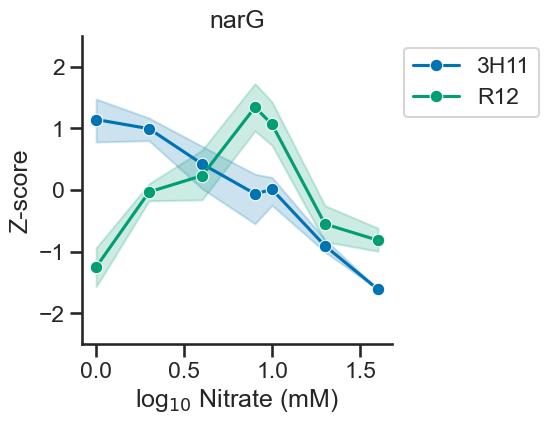

In [187]:
plt.figure(figsize=(4,4))
for g in ['JGI|GW101-3H11|contig_1_522']:
    df=syncom_zvals.loc[g].reset_index()
    df.columns=['condition','rep','zval']
    df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
    df=df[df.nitrate!=0]
    df['log nitrate']=np.log10(df.nitrate)
    #sns.scatterplot(x='log nitrate',y='zval',data=df)
    sns.lineplot(x='log nitrate',y='zval',data=df,label='3H11',marker='o',color='b')
    #plt.xticks(rotation=90)


df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_2872')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
#sns.scatterplot(x='log nitrate',y='zval',data=df,color='g')
sns.lineplot(x='log nitrate',y='zval',data=df,color='g',label='R12',marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('narG')
plt.xlabel('log$_{10}$ Nitrate (mM)')
plt.ylim(-2.5,2.5)
plt.legend(bbox_to_anchor=(1,1))
#plt.savefig('3H11+R12-nitrate-protein-narG.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

(-2.5, 2.5)

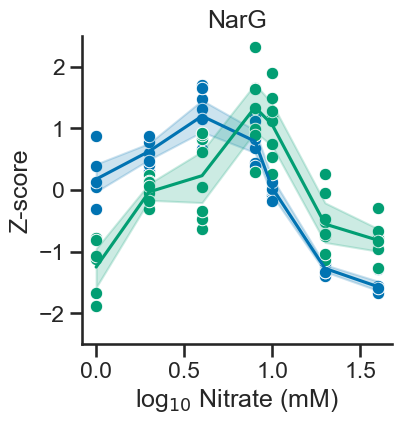

In [195]:
df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_520')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
sns.scatterplot(x='log nitrate',y='zval',data=df)
sns.lineplot(x='log nitrate',y='zval',data=df)
#plt.xticks(rotation=90)


df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_2872')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
sns.scatterplot(x='log nitrate',y='zval',data=df,color='g')
sns.lineplot(x='log nitrate',y='zval',data=df,color='g')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NarG')
plt.xlabel('log$_{10}$ Nitrate (mM)')
plt.ylim(-2.5,2.5)

#plt.savefig('3H11+R12-log-nitrate-narG.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

(-2.5, 2.5)

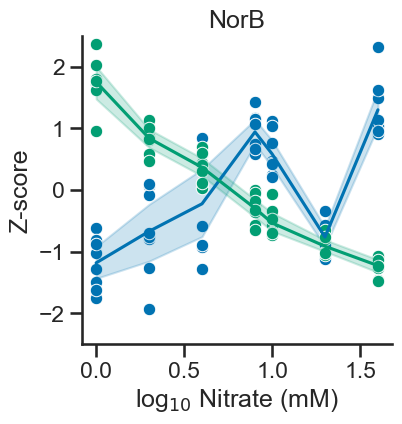

In [197]:
df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_217')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
sns.scatterplot(x='log nitrate',y='zval',data=df)
sns.lineplot(x='log nitrate',y='zval',data=df)
#plt.xticks(rotation=90)


df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_2855')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
sns.scatterplot(x='log nitrate',y='zval',data=df,color='g')
sns.lineplot(x='log nitrate',y='zval',data=df,color='g')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NorB')
plt.xlabel('log$_{10}$ Nitrate (mM)')
plt.ylim(-2.5,2.5)

#plt.savefig('3H11+R12-log-nitrate-norB.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'log$_{10}$ Nitrate (mM)')

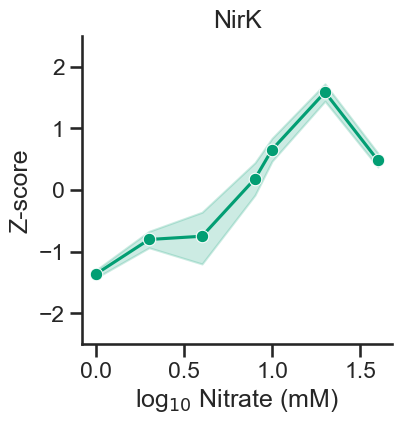

In [199]:
df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_3383')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
#sns.scatterplot(x='log nitrate',y='zval',data=df,marker='o',color='g')
sns.lineplot(x='log nitrate',y='zval',data=df,marker='o',color='g')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NirK')
plt.ylim(-2.5,2.5)
plt.xlabel('log$_{10}$ Nitrate (mM)')
#plt.savefig('R12-nitrate-protein-nirK.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'log$_{10}$ Nitrate (mM)')

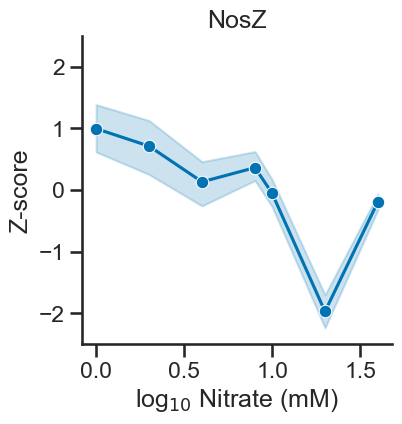

In [203]:


df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_1394')].iloc[1].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
#sns.scatterplot(x='log nitrate',y='zval',data=df,marker='o')
sns.lineplot(x='log nitrate',y='zval',data=df,marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NosZ')
plt.ylim(-2.5,2.5)
plt.xlabel('log$_{10}$ Nitrate (mM)')
#plt.savefig('3H11-nitrate-protein-nosZ.pdf',bbox_inches='tight')

In [211]:
protein=pd.read_csv('data/3H11.pr_matrix.csv')
idx=protein['Protein.Ids'].dropna().index
protein=protein.loc[idx]
h11_protein2=protein[protein['Protein.Ids'].str.contains('3H11')]
h11_protein2.index=h11_protein2['Protein.Ids']
h11_protein2=h11_protein2[['3H11_5-R1',
       '3H11_5-R2', '3H11_5-R3', '3H11_5-R4', '3H11_5-R5', '3H11_5-R6',
       '3H11_5-R7', '3H11_5-R8', '3H11_20-R1', '3H11_20-R2', '3H11_20-R3',
       '3H11_20-R4', '3H11_20-R5', '3H11_20-R6', '3H11_20-R7', '3H11_20-R8',
       '3H11_35-R1', '3H11_35-R2', '3H11_35-R3', '3H11_35-R4', '3H11_35-R5',
       '3H11_35-R6', '3H11_35-R7', '3H11_35-R8', '3H11_50-R1', '3H11_50-R2',
       '3H11_50-R3', '3H11_50-R4', '3H11_50-R5', '3H11_50-R6', '3H11_50-R7',
       '3H11_50-R8', '3H11_65-R1', '3H11_65-R2', '3H11_65-R3', '3H11_65-R4',
       '3H11_65-R5', '3H11_65-R6', '3H11_65-R7', '3H11_65-R8', '3H11_80-R1',
       '3H11_80-R2', '3H11_80-R3', '3H11_80-R4', '3H11_80-R5', '3H11_80-R6',
       '3H11_80-R7', '3H11_80-R8', '3H11_95-R1', '3H11_95-R2', '3H11_95-R3',
       '3H11_95-R4', '3H11_95-R5', '3H11_95-R6', '3H11_95-R7', '3H11_95-R8',
       '3H11_98-R1', '3H11_98-R2', '3H11_98-R3', '3H11_98-R4', '3H11_98-R5',
       '3H11_98-R6', '3H11_98-R7', '3H11_98-R8']]
h11_protein2=h11_protein2.groupby(level=0).sum()
z=((h11_protein2>0).sum(axis=1)/h11_protein2.columns.shape[0]).values

h11_protein2=h11_protein2[z>=0.8]
#h11_protein2=h11_protein2.divide(h11_protein2.sum(axis=0))
h11_protein2.columns=pd.MultiIndex.from_tuples([(x.split('-')[0],x.split('-')[1]) for x in h11_protein2.columns])
#h11_protein=h11_protein.groupby(level=0,axis=1).mean()
h11_zvals2=h11_protein2.apply(zscore,axis=1)
h11_zvals2=h11_zvals2[~h11_zvals2.index.str.contains(';')]
h11_zvals2

3H11_5                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1     0.597156 -0.037355 -0.973992 -1.375330   
JGI|GW101-3H11|contig_1_1002  0.330616 -0.706314 -1.074077 -1.619498   
JGI|GW101-3H11|contig_1_1003 -0.079902 -0.334234 -0.120788 -0.284592   
JGI|GW101-3H11|contig_1_1023  0.158703 -0.501022  0.129843 -0.604675   
JGI|GW101-3H11|contig_1_1024 -1.644340  0.887307 -1.177622 -0.093368   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_99   -1.340837  0.144036 -0.892406 -0.761020   
JGI|GW101-3H11|contig_1_992  -0.809470  0.792166 -0.709890 -1.047766   
JGI|GW101-3H11|contig_1_993   0.861610 -0.311156 -0.794008  1.189871   
JGI|GW101-3H11|contig_1_998   0.931460  0.722212  0.291425 -0.730258   
JGI|GW101-3H11|contig_1_999  -0.705905  0.938527  0.695128 -0.153492   

                                                                      \
                                    R5        R6        R7        R8   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -0.006118  0.130405  0.274198 -1.019265   
JGI|GW101-3H11|contig_1_1002 -0.944621 -1.452047 -1.628260 -0.894233   
JGI|GW101-3H11|contig_1_1003 -0.108004 -0.067185  0.473831 -0.249719   
JGI|GW101-3H11|contig_1_1023 -0.284059 -0.132044 -1.429136  0.000632   
JGI|GW101-3H11|contig_1_1024  0.572157 -0.081346 -0.200791 -0.967954   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_99   -0.993701 -0.771749 -0.872271 -0.089315   
JGI|GW101-3H11|contig_1_992   0.293932  0.344082 -0.424739  0.018454   
JGI|GW101-3H11|contig_1_993   1.031024  0.959517 -0.282784  0.988960   
JGI|GW101-3H11|contig_1_998   0.653988  0.571221 -0.590390  1.297536   
JGI|GW101-3H11|contig_1_999  -0.374340  0.670436 -0.717210  0.503812   

                               3H11_20            ...   3H11_95            \
                                    R1        R2  ...        R7        R8   
Protein.Ids                                       ...                       
JGI|GW101-3H11|contig_1_1     0.480707  1.127731  ... -0.807069  0.919722   
JGI|GW101-3H11|contig_1_1002  0.459833  0.834119  ... -0.908761 -0.437382   
JGI|GW101-3H11|contig_1_1003 -0.428028 -0.172736  ... -0.349452 -0.144787   
JGI|GW101-3H11|contig_1_1023  0.597752 -0.305326  ...  1.353606  1.245074   
JGI|GW101-3H11|contig_1_1024  0.942795 -0.243557  ...  1.324003  0.954631   
...                                ...       ...  ...       ...       ...   
JGI|GW101-3H11|contig_1_99   -0.370224 -0.768929  ... -0.353241  0.335643   
JGI|GW101-3H11|contig_1_992   0.515452  0.808475  ...  0.989461  1.436386   
JGI|GW101-3H11|contig_1_993   0.206379  0.484201  ... -1.649621  1.203731   
JGI|GW101-3H11|contig_1_998   0.449138  0.558072  ...  2.284173 -0.751355   
JGI|GW101-3H11|contig_1_999   1.158342  0.548350  ...  0.287703 -0.290172   

                               3H11_98                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -1.955993 -0.548292 -1.097048 -1.136568   
JGI|GW101-3H11|contig_1_1002  0.937765 -0.851882 -0.871531 -0.741500   
JGI|GW101-3H11|contig_1_1003 -0.919654 -0.773250 -0.541688 -0.810763   
JGI|GW101-3H11|contig_1_1023 -2.281898 -1.088006  0.080375 -1.571979   
JGI|GW101-3H11|contig_1_1024 -1.644340  0.511117 -0.199947  0.432236   
...                                ...       ...       ...       ...   
JGI|GW101-3H11|contig_1_99   -2.224358  1.547181  1.232610 -1.355025   
JGI|GW101-3H11|contig_1_992  -1.890701 -2.037443  0.164655 -0.103840   
JGI|GW101-3H11|contig_1_993  -1.649621 -0.375142 -0.848584 -1.039816   
JGI|GW101-3H11|contig_1_998  -2.412236 -1.483023 -1.774332 -0.377126   

In [213]:
protein=pd.read_csv('data/3H11.pr_matrix.csv')
idx=protein['Protein.Ids'].dropna().index
protein=protein.loc[idx]
r12_protein2=protein[protein['Protein.Ids'].str.contains('R12')]
r12_protein2.index=r12_protein2['Protein.Ids']
r12_protein2=r12_protein2[['3H11_5-R1',
       '3H11_5-R2', '3H11_5-R3', '3H11_5-R4', '3H11_5-R5', '3H11_5-R6',
       '3H11_5-R7', '3H11_5-R8', '3H11_20-R1', '3H11_20-R2', '3H11_20-R3',
       '3H11_20-R4', '3H11_20-R5', '3H11_20-R6', '3H11_20-R7', '3H11_20-R8',
       '3H11_35-R1', '3H11_35-R2', '3H11_35-R3', '3H11_35-R4', '3H11_35-R5',
       '3H11_35-R6', '3H11_35-R7', '3H11_35-R8', '3H11_50-R1', '3H11_50-R2',
       '3H11_50-R3', '3H11_50-R4', '3H11_50-R5', '3H11_50-R6', '3H11_50-R7',
       '3H11_50-R8', '3H11_65-R1', '3H11_65-R2', '3H11_65-R3', '3H11_65-R4',
       '3H11_65-R5', '3H11_65-R6', '3H11_65-R7', '3H11_65-R8', '3H11_80-R1',
       '3H11_80-R2', '3H11_80-R3', '3H11_80-R4', '3H11_80-R5', '3H11_80-R6',
       '3H11_80-R7', '3H11_80-R8', '3H11_95-R1', '3H11_95-R2', '3H11_95-R3',
       '3H11_95-R4', '3H11_95-R5', '3H11_95-R6', '3H11_95-R7', '3H11_95-R8',
       '3H11_98-R1', '3H11_98-R2', '3H11_98-R3', '3H11_98-R4', '3H11_98-R5',
       '3H11_98-R6', '3H11_98-R7', '3H11_98-R8']]
r12_protein2=r12_protein2.groupby(level=0).sum()
z=((r12_protein2>0).sum(axis=1)/r12_protein2.columns.shape[0]).values

r12_protein2=r12_protein2[z>=0.8]
#h11_protein2=h11_protein2.divide(h11_protein2.sum(axis=0))
r12_protein2.columns=pd.MultiIndex.from_tuples([(x.split('-')[0],x.split('-')[1]) for x in r12_protein2.columns])
#h11_protein=h11_protein.groupby(level=0,axis=1).mean()
r12_zvals2=r12_protein2.apply(zscore,axis=1)
r12_zvals2=r12_zvals2[~r12_zvals2.index.str.contains(';')]
r12_zvals2

3H11_5                                          \
                                   R1        R2        R3        R4        R5   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10   -0.178398 -0.220634  0.496730 -0.135776  0.295773   
JGI|FW510-R12|contig_1_1000 -0.721332 -0.426460 -0.763246 -0.441697  1.492374   
JGI|FW510-R12|contig_1_1003  0.305759  1.313729  1.757340  1.109656  1.782792   
JGI|FW510-R12|contig_1_1007  0.859109  1.672547  1.566503  1.278111  1.258740   
JGI|FW510-R12|contig_1_1008  1.784499  1.810417  1.203342  1.201325  1.465076   
...                               ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122  -0.832778 -0.102084  0.201435 -0.352462 -1.331793   
JGI|FW510-R12|contig_2_123   1.352489 -0.130557  0.548233  0.339172  1.747815   
JGI|FW510-R12|contig_2_160   1.447740 -0.302003  2.703629  0.194522 -0.772039   
JGI|FW510-R12|contig_2_161   1.188914  1.191192  1.180819  0.868852  1.220481   
JGI|FW510-R12|contig_2_26    0.551814  1.165866 -0.784764 -0.796070  1.261071   

                                                            3H11_20            \
                                   R6        R7        R8        R1        R2   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10    0.169587  1.411609 -0.930779 -0.605838 -0.341091   
JGI|FW510-R12|contig_1_1000 -0.384293 -0.487382  1.810533 -0.971949 -0.482272   
JGI|FW510-R12|contig_1_1003  2.000797  0.330712  0.592018 -0.032444  1.179114   
JGI|FW510-R12|contig_1_1007  1.551530  0.755082  1.092243  0.715923  1.133969   
JGI|FW510-R12|contig_1_1008  2.224190  1.221993  1.050264  0.980452  1.465604   
...                               ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122   1.313009  1.547002 -0.245144  0.911165 -0.221810   
JGI|FW510-R12|contig_2_123   0.688727  2.436071  0.892217  0.134037 -0.231392   
JGI|FW510-R12|contig_2_160   1.753907  1.247023 -0.120678  0.250985  4.260947   
JGI|FW510-R12|contig_2_161   0.888845 -0.573519  1.018638  0.792399  0.488674   
JGI|FW510-R12|contig_2_26    1.591994 -0.663828 -0.289584 -0.481827  0.942567   

                             ...   3H11_95             3H11_98            \
                             ...        R7        R8        R1        R2   
Protein.Ids                  ...                                           
JGI|FW510-R12|contig_1_10    ... -0.426070  1.622585 -2.050086  0.158815   
JGI|FW510-R12|contig_1_1000  ...  1.652694  0.698796 -0.831931 -0.656570   
JGI|FW510-R12|contig_1_1003  ...  1.678995 -1.750588 -2.381536 -0.302719   
JGI|FW510-R12|contig_1_1007  ...  1.195475 -0.651156 -0.674195 -0.344153   
JGI|FW510-R12|contig_1_1008  ...  0.897671 -0.517954 -2.518986 -0.208659   
...                          ...       ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122   ...  1.035980 -0.196370 -2.239383 -0.328083   
JGI|FW510-R12|contig_2_123   ...  1.124682  1.488739 -2.464386 -0.445357   
JGI|FW510-R12|contig_2_160   ... -0.210652 -0.272057 -1.349567 -0.993900   
JGI|FW510-R12|contig_2_161   ...  1.147021  0.924665 -1.816801  0.596755   
JGI|FW510-R12|contig_2_26    ...  1.432177  1.275283 -0.676027 -0.475976   

                                                                               \
                                   R3        R4        R5        R6        R7   
Protein.Ids                                                                     
JGI|FW510-R12|contig_1_10   -0.817030 -0.459858  0.385713 -1.497475 -0.375167   
JGI|FW510-R12|contig_1_1000  1.108401 -0.850186  0.828579  0.235294 -0.580974   
JGI|FW510-R12|contig_1_1003  0.199415 -1.956497 -2.004447 -2.244205  1.302565   
JGI|FW510-R12|contig_1_1007 -0.474887 -0.997553 -0.607702 -2.096864  1.194412   
JGI|FW510-R12|contig_1_1008 -0.526378 -1.191070 -0.769175 -1.811120  0.011942   
...                               ...       ... 

In [215]:
syncom_zvals2=pd.concat([h11_zvals2,r12_zvals2])
syncom_zvals2=syncom_zvals2[syncom_zvals2.columns.drop([('3H11_98','R1'),('3H11_98','R8')])]
syncom_zvals2

3H11_5                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1     0.597156 -0.037355 -0.973992 -1.375330   
JGI|GW101-3H11|contig_1_1002  0.330616 -0.706314 -1.074077 -1.619498   
JGI|GW101-3H11|contig_1_1003 -0.079902 -0.334234 -0.120788 -0.284592   
JGI|GW101-3H11|contig_1_1023  0.158703 -0.501022  0.129843 -0.604675   
JGI|GW101-3H11|contig_1_1024 -1.644340  0.887307 -1.177622 -0.093368   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122   -0.832778 -0.102084  0.201435 -0.352462   
JGI|FW510-R12|contig_2_123    1.352489 -0.130557  0.548233  0.339172   
JGI|FW510-R12|contig_2_160    1.447740 -0.302003  2.703629  0.194522   
JGI|FW510-R12|contig_2_161    1.188914  1.191192  1.180819  0.868852   
JGI|FW510-R12|contig_2_26     0.551814  1.165866 -0.784764 -0.796070   

                                                                      \
                                    R5        R6        R7        R8   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -0.006118  0.130405  0.274198 -1.019265   
JGI|GW101-3H11|contig_1_1002 -0.944621 -1.452047 -1.628260 -0.894233   
JGI|GW101-3H11|contig_1_1003 -0.108004 -0.067185  0.473831 -0.249719   
JGI|GW101-3H11|contig_1_1023 -0.284059 -0.132044 -1.429136  0.000632   
JGI|GW101-3H11|contig_1_1024  0.572157 -0.081346 -0.200791 -0.967954   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122   -1.331793  1.313009  1.547002 -0.245144   
JGI|FW510-R12|contig_2_123    1.747815  0.688727  2.436071  0.892217   
JGI|FW510-R12|contig_2_160   -0.772039  1.753907  1.247023 -0.120678   
JGI|FW510-R12|contig_2_161    1.220481  0.888845 -0.573519  1.018638   
JGI|FW510-R12|contig_2_26     1.261071  1.591994 -0.663828 -0.289584   

                               3H11_20            ...   3H11_95            \
                                    R1        R2  ...        R5        R6   
Protein.Ids                                       ...                       
JGI|GW101-3H11|contig_1_1     0.480707  1.127731  ... -0.872640  1.681208   
JGI|GW101-3H11|contig_1_1002  0.459833  0.834119  ...  0.242881 -0.747614   
JGI|GW101-3H11|contig_1_1003 -0.428028 -0.172736  ...  0.330203  0.218246   
JGI|GW101-3H11|contig_1_1023  0.597752 -0.305326  ... -0.086777  0.604360   
JGI|GW101-3H11|contig_1_1024  0.942795 -0.243557  ... -1.268658  0.103551   
...                                ...       ...  ...       ...       ...   
JGI|FW510-R12|contig_2_122    0.911165 -0.221810  ... -0.757622  0.937643   
JGI|FW510-R12|contig_2_123    0.134037 -0.231392  ...  0.915836 -0.807063   
JGI|FW510-R12|contig_2_160    0.250985  4.260947  ... -0.606149 -0.649699   
JGI|FW510-R12|contig_2_161    0.792399  0.488674  ... -0.962897 -1.138013   
JGI|FW510-R12|contig_2_26    -0.481827  0.942567  ... -1.261989  0.777095   

                                                   3H11_98            \
                                    R7        R8        R2        R3   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1    -0.807069  0.919722 -0.548292 -1.097048   
JGI|GW101-3H11|contig_1_1002 -0.908761 -0.437382 -0.851882 -0.871531   
JGI|GW101-3H11|contig_1_1003 -0.349452 -0.144787 -0.773250 -0.541688   
JGI|GW101-3H11|contig_1_1023  1.353606  1.245074 -1.088006  0.080375   
JGI|GW101-3H11|contig_1_1024  1.324003  0.954631  0.511117 -0.199947   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_2_122    1.035980 -0.196370 -0.328083  0.422755   
JGI|FW510-R12|contig_2_123    1.124682  1.488739 -0.445357  0.851330   
JGI|FW510-R12|contig_2_160   -0.210652 -0.272057 -0.993900 -0.405063   
JGI|FW510-R12|contig_2_161    1.147021  0.924665  0.596755 -1.261547   

Text(0.5, 1.0, '3H11')

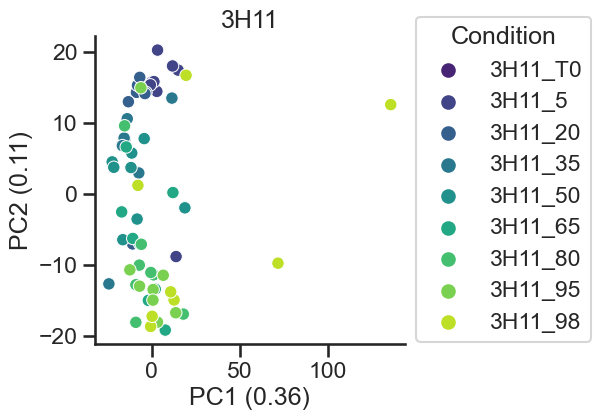

In [217]:
pca = PCA(n_components=3)
zvals=h11_zvals2#[h11_zvals2.columns.drop([('3H11_98','R1'),('3H11_98','R8'),('3H11_T0','R1'),('3H11_T0','R2')])]

res = pca.fit_transform(zvals.T)
colors=sns.color_palette('viridis')

pca_df = pd.DataFrame(data = res, columns = ['PC1', 'PC2','PC3'])
pca_df['sample']=[x[0] for x in zvals.columns.values]

#pca_df=pca_df.drop([12,13,14,18,19,20],axis=0)
#time_dict={42:'T1',53:'T2',71:'T3',95:'T4'}
#new_times=pca_df[pca_df.cond=='3H11'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='3H11'].index
#pca_df.loc[idx,'time']=new_times

#new_times=pca_df[pca_df.cond=='SynCom'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='SynCom'].index
#pca_df.loc[idx,'time']=new_times

fig,ax =plt.subplots(1,1,figsize=(4,4))
g=sns.scatterplot(x='PC1',y='PC2',data=pca_df,hue='sample',ax=ax,palette='viridis',hue_order=['3H11_T0','3H11_5', '3H11_20', '3H11_35', '3H11_50', '3H11_65', '3H11_80','3H11_95', '3H11_98'])
handles, labels = g.get_legend_handles_labels()
g.legend(bbox_to_anchor=(1,1.1),title='Condition')
plt.xlabel('PC1 (%s)'%(pca.explained_variance_ratio_[0].round(2)))
plt.ylabel('PC2 (%s)'%(pca.explained_variance_ratio_[1].round(2)))
plt.title('3H11')
#plt.savefig('3H11-ratios-Proteomics-PCA-v1.pdf',bbox_inches='tight')

Text(0.5, 1.0, 'SynCom')

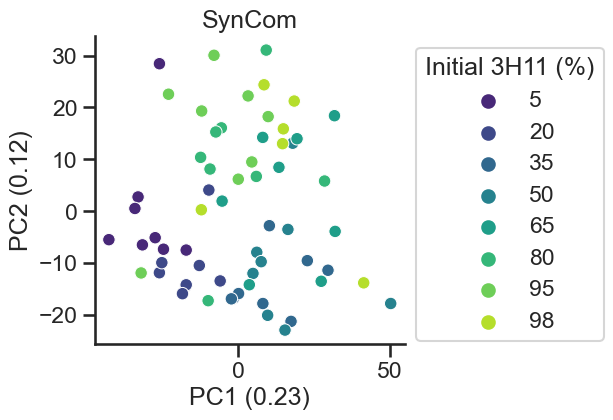

In [219]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
zvals=syncom_zvals2#[h11_zvals2.columns.drop(['3H11_T0'])]
#zvals=zvals[zvals.columns.drop([('3H11_98','R1'),('3H11_98','R8')])]
res = pca.fit_transform(zvals.T)
colors=sns.color_palette('viridis')

pca_df2 = pd.DataFrame(data = res, columns = ['PC1', 'PC2','PC3'])
pca_df2['sample']=[x[0] for x in zvals.columns.values]
pca_df2['3H11_percent']=[x.split('_')[1] for x in pca_df2['sample']]
#pca_df=pca_df.drop([12,13,14,18,19,20],axis=0)
#time_dict={42:'T1',53:'T2',71:'T3',95:'T4'}
#new_times=pca_df[pca_df.cond=='3H11'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='3H11'].index
#pca_df.loc[idx,'time']=new_times

#new_times=pca_df[pca_df.cond=='SynCom'].time.map(time_dict)
#idx=pca_df[pca_df.cond=='SynCom'].index
#pca_df.loc[idx,'time']=new_times

fig,ax =plt.subplots(1,1,figsize=(4,4))
g=sns.scatterplot(x='PC1',y='PC2',data=pca_df2,hue='3H11_percent',ax=ax,palette='viridis')
handles, labels = g.get_legend_handles_labels()
g.legend(bbox_to_anchor=(1,1),title='Initial 3H11 (%)')
plt.xlabel('PC1 (%s)'%(pca.explained_variance_ratio_[0].round(2)))
plt.ylabel('PC2 (%s)'%(pca.explained_variance_ratio_[1].round(2)))
plt.title('SynCom')
#plt.savefig('SynCom-ratios-Proteomics-PCA-v2.pdf',bbox_inches='tight')

In [227]:
corrs=[]
pvals=[]
genes=[]
zvals=syncom_zvals2.copy()
for i in tqdm(zvals.index):
    df=zvals.loc[i,['3H11_5', '3H11_20', '3H11_35', '3H11_50', '3H11_65', '3H11_80','3H11_95', '3H11_98']].reset_index()
    df.columns=['condition','rep','zval']
    df['ratio']=[int(x.split('_')[1]) for x in df.condition ]
    linres=linregress(df['ratio'],df['zval'])
    corrs.append(linres.rvalue)
    pvals.append(linres.pvalue)
    genes.append(i)
rej, pval_corr = multipletests(pvals, method='fdr_bh',alpha=0.01)[:2]
hits2=np.array(genes)
hits2=hits2[rej]
pval_hits2=pval_corr[rej]
syncom_hits2=syncom_zvals2.loc[hits2]
rvals2=np.array(corrs)[rej]
syncom_hits2=syncom_hits2[abs(rvals2)>=0.5]
syncom_hits2

100%|███████████████████████████████████████| 2335/2335 [00:01<00:00, 2333.42it/s]


3H11_5                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1054  0.999413  0.910014  0.379201  0.733578   
JGI|GW101-3H11|contig_1_1065 -0.691723 -0.550943 -1.928427 -2.625970   
JGI|GW101-3H11|contig_1_1073  2.114790  1.615313  0.831213  0.796968   
JGI|GW101-3H11|contig_1_1074  1.941898  1.373338  1.593810  1.812558   
JGI|GW101-3H11|contig_1_1075  1.234766  1.126276  1.099729  1.827534   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_64     0.833496  1.539154  1.478074  0.919209   
JGI|FW510-R12|contig_1_699    1.335137  1.546129  1.518150  1.917183   
JGI|FW510-R12|contig_1_887    0.797012  1.679048  1.843123  1.427957   
JGI|FW510-R12|contig_1_963    1.461327  2.064728  2.123230  2.193955   
JGI|FW510-R12|contig_1_964    1.586905  1.849432  1.945884  2.003477   

                                                                      \
                                    R5        R6        R7        R8   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1054  0.639408  0.672136 -1.112497  0.564457   
JGI|GW101-3H11|contig_1_1065 -0.204126 -0.592719 -0.424634 -0.112945   
JGI|GW101-3H11|contig_1_1073  0.776852  0.895669 -0.225054  0.833150   
JGI|GW101-3H11|contig_1_1074  1.549967  1.638326 -0.209354  0.916116   
JGI|GW101-3H11|contig_1_1075  2.017104  1.699576 -1.217043  0.995114   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_64     1.546682  1.723540  0.299921  1.098651   
JGI|FW510-R12|contig_1_699   -0.148634  1.515260  0.459906  1.742948   
JGI|FW510-R12|contig_1_887    1.676249  1.849522  1.318260  1.356166   
JGI|FW510-R12|contig_1_963    1.385879  1.865204 -0.376320  1.718019   
JGI|FW510-R12|contig_1_964    1.824031  1.700840  0.246710  0.800224   

                               3H11_20            ...   3H11_95            \
                                    R1        R2  ...        R5        R6   
Protein.Ids                                       ...                       
JGI|GW101-3H11|contig_1_1054  1.052325  1.256658  ... -0.382484 -1.275647   
JGI|GW101-3H11|contig_1_1065  0.587203 -0.477671  ...  0.703581  0.391101   
JGI|GW101-3H11|contig_1_1073  0.700327  1.622766  ... -1.204263 -0.615126   
JGI|GW101-3H11|contig_1_1074  0.802951  1.597997  ... -0.776868 -1.130150   
JGI|GW101-3H11|contig_1_1075  1.022647  1.856513  ... -1.038983 -1.205096   
...                                ...       ...  ...       ...       ...   
JGI|FW510-R12|contig_1_64     1.031564  1.664713  ... -1.898158 -0.362028   
JGI|FW510-R12|contig_1_699    1.441168  0.795122  ... -0.934378 -0.546385   
JGI|FW510-R12|contig_1_887    1.046613  0.911897  ... -0.969544 -0.374401   
JGI|FW510-R12|contig_1_963    1.635139  0.985093  ... -1.364692 -1.059718   
JGI|FW510-R12|contig_1_964    1.052449  1.577990  ... -0.893484 -0.750494   

                                                   3H11_98            \
                                    R7        R8        R2        R3   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1054  0.298376 -0.363177  0.413871  0.007121   
JGI|GW101-3H11|contig_1_1065 -0.364951  0.371560  0.260090  0.707772   
JGI|GW101-3H11|contig_1_1073  1.248781  0.172090 -1.080568 -0.971583   
JGI|GW101-3H11|contig_1_1074  1.405553 -0.569451 -0.801978 -0.817724   
JGI|GW101-3H11|contig_1_1075  1.890331 -1.299412 -0.887759 -1.040805   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_64     1.403388 -0.904696 -0.512683 -0.215763   
JGI|FW510-R12|contig_1_699    0.644667  0.114957  0.299086  0.432692   
JGI|FW510-R12|contig_1_887    1.609509 -0.754746 -0.545614 -0.098766   
JGI|FW510-R12|contig_1_963    0.630635 -1.185888 -0.633470 -1.623594   

In [229]:
corr_res2=pd.DataFrame(corrs)
corr_res2.columns=['r']
corr_res2.index=syncom_zvals2.index
corr_res2['contig']=[i.split('|')[2] for i in corr_res2.index]
corr_res2['org']=[i.split('|')[1] for i in corr_res2.index]

paths=[]
for i in corr_res2.index:
    gene=corr_res2.loc[i,'org']+'_'+corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].pathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res2['pathway']=paths

paths=[]
for i in corr_res2.index:
    gene=corr_res2.loc[i,'org']+'_'+corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].subpathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res2['subpathway']=paths

paths=[]
for i in corr_res2.index:
    gene=corr_res2.loc[i,'org']+'_'+corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].enzyme.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
corr_res2['enzyme']=paths
corr_res2['pvals']=pval_corr
corr_res2

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|GW101-3H11|contig_1_1,-0.143339,contig_1_1,GW101-3H11,Signal transduction,Two-component system,dnaA; chromosomal replication initiator,0.406028
JGI|GW101-3H11|contig_1_1002,-0.063473,contig_1_1002,GW101-3H11,"Folding, sorting and degradation",RNA degradation,"groEL, HSPD1; chaperonin",0.743451
JGI|GW101-3H11|contig_1_1003,-0.016135,contig_1_1003,GW101-3H11,Protein families: genetic information processing,Chaperones and folding catalysts,"groES, HSPE1; chaperonin",0.936647
JGI|GW101-3H11|contig_1_1023,-0.169700,contig_1_1023,GW101-3H11,Metabolism of cofactors and vitamins,Nicotinate and nicotinamide metabolism,nadE; NAD+ synthase,0.314717
JGI|GW101-3H11|contig_1_1024,-0.055466,contig_1_1024,GW101-3H11,Metabolism of cofactors and vitamins,Nicotinate and nicotinamide metabolism,"pncB, NAPRT1; nicotinate phosphoribosyltransfe...",0.778159
...,...,...,...,...,...,...,...
JGI|FW510-R12|contig_2_122,0.047687,contig_2_122,FW510-R12,Unclassified,Unclassified,Unclassified,0.809562
JGI|FW510-R12|contig_2_123,-0.029173,contig_2_123,FW510-R12,Unclassified,Unclassified,Unclassified,0.884413
JGI|FW510-R12|contig_2_160,-0.322203,contig_2_160,FW510-R12,Protein families: genetic information processing,Transcription factors,"parB, spo0J; ParB family transcriptional regul...",0.035635


Found 47 KOS, 33 enzymes 21 proteins


/var/folders/06/47zwkw994h38rfpphgtmmm380000gq/T/ipykernel_56604/2783314385.py:25: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  res=res.groupby(level=0,axis=1).mean().loc[:,['3H11_5', '3H11_20', '3H11_35', '3H11_50', '3H11_65', '3H11_80','3H11_95', '3H11_98']]
/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


Text(1214.7916666666667, 0.5, '')

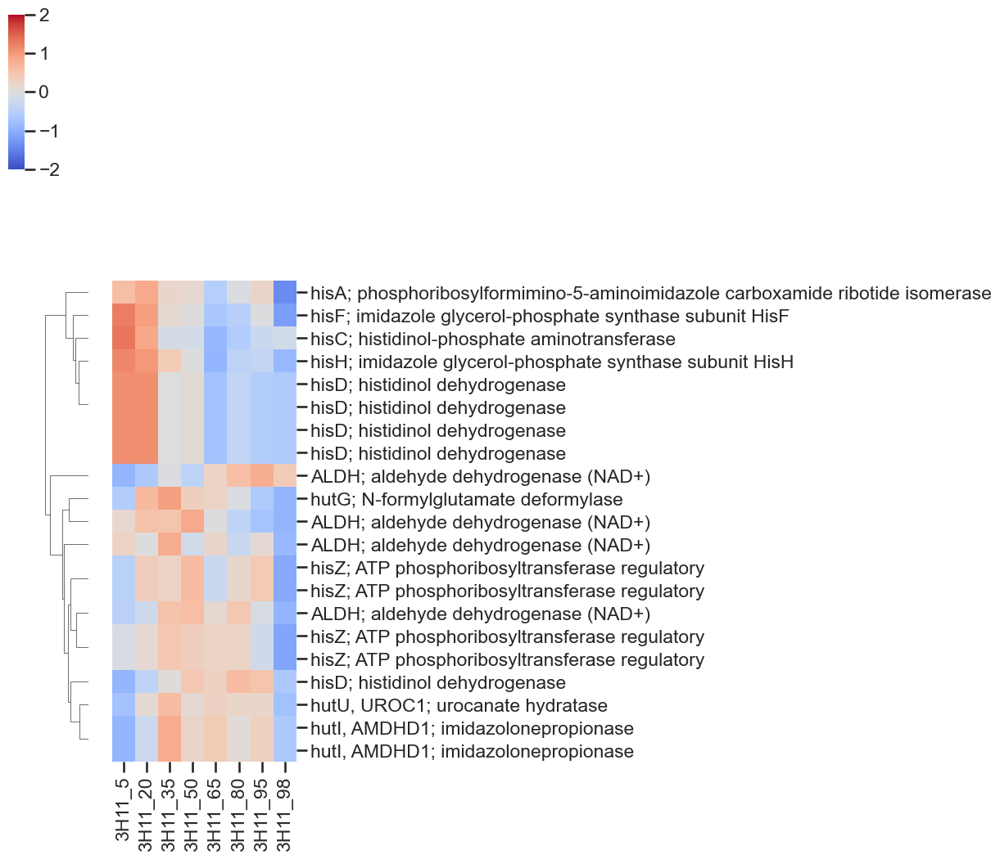

In [231]:
#3H11
cat='Histidine metabolism'
kos=kegg[kegg.subpathway==cat]['enzyme KO'].values
index=[]
genes=[]
enzymes={}
res=pd.DataFrame()
for ko in kos:
    idx=annot_3h11['KEGG KO'].dropna()[annot_3h11['KEGG KO'].dropna().str.contains(ko)].index
    query=annot_3h11.loc[idx].Query.values
    enzyme=';'.join(pd.unique(kegg[kegg['enzyme KO']==ko].enzyme.values))
    for gene in query:
        genes.append(gene)
        idx=gene.split('GW101-3H11_')[1]
        vals=h11_zvals2[h11_zvals2.index.str.contains(idx)]
        if len(vals)==0:
            continue
        index=[]
        for i in vals.index:
            if idx in i.split('|'):
                enzymes[i]=enzyme
                index.append(i)
        res=pd.concat([res,vals.loc[index,:]])
        
res=res.groupby(level=0,axis=1).mean().loc[:,['3H11_5', '3H11_20', '3H11_35', '3H11_50', '3H11_65', '3H11_80','3H11_95', '3H11_98']]
#res=res[['1mM', '2mM','4mM', '8mM', '10mM','20mM', '40mM']]
print('Found %s KOS, %s enzymes %s proteins'%(len(pd.unique(kos)),len(genes),len(res)))
colors=sns.color_palette('tab20')

res.index=res.index.map(enzymes)
g=sns.clustermap(res,cmap='coolwarm',figsize=(4,0.5*len(res)),vmin=-2,vmax=2,yticklabels=1,col_cluster=False)
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')
#plt.savefig('3H11-Nitrate-Proteomics-Signal-transduction-heatmap.pdf',bbox_inches='tight')


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


(-2.5, 2.5)

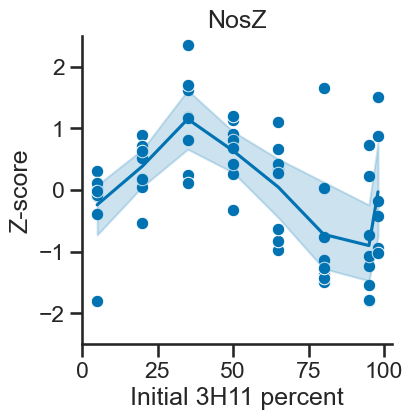

In [235]:
df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_1394')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df=df[df.condition!='3H11_T0']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
plt.figure(figsize=(4,4))
sns.scatterplot(x='ratio',y='zval',data=df)
sns.lineplot(x='ratio',y='zval',data=df)
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NosZ')
plt.xlabel('Initial 3H11 percent')
plt.xticks([0,25,50,75,100])
plt.ylim(-2.5,2.5)
#plt.savefig('3H11-nosZ-3H11-percent.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


(-2.5, 2.5)

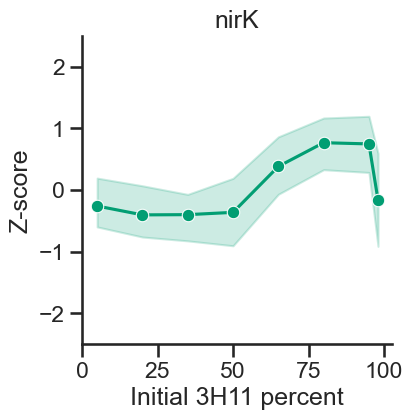

In [233]:
df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_3383')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df=df[df.condition!='3H11_T0']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
plt.figure(figsize=(4,4))
#sns.scatterplot(x='ratio',y='zval',data=df,color='g')
sns.lineplot(x='ratio',y='zval',data=df,color='g',marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('nirK')
plt.xlabel('Initial 3H11 percent')
plt.xticks([0,25,50,75,100])
plt.ylim(-2.5,2.5)
#plt.savefig('3H11-nosZ-3H11-percent.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'log$_{10}$ Nitrate (mM)')

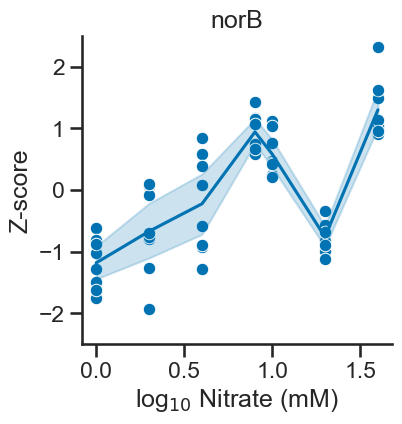

In [237]:
df=syncom_zvals[syncom_zvals.index.str.contains('contig_1_217')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['nitrate']=[int(x[:-2]) if 'mM' in x else int(0) for x in df.condition ]
df=df[df.nitrate!=0]
df['log nitrate']=np.log10(df.nitrate)
plt.figure(figsize=(4,4))
sns.scatterplot(x='log nitrate',y='zval',data=df)
sns.lineplot(x='log nitrate',y='zval',data=df)
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('3H11: norB')
plt.xlabel('log$_{10}$ Nitrate (mM)')
plt.ylim(-2.5,2.5)


#plt.xticks(rotation=90)
plt.title('norB')
plt.xlabel('log$_{10}$ Nitrate (mM)')
#plt.legend(bbox_to_anchor=(1,1))

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

(-2.5, 2.5)

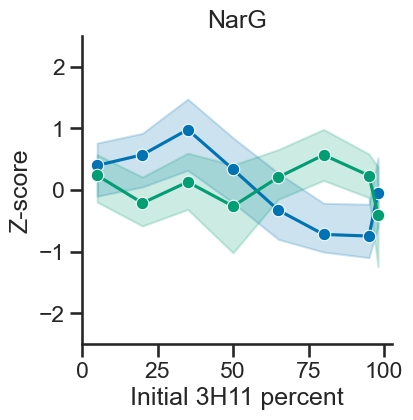

In [239]:
df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_520')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
plt.figure(figsize=(4,4))
#sns.scatterplot(x='ratio',y='zval',data=df)
sns.lineplot(x='ratio',y='zval',data=df,marker='o')
#plt.xticks(rotation=90)


df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_2872')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
#sns.scatterplot(x='ratio',y='zval',data=df,color='g')
sns.lineplot(x='ratio',y='zval',data=df,color='g',marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NarG')
plt.xlabel('Initial 3H11 percent')
plt.xticks([0,25,50,75,100])
plt.ylim(-2.5,2.5)
#plt.savefig('3H11+R12-3H11-init-protein-narG.pdf',bbox_inches='tight')

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

(-2.5, 2.5)

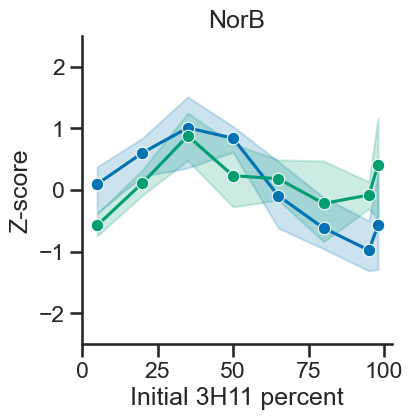

In [241]:
df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_217')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
plt.figure(figsize=(4,4))
#sns.scatterplot(x='ratio',y='zval',data=df)
sns.lineplot(x='ratio',y='zval',data=df,marker='o')
#plt.xticks(rotation=90)


df=syncom_zvals2[syncom_zvals2.index.str.contains('contig_1_2855')].iloc[0].reset_index()
df.columns=['condition','rep','zval']
df['ratio']=[int(x.split('_')[1]) for x in df.condition]
#sns.scatterplot(x='ratio',y='zval',data=df,color='g')
sns.lineplot(x='ratio',y='zval',data=df,color='g',marker='o')
#plt.xticks(rotation=90)
plt.ylabel('Z-score')
plt.xlabel('')
plt.title('NorB')
plt.xlabel('Initial 3H11 percent')
plt.xticks([0,25,50,75,100])
plt.ylim(-2.5,2.5)
#plt.savefig('3H11+R12-3H11-init-protein-norB.pdf',bbox_inches='tight')

In [261]:
n2o_corrs=[]
n2o_pvals=[]
n2o_genes=[]
zvals=syncom_zvals2.copy()
idx=[]
for i in n2o.index:
    idx.append(('%s_%s'%(n2o.loc[i,'condition'].split()[1],n2o.loc[i,'condition'].split()[0][:-1]),'R%s'%n2o.loc[i,'rep']))
n2o_tmp=n2o.copy()
n2o_tmp.index=pd.MultiIndex.from_tuples(idx)
for i in tqdm(zvals.index):
    df=zvals.loc[i,['3H11_5', '3H11_20', '3H11_35', '3H11_50', '3H11_65', '3H11_80','3H11_95', '3H11_98']].reset_index()
    df.columns=['condition','rep','zval']
    df['n2o']=n2o_tmp.loc[[tuple(df.loc[i,['condition','rep']].values) for i in df.index],'Nitrous Oxide'].values
    linres=linregress(df['n2o'],df['zval'])
    n2o_corrs.append(linres.rvalue)
    n2o_pvals.append(linres.pvalue)
    n2o_genes.append(i)
rej, pval_corr = multipletests(n2o_pvals, method='fdr_bh',alpha=0.01)[:2]
n2o_hits2=np.array(n2o_genes)
n2o_hits2=n2o_hits2[rej]
n2o_pval_hits2=pval_corr[rej]
n2o_syncom_hits2=syncom_zvals2.loc[n2o_hits2]
n2o_rvals2=np.array(n2o_corrs)[rej]
n2o_syncom_hits2=n2o_syncom_hits2[abs(n2o_rvals2)>=0.5]
n2o_syncom_hits2

100%|████████████████████████████████████████| 2335/2335 [00:12<00:00, 185.51it/s]


3H11_5                                \
                                    R1        R2        R3        R4   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1033  0.410634 -0.133214  0.124695  0.824395   
JGI|GW101-3H11|contig_1_1049  0.667875  0.490288 -0.095125 -0.084397   
JGI|GW101-3H11|contig_1_1054  0.999413  0.910014  0.379201  0.733578   
JGI|GW101-3H11|contig_1_1075  1.234766  1.126276  1.099729  1.827534   
JGI|GW101-3H11|contig_1_1076  2.251375  1.655596  1.496083  0.971057   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_353    0.231654  0.145401  0.284565  0.371383   
JGI|FW510-R12|contig_1_54    -0.819643 -0.578168 -0.057953 -0.760177   
JGI|FW510-R12|contig_1_818    0.401599 -1.442590  0.826459 -1.594638   
JGI|FW510-R12|contig_1_828   -0.573277 -0.551744 -0.039388 -0.211108   
JGI|FW510-R12|contig_1_964    1.586905  1.849432  1.945884  2.003477   

                                                                      \
                                    R5        R6        R7        R8   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1033  1.118588 -0.628285 -0.971943  0.630616   
JGI|GW101-3H11|contig_1_1049 -0.060816 -0.316557 -0.781430  0.404933   
JGI|GW101-3H11|contig_1_1054  0.639408  0.672136 -1.112497  0.564457   
JGI|GW101-3H11|contig_1_1075  2.017104  1.699576 -1.217043  0.995114   
JGI|GW101-3H11|contig_1_1076  1.451625  1.225817 -0.622503  0.848687   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_353    0.161894  0.402142  1.630454  0.228785   
JGI|FW510-R12|contig_1_54    -0.468712 -0.159638  1.877784 -0.632365   
JGI|FW510-R12|contig_1_818    0.286700  0.159698  0.241311 -1.323490   
JGI|FW510-R12|contig_1_828   -0.488693 -0.561042  1.748296 -0.114991   
JGI|FW510-R12|contig_1_964    1.824031  1.700840  0.246710  0.800224   

                               3H11_20            ...   3H11_95            \
                                    R1        R2  ...        R5        R6   
Protein.Ids                                       ...                       
JGI|GW101-3H11|contig_1_1033  0.458894  0.567160  ... -0.450202  0.160518   
JGI|GW101-3H11|contig_1_1049  0.720461  0.471400  ... -0.269196 -0.225141   
JGI|GW101-3H11|contig_1_1054  1.052325  1.256658  ... -0.382484 -1.275647   
JGI|GW101-3H11|contig_1_1075  1.022647  1.856513  ... -1.038983 -1.205096   
JGI|GW101-3H11|contig_1_1076  0.757294  1.312408  ... -1.181473 -0.654271   
...                                ...       ...  ...       ...       ...   
JGI|FW510-R12|contig_1_353   -0.023488 -0.133654  ...  1.845878  0.793891   
JGI|FW510-R12|contig_1_54    -0.778707 -0.151505  ...  2.215163  0.529518   
JGI|FW510-R12|contig_1_818   -1.739085 -1.234386  ...  1.347794  0.838523   
JGI|FW510-R12|contig_1_828    0.095897 -0.210859  ...  1.872983  0.454204   
JGI|FW510-R12|contig_1_964    1.052449  1.577990  ... -0.893484 -0.750494   

                                                   3H11_98            \
                                    R7        R8        R2        R3   
Protein.Ids                                                            
JGI|GW101-3H11|contig_1_1033  0.128395  0.245375  0.339708 -0.417281   
JGI|GW101-3H11|contig_1_1049  0.447123  0.150281  0.232239 -0.142837   
JGI|GW101-3H11|contig_1_1054  0.298376 -0.363177  0.413871  0.007121   
JGI|GW101-3H11|contig_1_1075  1.890331 -1.299412 -0.887759 -1.040805   
JGI|GW101-3H11|contig_1_1076  1.316105 -0.013170 -1.133762 -1.141950   
...                                ...       ...       ...       ...   
JGI|FW510-R12|contig_1_353    0.406382  1.036923 -0.799051 -0.275992   
JGI|FW510-R12|contig_1_54     0.404378  0.805430 -0.424433 -0.301090   
JGI|FW510-R12|contig_1_818    1.016539  1.031462  0.595969  0.785328   
JGI|FW510-R12|contig_1_828   -0.191487  1.024991 -0.093776 -0.382117   

In [263]:
n2o_corr_res2=pd.DataFrame(n2o_corrs)
n2o_corr_res2.columns=['r']
n2o_corr_res2.index=syncom_zvals2.index
n2o_corr_res2['contig']=[i.split('|')[2] for i in n2o_corr_res2.index]
n2o_corr_res2['org']=[i.split('|')[1] for i in n2o_corr_res2.index]

paths=[]
for i in n2o_corr_res2.index:
    gene=n2o_corr_res2.loc[i,'org']+'_'+n2o_corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].pathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res2['pathway']=paths

paths=[]
for i in n2o_corr_res2.index:
    gene=n2o_corr_res2.loc[i,'org']+'_'+n2o_corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].subpathway.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res2['subpathway']=paths

paths=[]
for i in n2o_corr_res2.index:
    gene=n2o_corr_res2.loc[i,'org']+'_'+n2o_corr_res2.loc[i,'contig']
    if gene in list(annot_3h11.Query.values):
        df=annot_3h11[annot_3h11.Query==gene]
    else:
        df=annot_r12[annot_r12.Query==gene]
    if 'ko' in str(df['KEGG KO']):
        ko=df['KEGG KO'].values[0].split(',')[0][3:]
        path=kegg[kegg['enzyme KO']==ko].enzyme.values
        if len(path)==0:
            path='Unclassified'
        else:
            path=path[0]
    else:
        path='Unclassified'
    if type(path)!= str or 'Unclassified' in path:
        path='Unclassified'
    paths.append(path)
n2o_corr_res2['enzyme']=paths
n2o_corr_res2['pvals']=pval_corr
n2o_corr_res2

,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|GW101-3H11|contig_1_1,-0.250805,contig_1_1,GW101-3H11,Signal transduction,Two-component system,dnaA; chromosomal replication initiator,0.144373
JGI|GW101-3H11|contig_1_1002,-0.128894,contig_1_1002,GW101-3H11,"Folding, sorting and degradation",RNA degradation,"groEL, HSPD1; chaperonin",0.519731
JGI|GW101-3H11|contig_1_1003,0.108578,contig_1_1003,GW101-3H11,Protein families: genetic information processing,Chaperones and folding catalysts,"groES, HSPE1; chaperonin",0.601204
JGI|GW101-3H11|contig_1_1023,-0.304529,contig_1_1023,GW101-3H11,Metabolism of cofactors and vitamins,Nicotinate and nicotinamide metabolism,nadE; NAD+ synthase,0.063096
JGI|GW101-3H11|contig_1_1024,-0.073612,contig_1_1024,GW101-3H11,Metabolism of cofactors and vitamins,Nicotinate and nicotinamide metabolism,"pncB, NAPRT1; nicotinate phosphoribosyltransfe...",0.727617
...,...,...,...,...,...,...,...
JGI|FW510-R12|contig_2_122,-0.053619,contig_2_122,FW510-R12,Unclassified,Unclassified,Unclassified,0.802215
JGI|FW510-R12|contig_2_123,0.018970,contig_2_123,FW510-R12,Unclassified,Unclassified,Unclassified,0.930684
JGI|FW510-R12|contig_2_160,-0.206778,contig_2_160,FW510-R12,Protein families: genetic information processing,Transcription factors,"parB, spo0J; ParB family transcriptional regul...",0.246779


In [265]:
p =0.05
r = 0.5
n2o_corr_res_hits2=n2o_corr_res2[(n2o_corr_res2.pvals<p)&(n2o_corr_res2.r>=r)]
n2o_corr_res_hits=n2o_corr_res[(n2o_corr_res.pvals<p)&(n2o_corr_res.r>=r)]
idx=list(set(n2o_corr_res_hits.index)&set(n2o_corr_res_hits2.index))

print(len(idx))
n2o_corr_res_hits.loc[idx]

13


,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_2715,0.866946,contig_1_2715,FW510-R12,Unclassified,Unclassified,Unclassified,1.187684e-15
JGI|FW510-R12|contig_1_3383,0.694815,contig_1_3383,FW510-R12,Energy metabolism,Nitrogen metabolism,nirK; nitrite reductase (NO-forming),3.834919e-08
JGI|FW510-R12|contig_1_1090,0.763330,contig_1_1090,FW510-R12,Carbohydrate metabolism,Glycolysis / Gluconeogenesis,ahr; alcohol/geraniol dehydrogenase (NADP+) [E...,2.082498e-10
JGI|GW101-3H11|contig_1_3020,0.588527,contig_1_3020,GW101-3H11,Carbohydrate metabolism,Butanoate metabolism,"E2.2.1.6S, ilvH, ilvN; acetolactate synthase I...",1.036354e-05
JGI|FW510-R12|contig_1_818,0.690621,contig_1_818,FW510-R12,Unclassified,Unclassified,Unclassified,4.953704e-08
JGI|FW510-R12|contig_1_828,0.858980,contig_1_828,FW510-R12,Unclassified,Unclassified,Unclassified,3.664863e-15
JGI|FW510-R12|contig_1_3382,0.666879,contig_1_3382,FW510-R12,Unclassified,Unclassified,Unclassified,2.036821e-07
JGI|FW510-R12|contig_1_2824,0.810286,contig_1_2824,FW510-R12,Unclassified,Unclassified,Unclassified,2.598646e-12
JGI|FW510-R12|contig_1_1018,0.643418,contig_1_1018,FW510-R12,Protein families: signaling and cellular proce...,Transporters,TC.FEV.OM; iron complex outermembrane recepter,7.467074e-07


In [267]:
n2o_corr_res_hits2=n2o_corr_res2[(n2o_corr_res2.pvals<p)&(n2o_corr_res2.r<=-r)]
n2o_corr_res_hits=n2o_corr_res[(n2o_corr_res.pvals<p)&(n2o_corr_res.r<=-r)]
idx=list(set(n2o_corr_res_hits.index)&set(n2o_corr_res_hits2.index))

print(len(idx))
n2o_corr_res_hits.loc[idx]

12


,r,contig,org,pathway,subpathway,enzyme,pvals
Protein.Ids,,,,,,,
JGI|FW510-R12|contig_1_964,-0.800404,contig_1_964,FW510-R12,Unclassified,Unclassified,Unclassified,7.020524e-12
JGI|GW101-3H11|contig_1_1542,-0.738175,contig_1_1542,GW101-3H11,Unclassified,Unclassified,Unclassified,1.756568e-09
JGI|GW101-3H11|contig_1_1396,-0.705343,contig_1_1396,GW101-3H11,Energy metabolism,Oxidative phosphorylation,ccoP; cytochrome c oxidase cbb3-type subunit,1.950384e-08
JGI|GW101-3H11|contig_1_3304,-0.695138,contig_1_3304,GW101-3H11,Energy metabolism,Oxidative phosphorylation,CYC; cytochrome,3.769050e-08
JGI|GW101-3H11|contig_1_523,-0.851400,contig_1_523,GW101-3H11,Energy metabolism,Nitrogen metabolism,"narG, narZ, nxrA; nitrate reductase / nitrite ...",1.190695e-14
JGI|GW101-3H11|contig_1_1393,-0.688020,contig_1_1393,GW101-3H11,Protein families: genetic information processing,Transcription factors,nosR; NosR/NirI family transcriptional regulat...,5.796813e-08
JGI|GW101-3H11|contig_1_519,-0.830413,contig_1_519,GW101-3H11,Energy metabolism,Nitrogen metabolism,"NRT, narK, nrtP, nasA; MFS transporter, NNP fa...",2.115397e-13
JGI|FW510-R12|contig_1_2617,-0.688526,contig_1_2617,FW510-R12,Unclassified,Enzymes with EC,icmF; isobutyryl-CoA mutase,5.658250e-08
JGI|GW101-3H11|contig_1_520,-0.873621,contig_1_520,GW101-3H11,Energy metabolism,Nitrogen metabolism,"narG, narZ, nxrA; nitrate reductase / nitrite ...",4.043820e-16


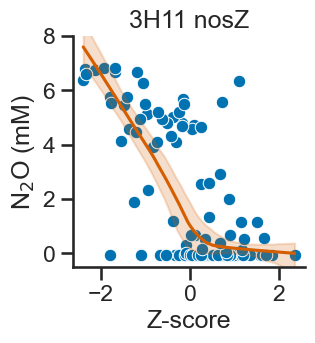

In [271]:
slope=0.02059220973240205
intercept=-0.05817653391874167

g='JGI|GW101-3H11|contig_1_1394'
name='3H11 nosZ'
x1=syncom_zvals.loc[g]
y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide']

x2=syncom_zvals2.loc['JGI|GW101-3H11|contig_1_1394']
y2=n2o_tmp.loc[x2.index,'Nitrous Oxide']

x=np.array(list(x1.values)+list(x2.values))
y=np.array(list(y1.values)+list(y2.values))
y=y*slope+intercept

plt.figure(figsize=(3,3))
plt.xlabel('Z-score')
plt.ylabel('N$_2$O (mM)')
plt.title(name)
sns.scatterplot(x=x,y=y)
plt.ylim(-.5,8)

eval_x = np.linspace(min(x),max(x),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x, y, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.95)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)

#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)
#plt.savefig('3H11-nosZ-vs-n2o.pdf',bbox_inches='tight')
#plt.savefig('3H11-nosZ-vs-n2o.png',bbox_inches='tight',dpi=250)

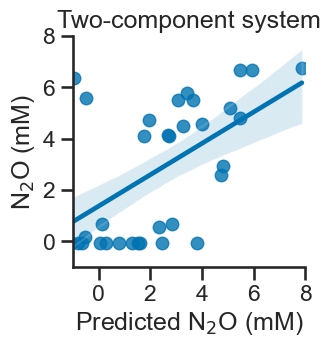

<Figure size 640x480 with 0 Axes>

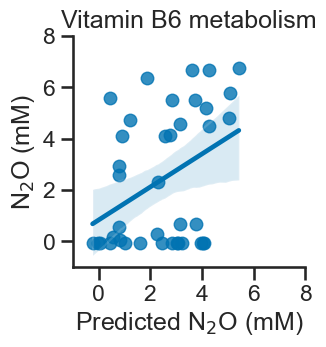

<Figure size 640x480 with 0 Axes>

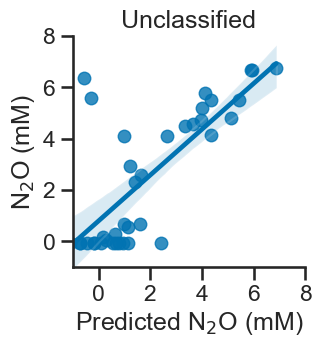

<Figure size 640x480 with 0 Axes>

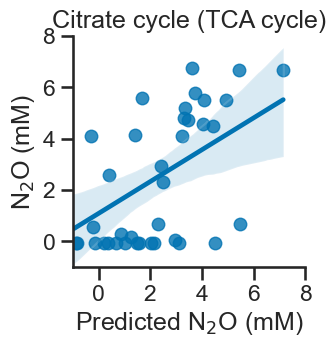

<Figure size 640x480 with 0 Axes>

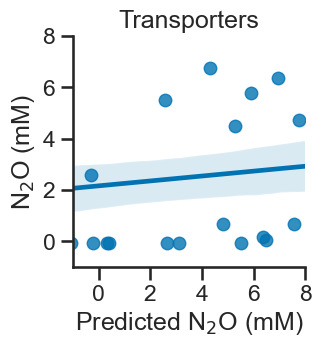

<Figure size 640x480 with 0 Axes>

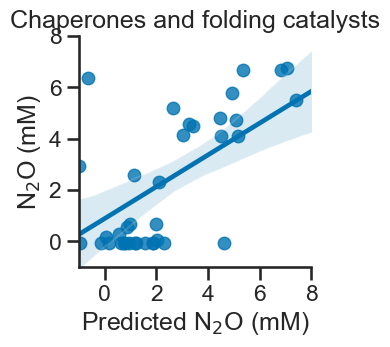

<Figure size 640x480 with 0 Axes>

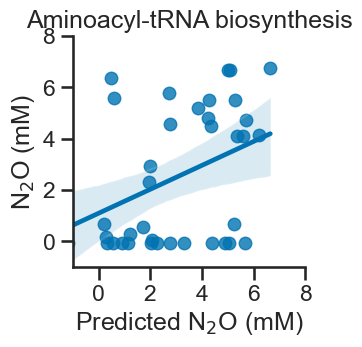

<Figure size 640x480 with 0 Axes>

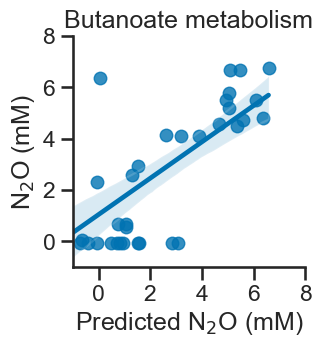

<Figure size 640x480 with 0 Axes>

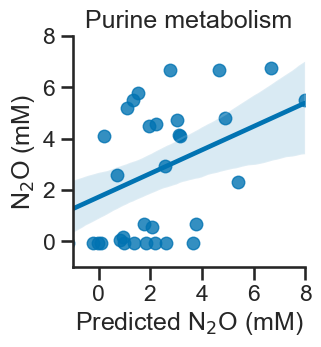

<Figure size 640x480 with 0 Axes>

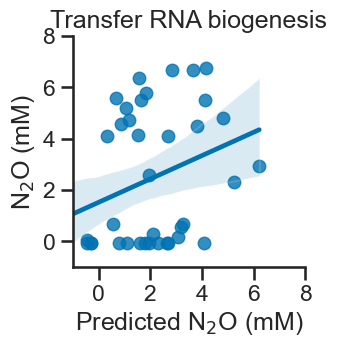

<Figure size 640x480 with 0 Axes>

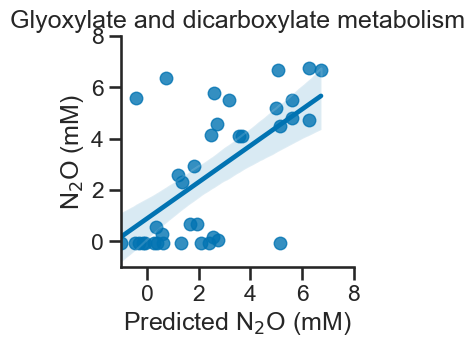

<Figure size 640x480 with 0 Axes>

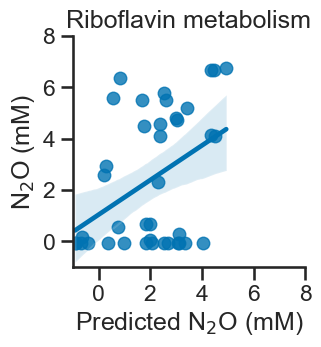

<Figure size 640x480 with 0 Axes>

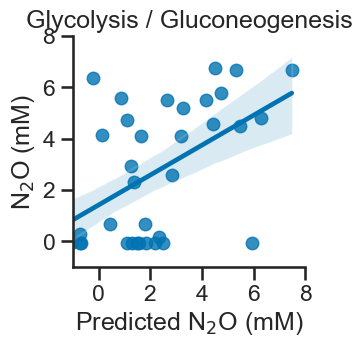

<Figure size 640x480 with 0 Axes>

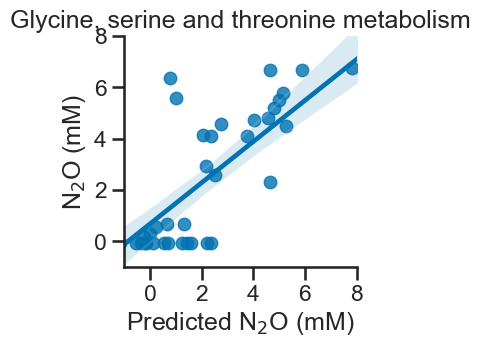

<Figure size 640x480 with 0 Axes>

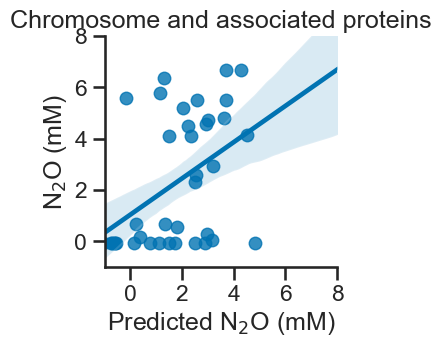

<Figure size 640x480 with 0 Axes>

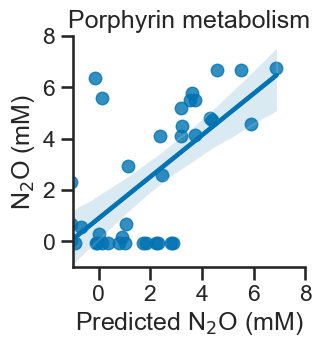

<Figure size 640x480 with 0 Axes>

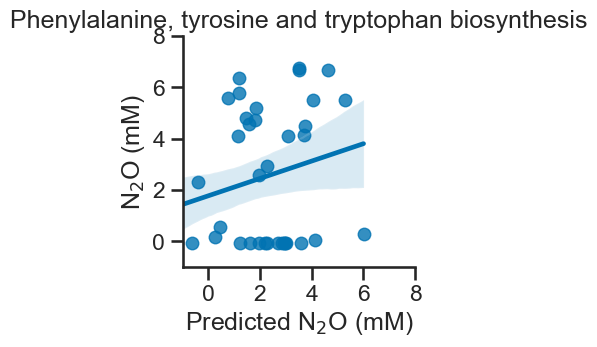

<Figure size 640x480 with 0 Axes>

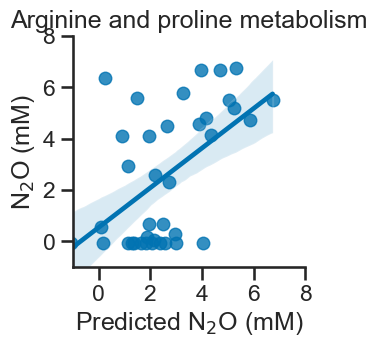

<Figure size 640x480 with 0 Axes>

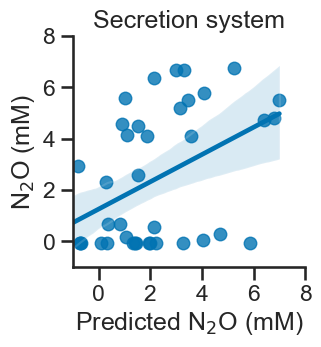

<Figure size 640x480 with 0 Axes>

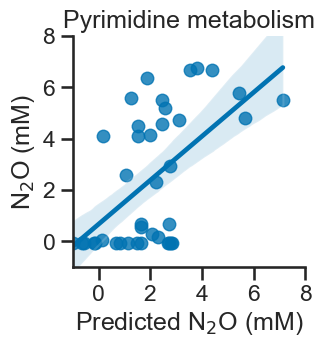

<Figure size 640x480 with 0 Axes>

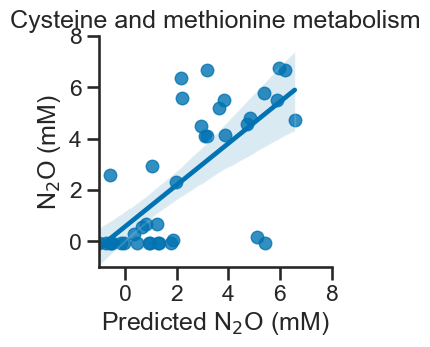

<Figure size 640x480 with 0 Axes>

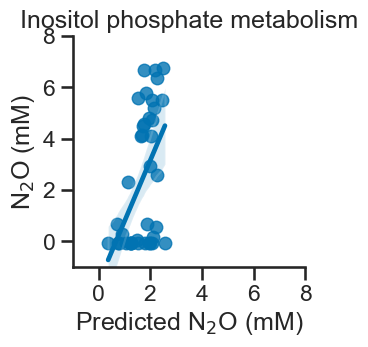

<Figure size 640x480 with 0 Axes>

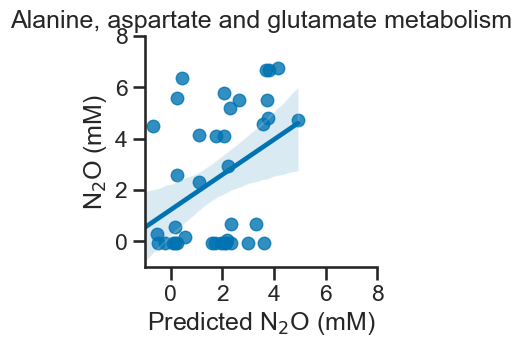

<Figure size 640x480 with 0 Axes>

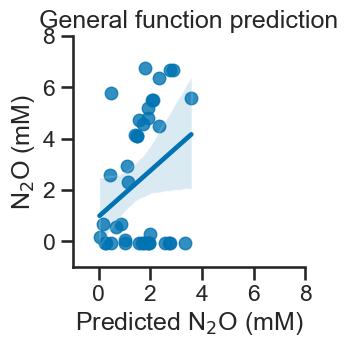

<Figure size 640x480 with 0 Axes>

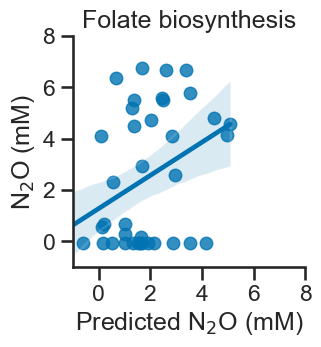

<Figure size 640x480 with 0 Axes>

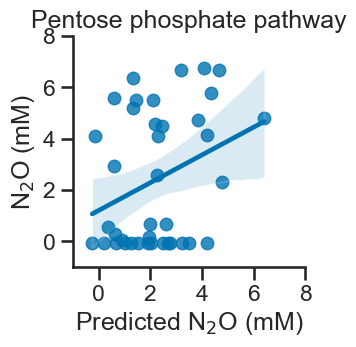

<Figure size 640x480 with 0 Axes>

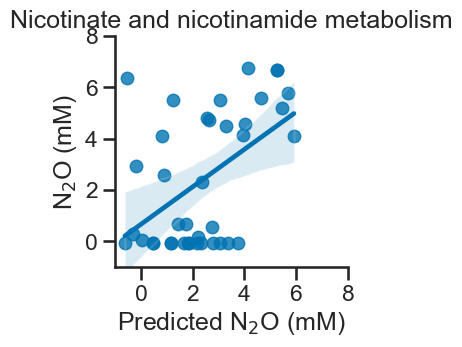

<Figure size 640x480 with 0 Axes>

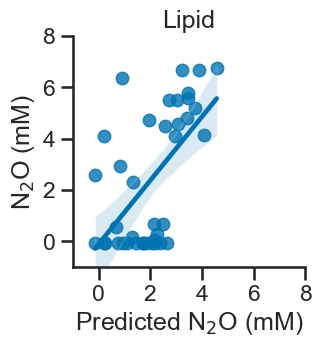

<Figure size 640x480 with 0 Axes>

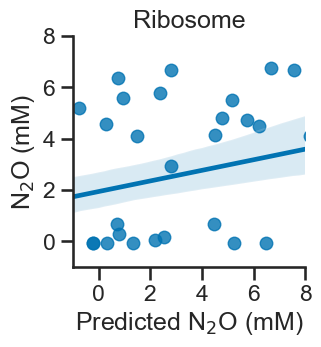

<Figure size 640x480 with 0 Axes>

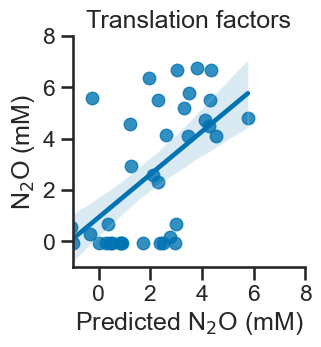

<Figure size 640x480 with 0 Axes>

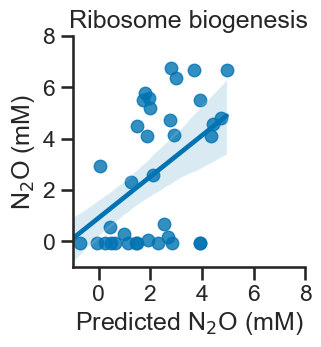

<Figure size 640x480 with 0 Axes>

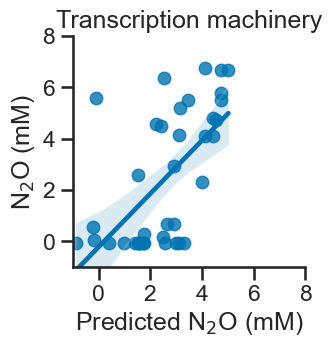

<Figure size 640x480 with 0 Axes>

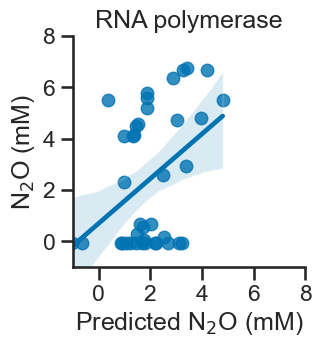

<Figure size 640x480 with 0 Axes>

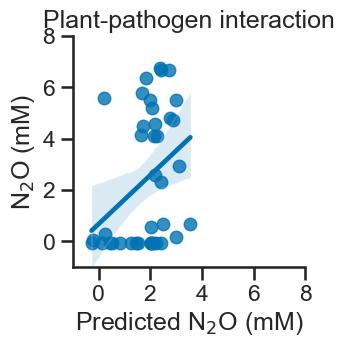

<Figure size 640x480 with 0 Axes>

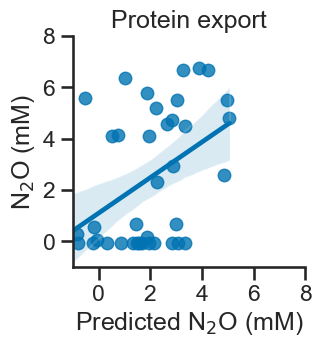

<Figure size 640x480 with 0 Axes>

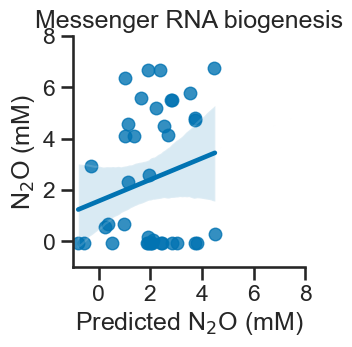

<Figure size 640x480 with 0 Axes>

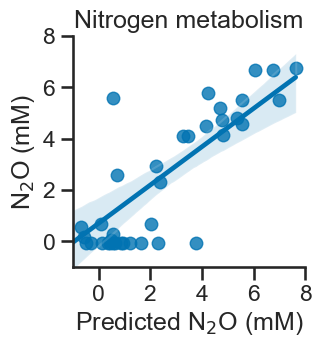

<Figure size 640x480 with 0 Axes>

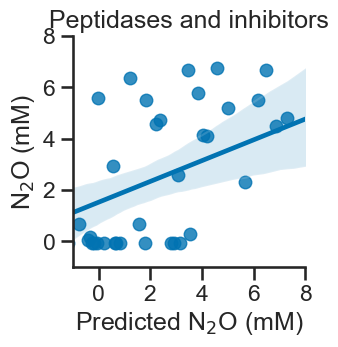

<Figure size 640x480 with 0 Axes>

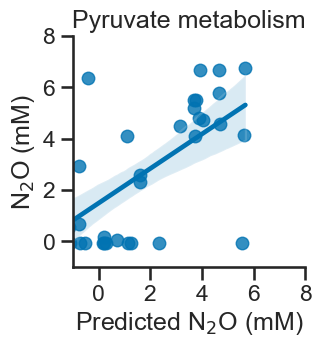

<Figure size 640x480 with 0 Axes>

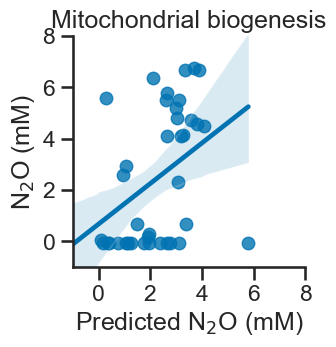

<Figure size 640x480 with 0 Axes>

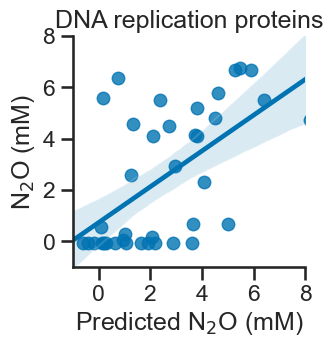

<Figure size 640x480 with 0 Axes>

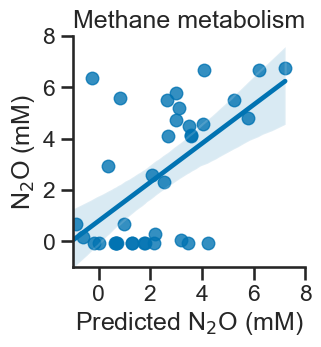

<Figure size 640x480 with 0 Axes>

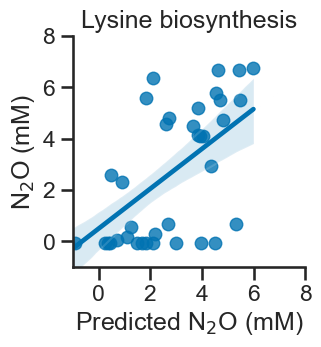

<Figure size 640x480 with 0 Axes>

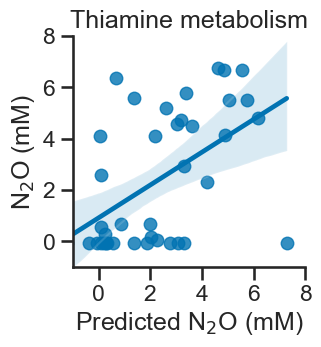

<Figure size 640x480 with 0 Axes>

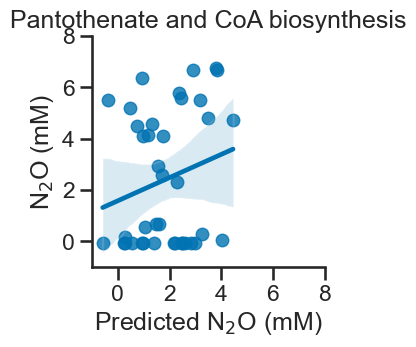

<Figure size 640x480 with 0 Axes>

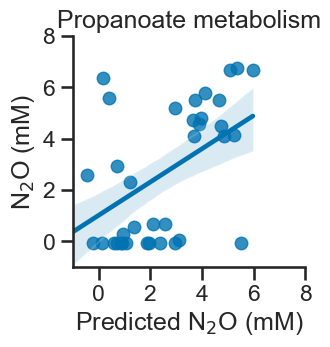

<Figure size 640x480 with 0 Axes>

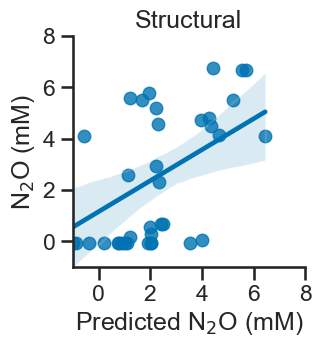

<Figure size 640x480 with 0 Axes>

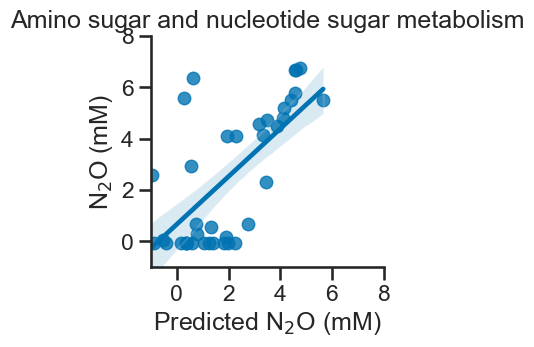

<Figure size 640x480 with 0 Axes>

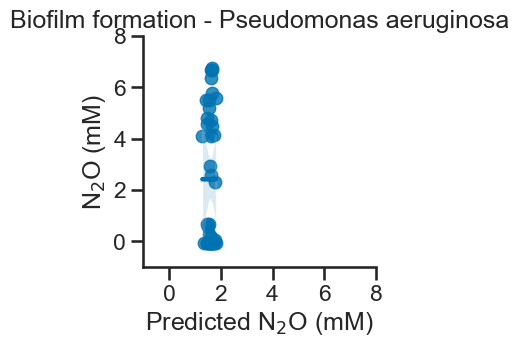

<Figure size 640x480 with 0 Axes>

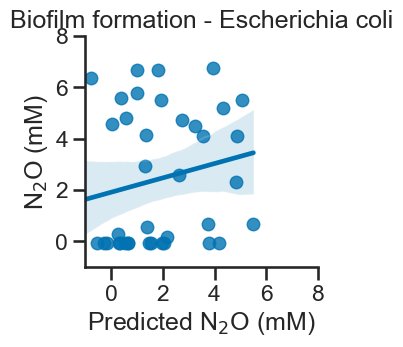

<Figure size 640x480 with 0 Axes>

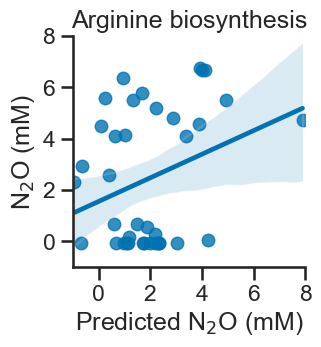

<Figure size 640x480 with 0 Axes>

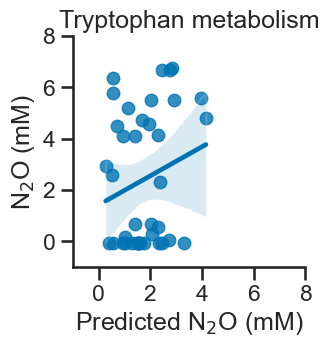

<Figure size 640x480 with 0 Axes>

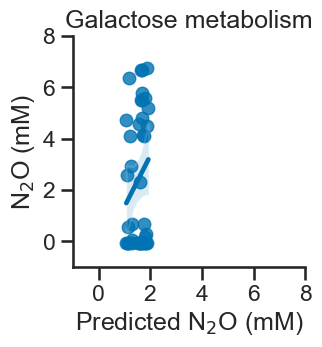

<Figure size 640x480 with 0 Axes>

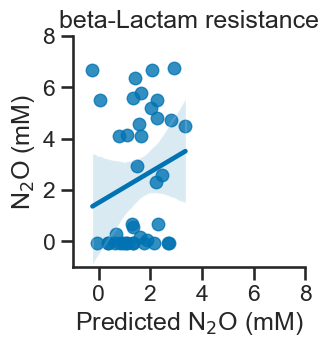

<Figure size 640x480 with 0 Axes>

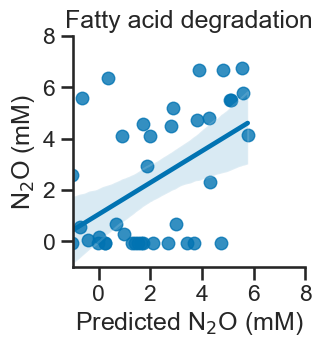

<Figure size 640x480 with 0 Axes>

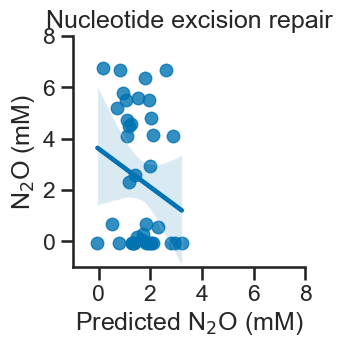

<Figure size 640x480 with 0 Axes>

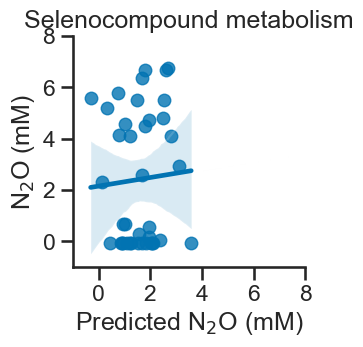

<Figure size 640x480 with 0 Axes>

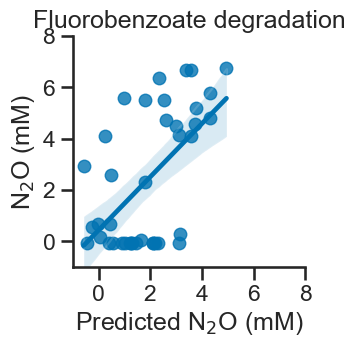

<Figure size 640x480 with 0 Axes>

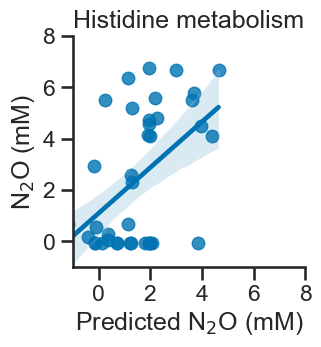

<Figure size 640x480 with 0 Axes>

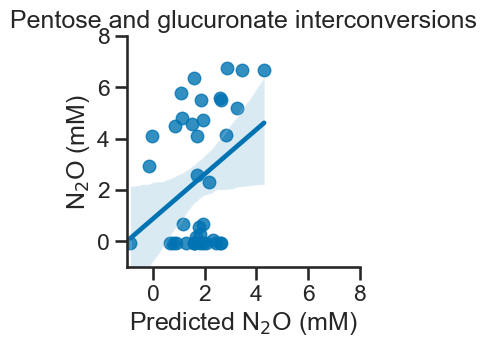

<Figure size 640x480 with 0 Axes>

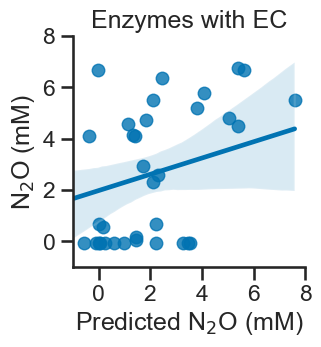

<Figure size 640x480 with 0 Axes>

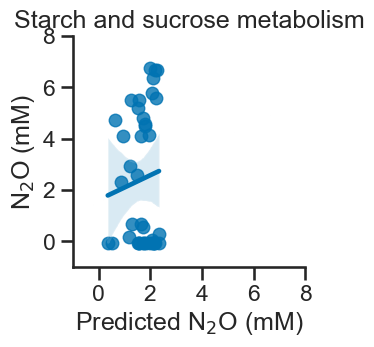

<Figure size 640x480 with 0 Axes>

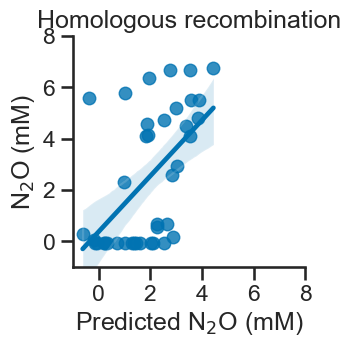

<Figure size 640x480 with 0 Axes>

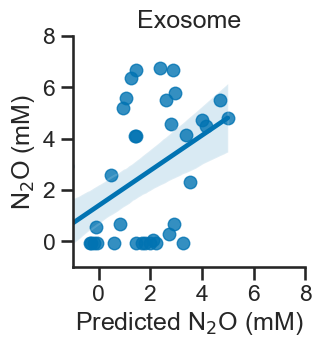

<Figure size 640x480 with 0 Axes>

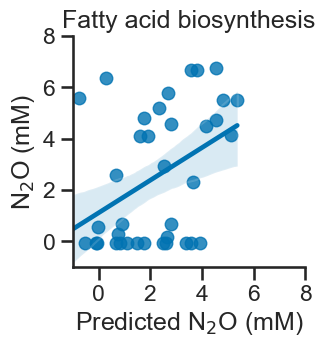

<Figure size 640x480 with 0 Axes>

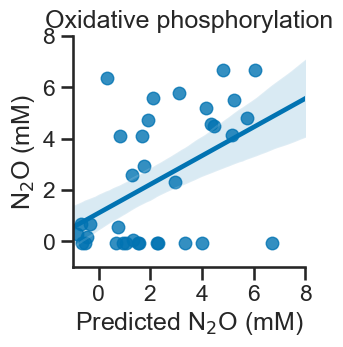

<Figure size 640x480 with 0 Axes>

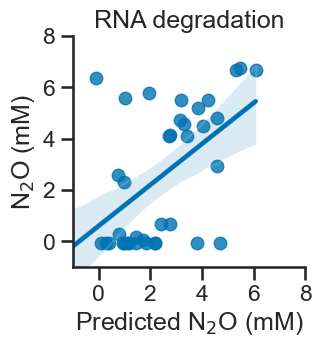

<Figure size 640x480 with 0 Axes>

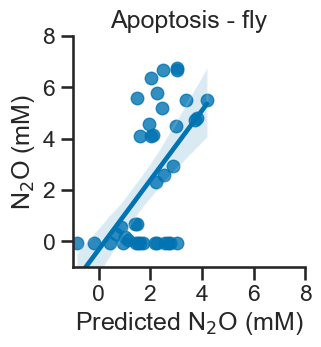

<Figure size 640x480 with 0 Axes>

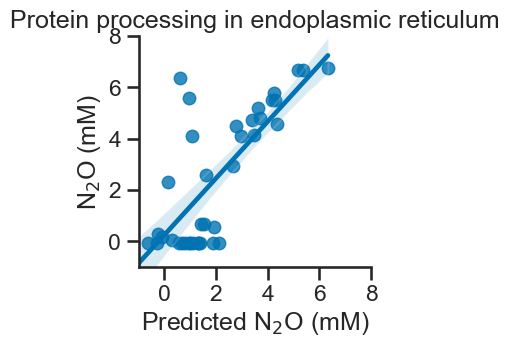

<Figure size 640x480 with 0 Axes>

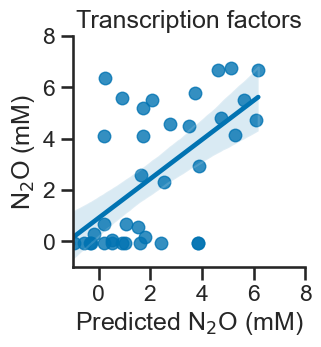

<Figure size 640x480 with 0 Axes>

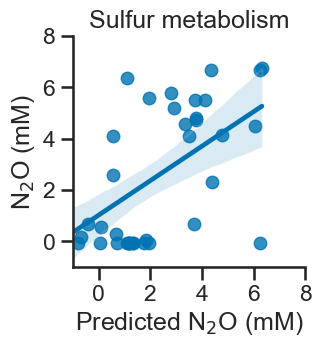

<Figure size 640x480 with 0 Axes>

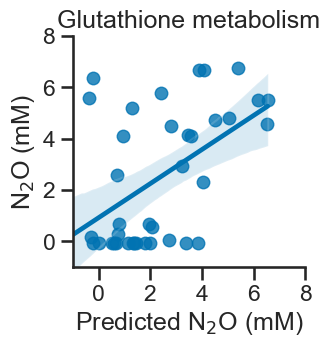

<Figure size 640x480 with 0 Axes>

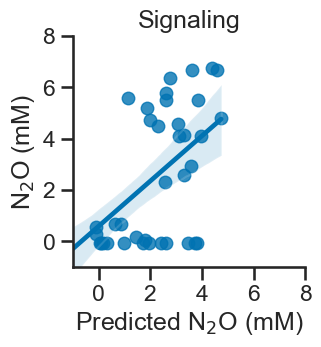

<Figure size 640x480 with 0 Axes>

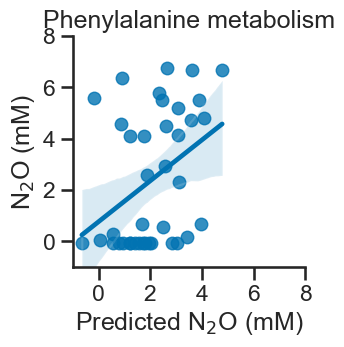

<Figure size 640x480 with 0 Axes>

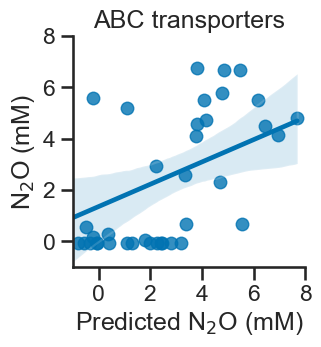

<Figure size 640x480 with 0 Axes>

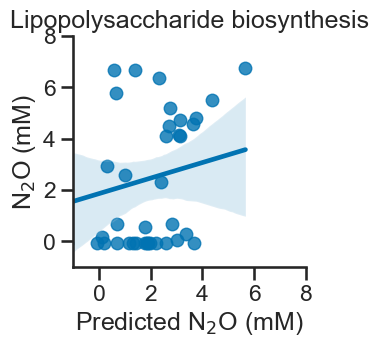

<Figure size 640x480 with 0 Axes>

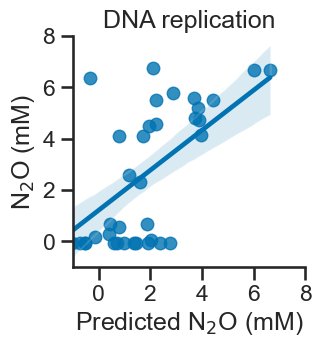

<Figure size 640x480 with 0 Axes>

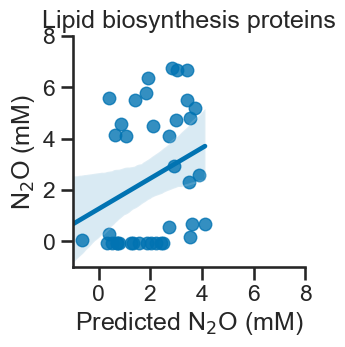

<Figure size 640x480 with 0 Axes>

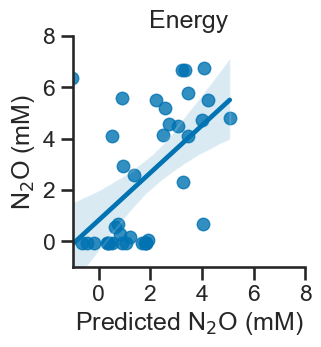

<Figure size 640x480 with 0 Axes>

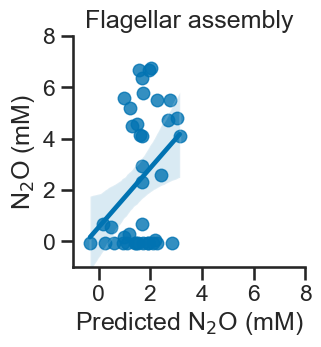

<Figure size 640x480 with 0 Axes>

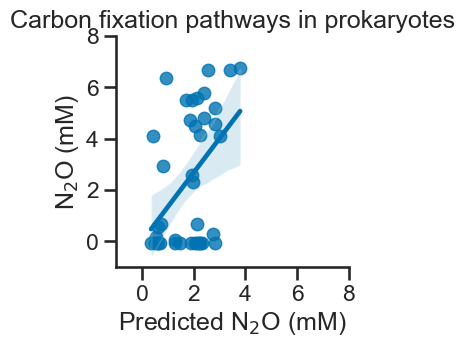

<Figure size 640x480 with 0 Axes>

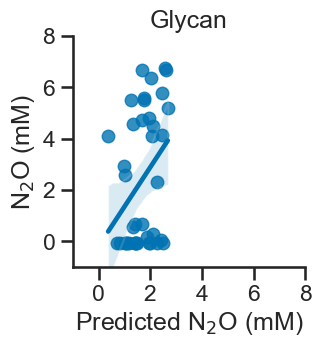

<Figure size 640x480 with 0 Axes>

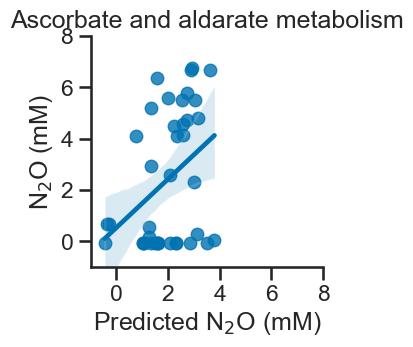

<Figure size 640x480 with 0 Axes>

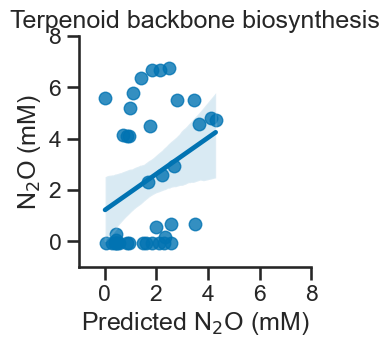

<Figure size 640x480 with 0 Axes>

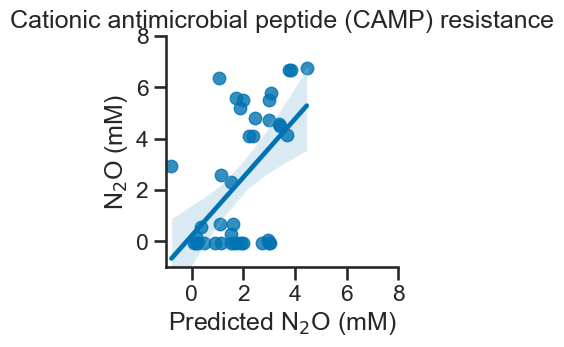

<Figure size 640x480 with 0 Axes>

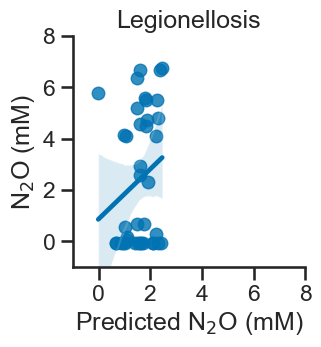

<Figure size 640x480 with 0 Axes>

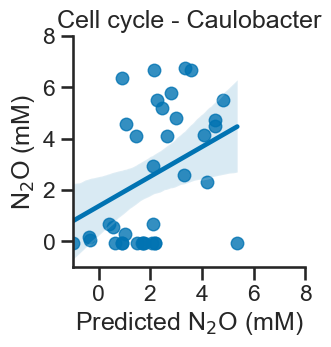

<Figure size 640x480 with 0 Axes>

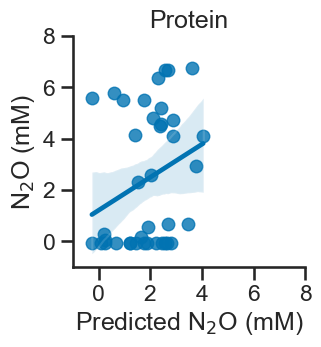

<Figure size 640x480 with 0 Axes>

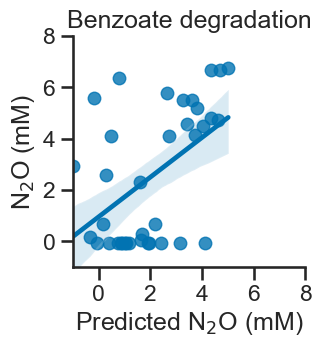

<Figure size 640x480 with 0 Axes>

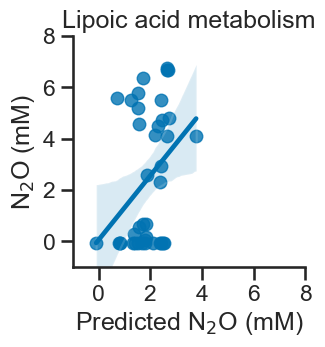

<Figure size 640x480 with 0 Axes>

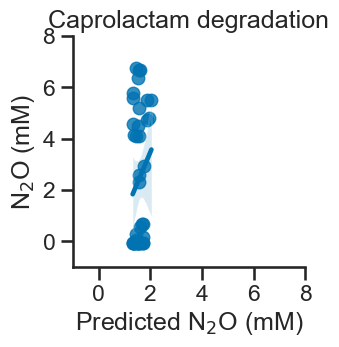

<Figure size 640x480 with 0 Axes>

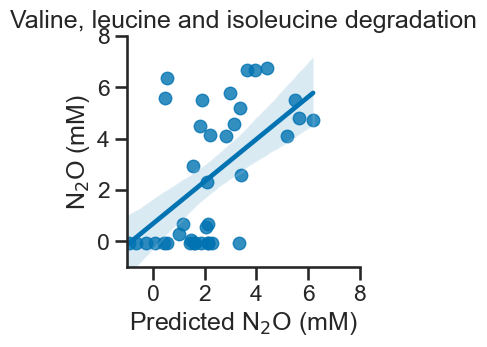

<Figure size 640x480 with 0 Axes>

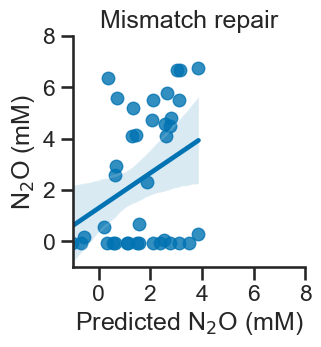

<Figure size 640x480 with 0 Axes>

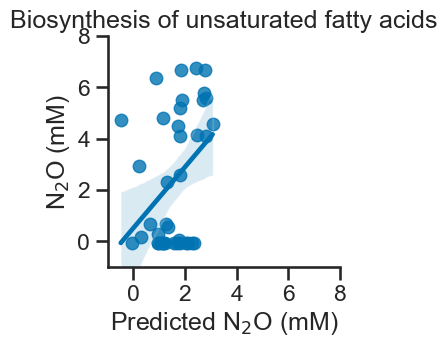

<Figure size 640x480 with 0 Axes>

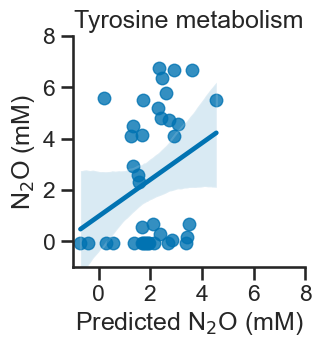

<Figure size 640x480 with 0 Axes>

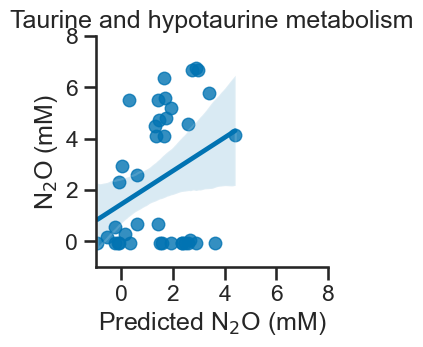

<Figure size 640x480 with 0 Axes>

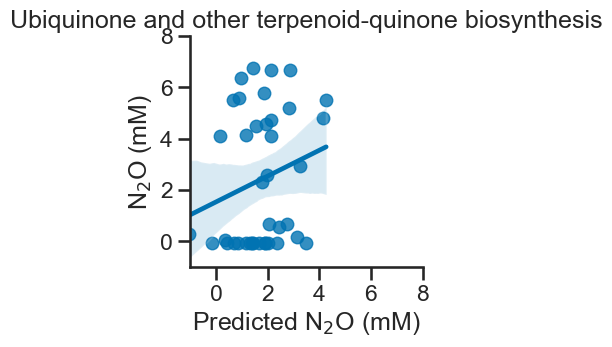

<Figure size 640x480 with 0 Axes>

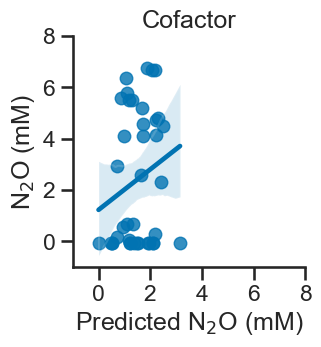

<Figure size 640x480 with 0 Axes>

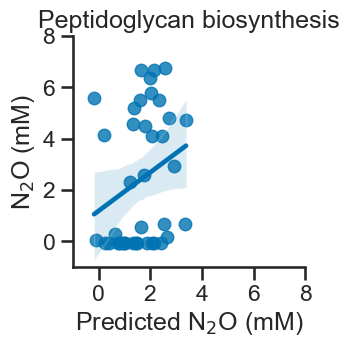

<Figure size 640x480 with 0 Axes>

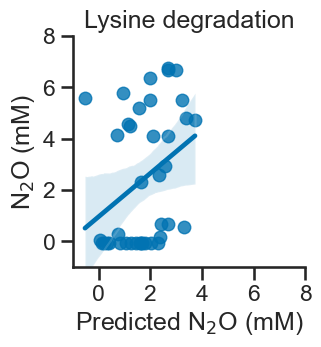

<Figure size 640x480 with 0 Axes>

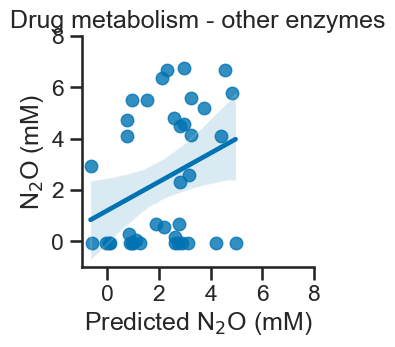

<Figure size 640x480 with 0 Axes>

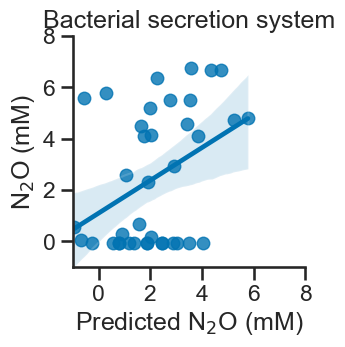

<Figure size 640x480 with 0 Axes>

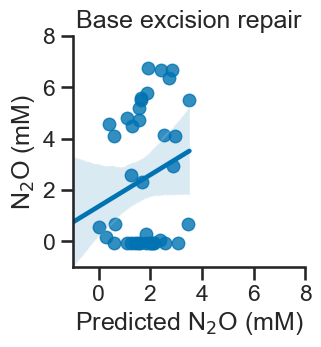

<Figure size 640x480 with 0 Axes>

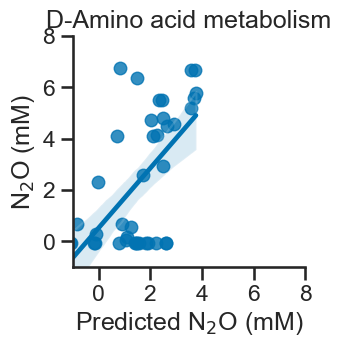

<Figure size 640x480 with 0 Axes>

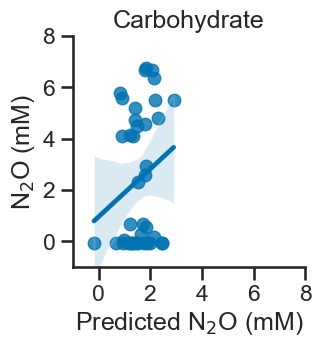

<Figure size 640x480 with 0 Axes>

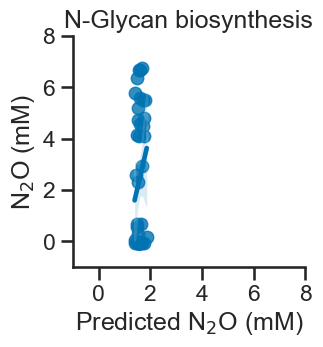

<Figure size 640x480 with 0 Axes>

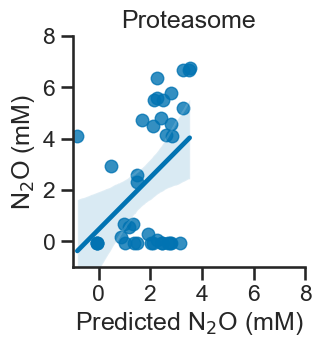

<Figure size 640x480 with 0 Axes>

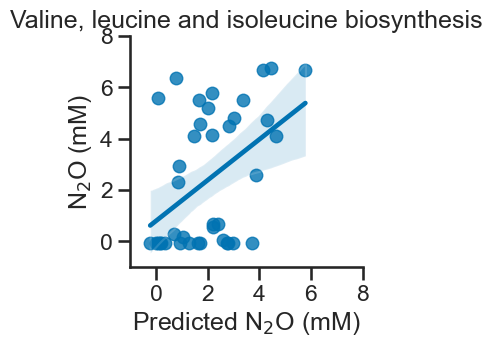

<Figure size 640x480 with 0 Axes>

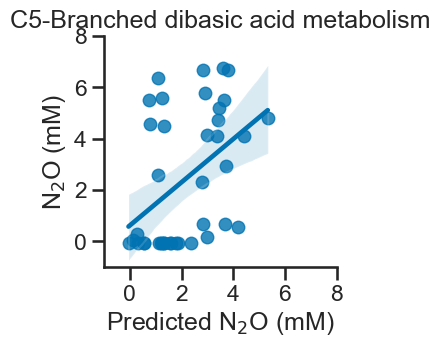

<Figure size 640x480 with 0 Axes>

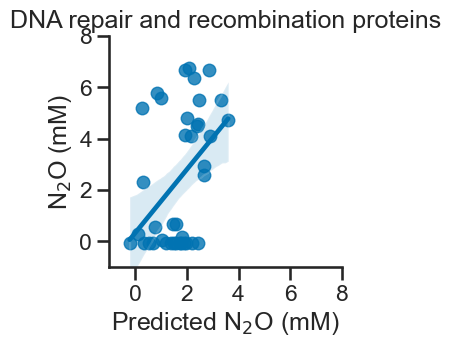

<Figure size 640x480 with 0 Axes>

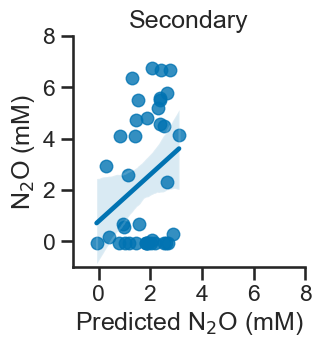

<Figure size 640x480 with 0 Axes>

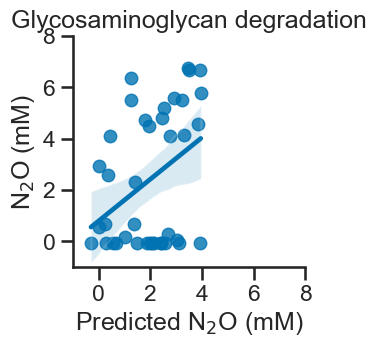

<Figure size 640x480 with 0 Axes>

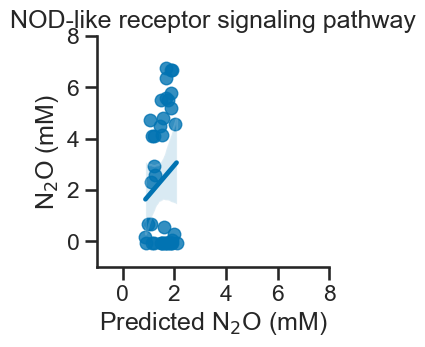

<Figure size 640x480 with 0 Axes>

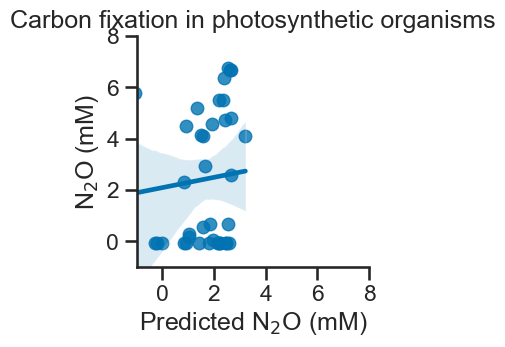

<Figure size 640x480 with 0 Axes>

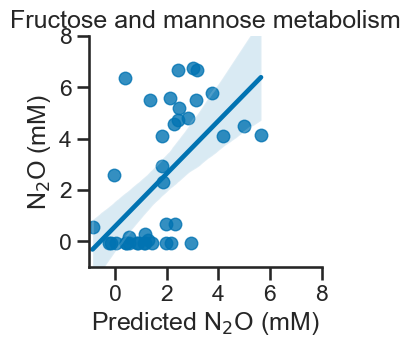

<Figure size 640x480 with 0 Axes>

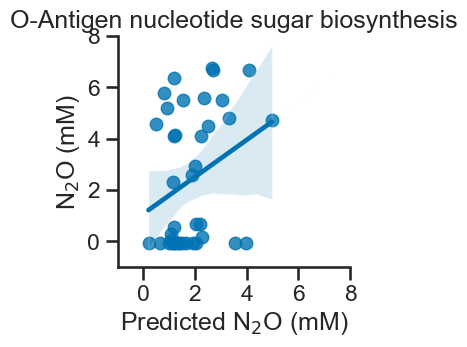

<Figure size 640x480 with 0 Axes>

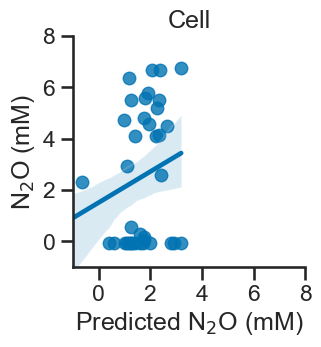

<Figure size 640x480 with 0 Axes>

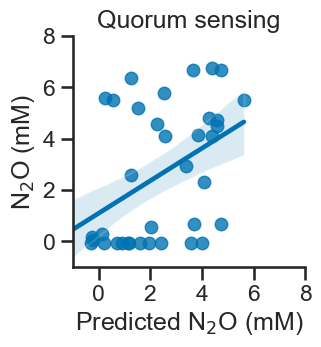

<Figure size 640x480 with 0 Axes>

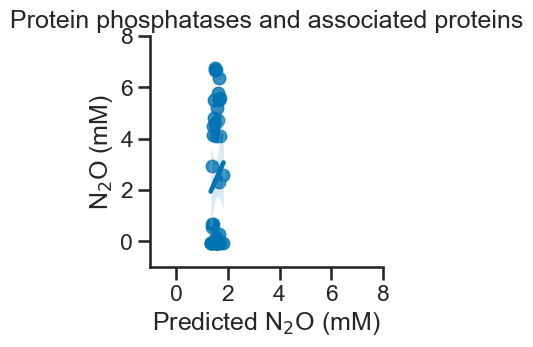

<Figure size 640x480 with 0 Axes>

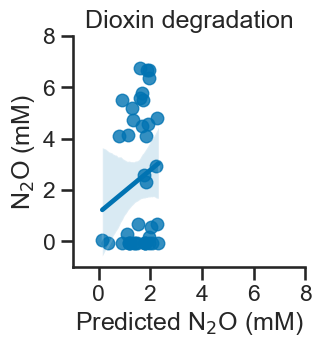

<Figure size 640x480 with 0 Axes>

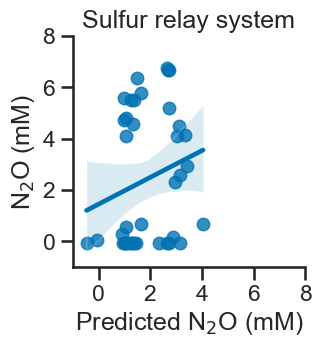

<Figure size 640x480 with 0 Axes>

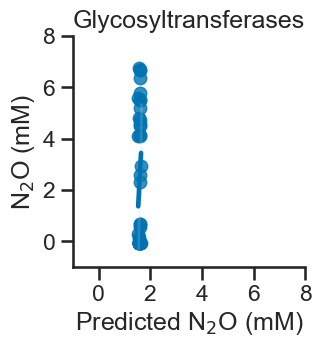

<Figure size 640x480 with 0 Axes>

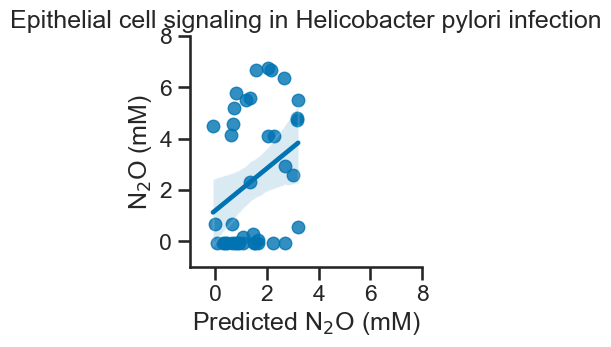

<Figure size 640x480 with 0 Axes>

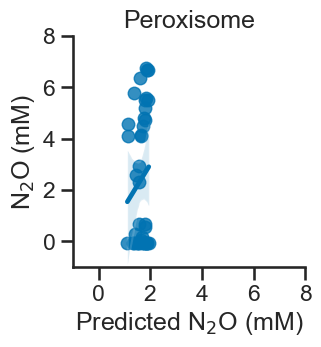

<Figure size 640x480 with 0 Axes>

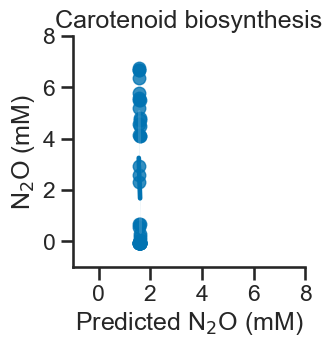

<Figure size 640x480 with 0 Axes>

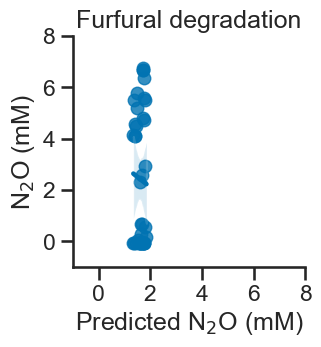

<Figure size 640x480 with 0 Axes>

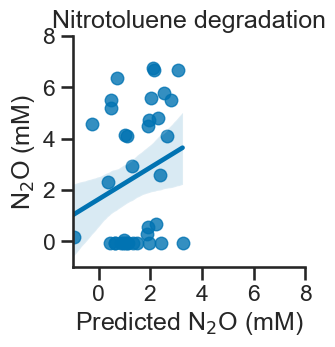

<Figure size 640x480 with 0 Axes>

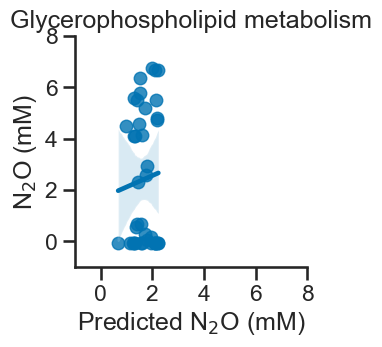

<Figure size 640x480 with 0 Axes>

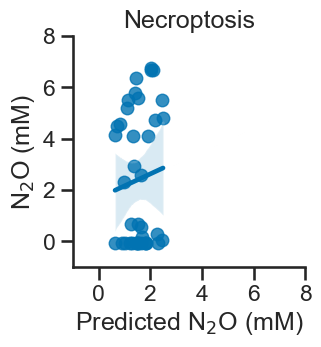

<Figure size 640x480 with 0 Axes>

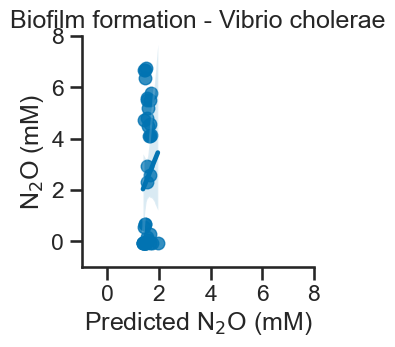

<Figure size 640x480 with 0 Axes>

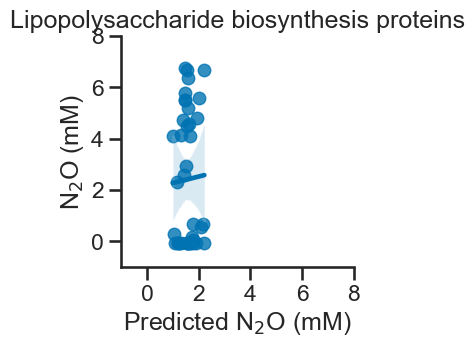

<Figure size 640x480 with 0 Axes>

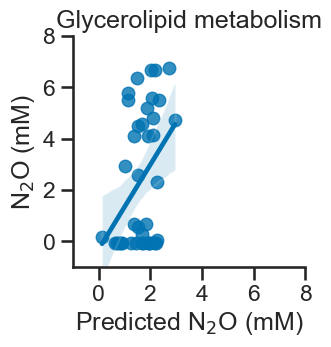

<Figure size 640x480 with 0 Axes>

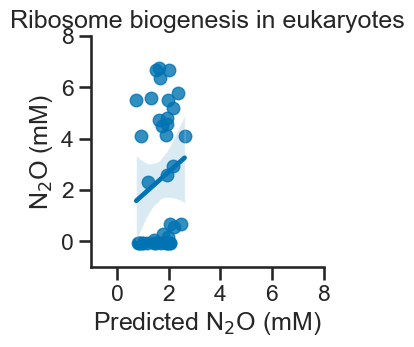

<Figure size 640x480 with 0 Axes>

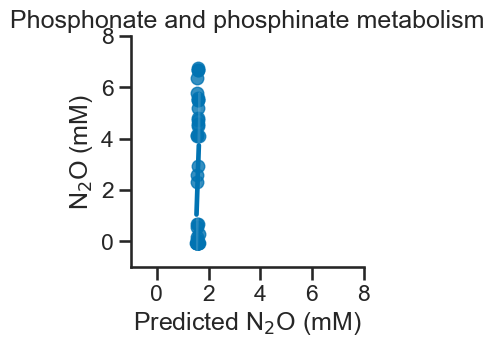

<Figure size 640x480 with 0 Axes>

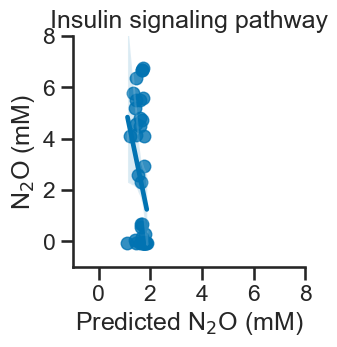

<Figure size 640x480 with 0 Axes>

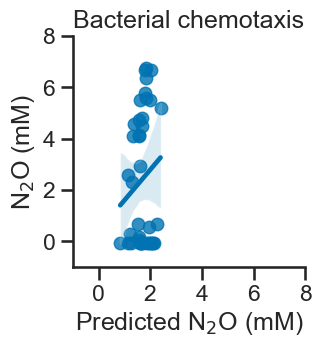

<Figure size 640x480 with 0 Axes>

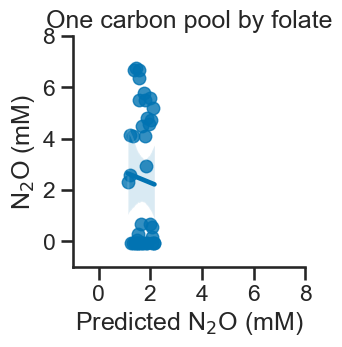

<Figure size 640x480 with 0 Axes>

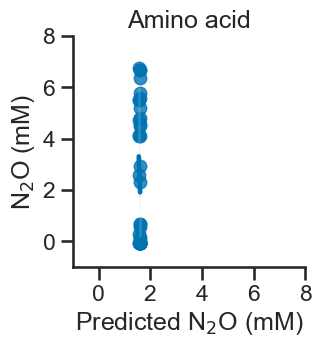

<Figure size 640x480 with 0 Axes>

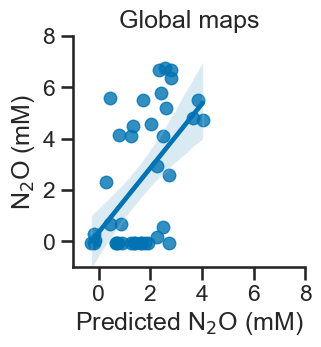

<Figure size 640x480 with 0 Axes>

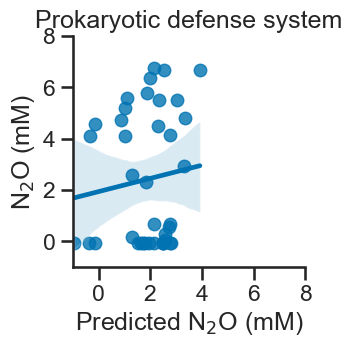

<Figure size 640x480 with 0 Axes>

In [277]:
from sklearn import linear_model
clf = linear_model.Lasso(alpha=0.1)
r_vals=[]
paths=[]
for path in n2o_corr_res.subpathway.unique():
    try:
        idx=n2o_corr_res[n2o_corr_res.subpathway ==path].index
        idx=list(set(idx)&set(syncom_zvals.index)&set(syncom_zvals2.index))


        tmp1=syncom_zvals.loc[idx]
        tmp2=syncom_zvals2.loc[idx]

        tmp=pd.DataFrame(index=idx,columns=pd.MultiIndex.from_tuples(list(tmp1.columns.values)+list(tmp2.columns.values)))
        for col in tmp1.columns:
            tmp.loc[tmp1.index,col]=tmp1.loc[:,col]
        for col in tmp2.columns:
            tmp.loc[tmp2.index,col]=tmp2.loc[:,col]
        X=tmp.values.astype(float).T
        X.shape

        y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide(mM)']
        y2=n2o_tmp.loc[x2.index,'Nitrous Oxide(mM)']
        y=np.array(list(y1.values)+list(y2.values)).astype(float)
        from sklearn.model_selection import train_test_split
        from sklearn.linear_model import LinearRegression
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
        reg = LinearRegression().fit(X_train, y_train)
        y_pred=reg.predict(X_test)

        plt.figure(figsize=(3,3))
        sns.regplot(x=y_pred,y=y_test)
        plt.xticks([0,2,4,6,8])
        plt.yticks([0,2,4,6,8])
        plt.ylim(-1,8)
        plt.xlim(-1,8)
        plt.xlabel('Predicted N$_2$O (mM)')
        plt.ylabel('N$_2$O (mM)')
        plt.title(path)
        plt.show()
        plt.clf()
        r_vals.append(linregress(y_pred,y_test).rvalue)
        paths.append(path)
    except:
        pass


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Out of sample R$^2$')

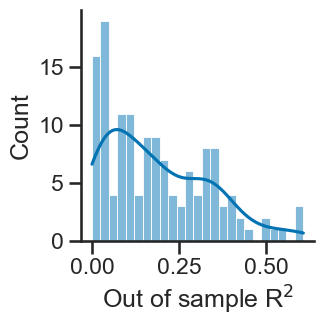

In [279]:
plt.figure(figsize=(3,3))
sns.histplot(np.array(r_vals)**2, kde=True,bins=25,line_kws={'color':'r'})
plt.xlabel('Out of sample R$^2$')
#plt.savefig('N2O-corr-R2.pdf',bbox_inches='tight')

In [281]:
np.array(paths)[np.array(r_vals)**2>=0.5]

array(['Unclassified', 'Butanoate metabolism',
       'Glycine, serine and threonine metabolism', 'Nitrogen metabolism',
       'Protein processing in endoplasmic reticulum'], dtype='<U58')

In [283]:
np.array(r_vals)[np.array(paths)=='Nitrogen metabolism']

array([0.73185371])

In [285]:
idx=n2o_corr_res[n2o_corr_res.subpathway =='Oxidative phosphorylation'].index
idx=list(set(idx)&set(syncom_zvals.index)&set(syncom_zvals2.index))
len(idx)

50

LinregressResult(slope=0.09560690328912637, intercept=2.1646229018629275, rvalue=0.257109473115958, pvalue=0.11408359531150217, stderr=0.05907711395544834, intercept_stderr=0.4380793533448448)
LinregressResult(slope=0.7458541852131277, intercept=0.7026006058209617, rvalue=0.7318537126399419, pvalue=1.1984571194243544e-07, stderr=0.114174806775542, intercept_stderr=0.39007181727688345)


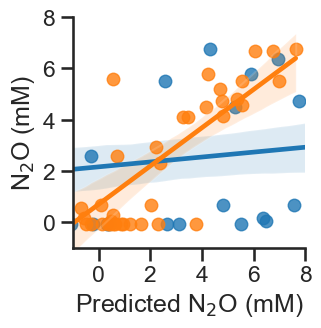

In [289]:
plt.figure(figsize=(3,3))
i=0
for path in ['Transporters','Nitrogen metabolism']:    
    idx=n2o_corr_res[n2o_corr_res.subpathway ==path].index
    idx=list(set(idx)&set(syncom_zvals.index)&set(syncom_zvals2.index))


    tmp1=syncom_zvals.loc[idx]
    tmp2=syncom_zvals2.loc[idx]

    tmp=pd.DataFrame(index=idx,columns=pd.MultiIndex.from_tuples(list(tmp1.columns.values)+list(tmp2.columns.values)))
    for col in tmp1.columns:
        tmp.loc[tmp1.index,col]=tmp1.loc[:,col]
    for col in tmp2.columns:
        tmp.loc[tmp2.index,col]=tmp2.loc[:,col]
    X=tmp.values.astype(float).T
    X.shape

    y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide(mM)']
    y2=n2o_tmp.loc[x2.index,'Nitrous Oxide(mM)']
    y=np.array(list(y1.values)+list(y2.values)).astype(float)

    from sklearn.linear_model import LinearRegression
    from sklearn.linear_model import LinearRegression
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
    reg = LinearRegression().fit(X_train, y_train)
    y_pred=reg.predict(X_test)

    print(linregress(y_pred,y_test))
    sns.regplot(x=y_pred,y=y_test,label=path,color=colors[i])
    plt.xticks([0,2,4,6,8])
    plt.yticks([0,2,4,6,8])
    plt.ylim(-1,8)
    plt.xlim(-1,8)
    plt.xlabel('Predicted N$_2$O (mM)')
    plt.ylabel('N$_2$O (mM)')
    i+=2



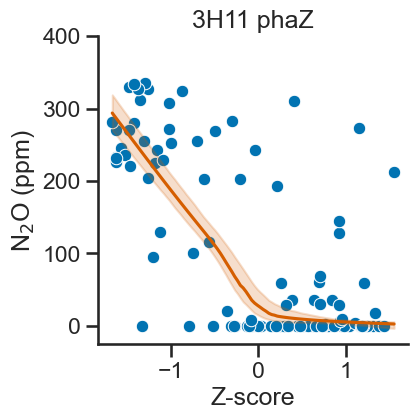

In [293]:
g='JGI|GW101-3H11|contig_1_2510'
name='3H11 phaZ'
x1=syncom_zvals.loc[g]
y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide']

x2=syncom_zvals2.loc[g]
y2=n2o_tmp.loc[x2.index,'Nitrous Oxide']

x=np.array(list(x1.values)+list(x2.values))
y=np.array(list(y1.values)+list(y2.values))

plt.figure(figsize=(4,4))
plt.xlabel('Z-score')
plt.ylabel('N$_2$O (ppm)')
plt.title(name)
sns.scatterplot(x=x,y=y)
plt.ylim(-25,400)

eval_x = np.linspace(min(x),max(x),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x, y, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.68)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)

#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)

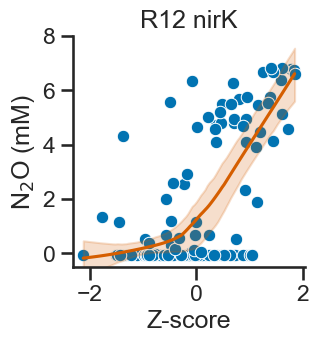

In [295]:
g='JGI|FW510-R12|contig_1_3383'
name='R12 nirK'
x1=syncom_zvals.loc[g]
y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide']

x2=syncom_zvals2.loc[g]
y2=n2o_tmp.loc[x2.index,'Nitrous Oxide']

x=np.array(list(x1.values)+list(x2.values))
y=np.array(list(y1.values)+list(y2.values))
y=y*slope+intercept

plt.figure(figsize=(3,3))
plt.xlabel('Z-score')
plt.ylabel('N$_2$O (mM)')
plt.title(name)
sns.scatterplot(x=x,y=y)
plt.ylim(-.5,8)

eval_x = np.linspace(min(x),max(x),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x, y, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.95)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)

#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)

plt.savefig('R12-nirK-vs-n2o.pdf',bbox_inches='tight')
plt.savefig('R12-nirK-vs-n2o.png',bbox_inches='tight',dpi=250)

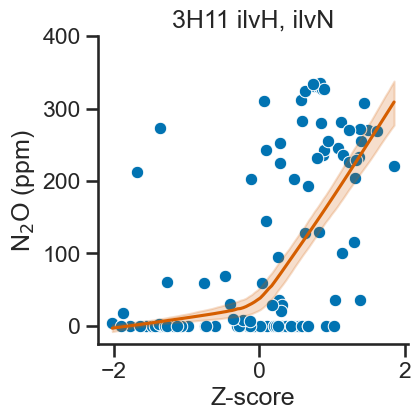

In [299]:

g='JGI|GW101-3H11|contig_1_3020'
name='3H11 ilvH, ilvN'
x1=syncom_zvals.loc[g]
y1=n2o_nitrate.loc[x1.index,'Nitrous Oxide']

x2=syncom_zvals2.loc[g]
y2=n2o_tmp.loc[x2.index,'Nitrous Oxide']

x=np.array(list(x1.values)+list(x2.values))
y=np.array(list(y1.values)+list(y2.values))

plt.figure(figsize=(4,4))
plt.xlabel('Z-score')
plt.ylabel('N$_2$O (ppm)')
plt.title(name)
sns.scatterplot(x=x,y=y)
plt.ylim(-25,400)

eval_x = np.linspace(min(x),max(x),100)
smoothed, bottom, top = lowess_with_confidence_bounds(x, y, eval_x, lowess_kw={"frac": 0.8},conf_interval=0.68)
plt.plot(eval_x,smoothed,color='r')
plt.fill_between(eval_x,bottom,top,color='r',alpha=0.2)

#fit = UnivariateSpline(x_vals,y_vals,k=1)
#xfit = np.linspace(min(x_vals),max(x_vals),100)
#plt.plot(xfit,fit(xfit),color='r',alpha=.75)